In [1]:
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

In [2]:
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps):
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
X_reshaped = reshape_data(X, time_steps=5)  # 5つの時間ステップを使用
y_reshaped = y[4:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

(178205, 5, 5) (178206,)


In [3]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# データをPyTorchのテンソルに変換
X_tensor = torch.tensor(X_reshaped, dtype=torch.float32)
y_tensor = torch.tensor(y_reshaped, dtype=torch.long)

# データセットとデータローダーの作成
dataset = TensorDataset(X_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])  # 最後の隠れ層の出力を使用
        return out

# モデルのインスタンスを作成
input_size = X_tensor.shape[2]  # 特徴量の次元数
hidden_size = 50  # LSTMの隠れ層のユニット数
output_size = 3   # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 学習
num_epochs = 50
for epoch in range(num_epochs):
    for inputs, labels in dataloader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')


AssertionError: Size mismatch between tensors

In [4]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

(178206, 5, 5) (178206,)


In [5]:
# データをPyTorchのテンソルに変換
X_tensor = torch.tensor(X_reshaped, dtype=torch.float32)
y_tensor = torch.tensor(y_reshaped, dtype=torch.long)

# データセットとデータローダーの作成
dataset = TensorDataset(X_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])  # 最後の隠れ層の出力を使用
        return out

# モデルのインスタンスを作成
input_size = X_tensor.shape[2]  # 特徴量の次元数
hidden_size = 50  # LSTMの隠れ層のユニット数
output_size = 3   # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [6]:
# 学習
num_epochs = 50
for epoch in range(num_epochs):
    for inputs, labels in dataloader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/50], Loss: 0.8784
Epoch [20/50], Loss: 0.6750
Epoch [30/50], Loss: 0.8382
Epoch [40/50], Loss: 0.6066
Epoch [50/50], Loss: 0.6606


In [5]:
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

In [8]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm  # tqdmをインポート

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

# データをPyTorchのテンソルに変換
X_tensor = torch.tensor(X_reshaped, dtype=torch.float32)
y_tensor = torch.tensor(y_reshaped, dtype=torch.long)

# データセットとデータローダーの作成
dataset = TensorDataset(X_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])  # 最後の隠れ層の出力を使用
        return out

# モデルのインスタンスを作成
input_size = X_tensor.shape[2]  # 特徴量の次元数
hidden_size = 50  # LSTMの隠れ層のユニット数
output_size = 3   # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 学習
num_epochs = 50
for epoch in range(num_epochs):
    # tqdmで進行状況バーを表示
    epoch_loss = 0
    with tqdm(total=len(dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)  # バッチが処理されるごとにバーを更新
            
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {epoch_loss / len(dataloader):.4f}')

(178206, 5, 5) (178206,)


Epoch 1/50: 100%|██████████| 5569/5569 [00:13<00:00, 421.93batch/s, loss=0.889]


Epoch [1/50], Average Loss: 0.7616


Epoch 2/50: 100%|██████████| 5569/5569 [00:13<00:00, 417.05batch/s, loss=0.72] 


Epoch [2/50], Average Loss: 0.7578


Epoch 3/50: 100%|██████████| 5569/5569 [00:13<00:00, 413.81batch/s, loss=0.8]  


Epoch [3/50], Average Loss: 0.7563


Epoch 4/50: 100%|██████████| 5569/5569 [00:13<00:00, 419.09batch/s, loss=0.625]


Epoch [4/50], Average Loss: 0.7550


Epoch 5/50: 100%|██████████| 5569/5569 [00:13<00:00, 408.85batch/s, loss=0.684]


Epoch [5/50], Average Loss: 0.7535


Epoch 6/50: 100%|██████████| 5569/5569 [00:13<00:00, 416.49batch/s, loss=1.01] 


Epoch [6/50], Average Loss: 0.7524


Epoch 7/50: 100%|██████████| 5569/5569 [00:13<00:00, 412.58batch/s, loss=0.578]


Epoch [7/50], Average Loss: 0.7522


Epoch 8/50: 100%|██████████| 5569/5569 [00:13<00:00, 410.01batch/s, loss=0.74] 


Epoch [8/50], Average Loss: 0.7514


Epoch 9/50: 100%|██████████| 5569/5569 [00:13<00:00, 404.41batch/s, loss=0.8]  


Epoch [9/50], Average Loss: 0.7507


Epoch 10/50: 100%|██████████| 5569/5569 [00:13<00:00, 408.29batch/s, loss=0.608]


Epoch [10/50], Average Loss: 0.7510


Epoch 11/50: 100%|██████████| 5569/5569 [00:13<00:00, 398.34batch/s, loss=0.687]


Epoch [11/50], Average Loss: 0.7507


Epoch 12/50: 100%|██████████| 5569/5569 [00:14<00:00, 395.71batch/s, loss=0.719]


Epoch [12/50], Average Loss: 0.7507


Epoch 13/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.01batch/s, loss=0.827]


Epoch [13/50], Average Loss: 0.7505


Epoch 14/50: 100%|██████████| 5569/5569 [00:13<00:00, 397.90batch/s, loss=0.632]


Epoch [14/50], Average Loss: 0.7504


Epoch 15/50: 100%|██████████| 5569/5569 [00:13<00:00, 407.41batch/s, loss=0.642]


Epoch [15/50], Average Loss: 0.7501


Epoch 16/50: 100%|██████████| 5569/5569 [00:13<00:00, 401.23batch/s, loss=0.759]


Epoch [16/50], Average Loss: 0.7502


Epoch 17/50: 100%|██████████| 5569/5569 [00:13<00:00, 397.98batch/s, loss=0.614]


Epoch [17/50], Average Loss: 0.7500


Epoch 18/50: 100%|██████████| 5569/5569 [00:14<00:00, 396.08batch/s, loss=0.58] 


Epoch [18/50], Average Loss: 0.7499


Epoch 19/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.42batch/s, loss=0.52] 


Epoch [19/50], Average Loss: 0.7497


Epoch 20/50: 100%|██████████| 5569/5569 [00:13<00:00, 399.31batch/s, loss=0.858]


Epoch [20/50], Average Loss: 0.7503


Epoch 21/50: 100%|██████████| 5569/5569 [00:13<00:00, 398.96batch/s, loss=0.745]


Epoch [21/50], Average Loss: 0.7500


Epoch 22/50: 100%|██████████| 5569/5569 [00:14<00:00, 383.72batch/s, loss=0.659]


Epoch [22/50], Average Loss: 0.7499


Epoch 23/50: 100%|██████████| 5569/5569 [00:14<00:00, 376.59batch/s, loss=0.645]


Epoch [23/50], Average Loss: 0.7494


Epoch 24/50: 100%|██████████| 5569/5569 [00:13<00:00, 409.55batch/s, loss=0.636]


Epoch [24/50], Average Loss: 0.7491


Epoch 25/50: 100%|██████████| 5569/5569 [00:13<00:00, 399.25batch/s, loss=0.69] 


Epoch [25/50], Average Loss: 0.7486


Epoch 26/50: 100%|██████████| 5569/5569 [00:14<00:00, 393.66batch/s, loss=0.503]


Epoch [26/50], Average Loss: 0.7485


Epoch 27/50: 100%|██████████| 5569/5569 [00:14<00:00, 390.60batch/s, loss=0.823]


Epoch [27/50], Average Loss: 0.7479


Epoch 28/50: 100%|██████████| 5569/5569 [00:14<00:00, 395.46batch/s, loss=0.95] 


Epoch [28/50], Average Loss: 0.7482


Epoch 29/50: 100%|██████████| 5569/5569 [00:13<00:00, 404.20batch/s, loss=0.777]


Epoch [29/50], Average Loss: 0.7482


Epoch 30/50: 100%|██████████| 5569/5569 [00:14<00:00, 391.70batch/s, loss=0.643]


Epoch [30/50], Average Loss: 0.7479


Epoch 31/50: 100%|██████████| 5569/5569 [00:13<00:00, 398.70batch/s, loss=0.586]


Epoch [31/50], Average Loss: 0.7472


Epoch 32/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.03batch/s, loss=0.781]


Epoch [32/50], Average Loss: 0.7472


Epoch 33/50: 100%|██████████| 5569/5569 [00:13<00:00, 401.91batch/s, loss=0.975]


Epoch [33/50], Average Loss: 0.7479


Epoch 34/50: 100%|██████████| 5569/5569 [00:13<00:00, 399.83batch/s, loss=0.751]


Epoch [34/50], Average Loss: 0.7475


Epoch 35/50: 100%|██████████| 5569/5569 [00:13<00:00, 408.70batch/s, loss=0.521]


Epoch [35/50], Average Loss: 0.7481


Epoch 36/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.10batch/s, loss=0.857]


Epoch [36/50], Average Loss: 0.7478


Epoch 37/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.61batch/s, loss=0.86] 


Epoch [37/50], Average Loss: 0.7482


Epoch 38/50: 100%|██████████| 5569/5569 [00:14<00:00, 395.54batch/s, loss=0.654]


Epoch [38/50], Average Loss: 0.7477


Epoch 39/50: 100%|██████████| 5569/5569 [00:13<00:00, 405.37batch/s, loss=0.669]


Epoch [39/50], Average Loss: 0.7478


Epoch 40/50: 100%|██████████| 5569/5569 [00:13<00:00, 402.53batch/s, loss=0.806]


Epoch [40/50], Average Loss: 0.7479


Epoch 41/50: 100%|██████████| 5569/5569 [00:13<00:00, 404.60batch/s, loss=0.661]


Epoch [41/50], Average Loss: 0.7476


Epoch 42/50: 100%|██████████| 5569/5569 [00:13<00:00, 401.44batch/s, loss=0.595]


Epoch [42/50], Average Loss: 0.7474


Epoch 43/50: 100%|██████████| 5569/5569 [00:13<00:00, 404.94batch/s, loss=0.788]


Epoch [43/50], Average Loss: 0.7477


Epoch 44/50: 100%|██████████| 5569/5569 [00:14<00:00, 396.23batch/s, loss=0.86] 


Epoch [44/50], Average Loss: 0.7479


Epoch 45/50: 100%|██████████| 5569/5569 [00:13<00:00, 403.02batch/s, loss=0.567]


Epoch [45/50], Average Loss: 0.7475


Epoch 46/50: 100%|██████████| 5569/5569 [00:14<00:00, 388.49batch/s, loss=0.621]


Epoch [46/50], Average Loss: 0.7475


Epoch 47/50: 100%|██████████| 5569/5569 [00:13<00:00, 403.30batch/s, loss=0.792]


Epoch [47/50], Average Loss: 0.7472


Epoch 48/50: 100%|██████████| 5569/5569 [00:13<00:00, 402.89batch/s, loss=0.696]


Epoch [48/50], Average Loss: 0.7474


Epoch 49/50: 100%|██████████| 5569/5569 [00:13<00:00, 400.96batch/s, loss=0.926]


Epoch [49/50], Average Loss: 0.7473


Epoch 50/50: 100%|██████████| 5569/5569 [00:13<00:00, 408.06batch/s, loss=0.714]


Epoch [50/50], Average Loss: 0.7476


In [6]:
# ここから！
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/50: 100%|██████████| 4456/4456 [00:09<00:00, 456.24batch/s, loss=1.05] 


Epoch [1/50], Average Loss: 0.7611


Epoch 2/50: 100%|██████████| 4456/4456 [00:10<00:00, 426.18batch/s, loss=0.334]


Epoch [2/50], Average Loss: 0.7557


Epoch 3/50: 100%|██████████| 4456/4456 [00:10<00:00, 415.57batch/s, loss=0.712]


Epoch [3/50], Average Loss: 0.7549


Epoch 4/50: 100%|██████████| 4456/4456 [00:10<00:00, 420.60batch/s, loss=0.747]


Epoch [4/50], Average Loss: 0.7554


Epoch 5/50: 100%|██████████| 4456/4456 [00:10<00:00, 416.61batch/s, loss=1.09] 


Epoch [5/50], Average Loss: 0.7541


Epoch 6/50: 100%|██████████| 4456/4456 [00:10<00:00, 405.21batch/s, loss=0.677]


Epoch [6/50], Average Loss: 0.7548


Epoch 7/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.66batch/s, loss=0.302]


Epoch [7/50], Average Loss: 0.7529


Epoch 8/50: 100%|██████████| 4456/4456 [00:10<00:00, 420.22batch/s, loss=0.341]


Epoch [8/50], Average Loss: 0.7529


Epoch 9/50: 100%|██████████| 4456/4456 [00:10<00:00, 418.00batch/s, loss=0.349]


Epoch [9/50], Average Loss: 0.7522


Epoch 10/50: 100%|██████████| 4456/4456 [00:10<00:00, 422.43batch/s, loss=1.57] 


Epoch [10/50], Average Loss: 0.7541


Epoch 11/50: 100%|██████████| 4456/4456 [00:10<00:00, 425.99batch/s, loss=0.771]


Epoch [11/50], Average Loss: 0.7526


Epoch 12/50: 100%|██████████| 4456/4456 [00:10<00:00, 420.57batch/s, loss=0.389]


Epoch [12/50], Average Loss: 0.7524


Epoch 13/50: 100%|██████████| 4456/4456 [00:10<00:00, 415.44batch/s, loss=1.19] 


Epoch [13/50], Average Loss: 0.7527


Epoch 14/50: 100%|██████████| 4456/4456 [00:10<00:00, 417.32batch/s, loss=0.338]


Epoch [14/50], Average Loss: 0.7524


Epoch 15/50: 100%|██████████| 4456/4456 [00:10<00:00, 407.95batch/s, loss=0.359]


Epoch [15/50], Average Loss: 0.7520


Epoch 16/50: 100%|██████████| 4456/4456 [00:10<00:00, 411.74batch/s, loss=0.277]


Epoch [16/50], Average Loss: 0.7520


Epoch 17/50: 100%|██████████| 4456/4456 [00:10<00:00, 405.43batch/s, loss=0.708]


Epoch [17/50], Average Loss: 0.7518


Epoch 18/50: 100%|██████████| 4456/4456 [00:10<00:00, 415.34batch/s, loss=0.331]


Epoch [18/50], Average Loss: 0.7513


Epoch 19/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.38batch/s, loss=1.16] 


Epoch [19/50], Average Loss: 0.7514


Epoch 20/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.73batch/s, loss=1.18] 


Epoch [20/50], Average Loss: 0.7512


Epoch 21/50: 100%|██████████| 4456/4456 [00:10<00:00, 411.62batch/s, loss=0.373]


Epoch [21/50], Average Loss: 0.7506


Epoch 22/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.22batch/s, loss=0.649]


Epoch [22/50], Average Loss: 0.7505


Epoch 23/50: 100%|██████████| 4456/4456 [00:10<00:00, 413.14batch/s, loss=0.67] 


Epoch [23/50], Average Loss: 0.7501


Epoch 24/50: 100%|██████████| 4456/4456 [00:10<00:00, 410.90batch/s, loss=0.327]


Epoch [24/50], Average Loss: 0.7505


Epoch 25/50: 100%|██████████| 4456/4456 [00:11<00:00, 403.47batch/s, loss=0.786]


Epoch [25/50], Average Loss: 0.7503


Epoch 26/50: 100%|██████████| 4456/4456 [00:10<00:00, 411.73batch/s, loss=0.752]


Epoch [26/50], Average Loss: 0.7507


Epoch 27/50: 100%|██████████| 4456/4456 [00:11<00:00, 404.46batch/s, loss=0.782]


Epoch [27/50], Average Loss: 0.7503


Epoch 28/50: 100%|██████████| 4456/4456 [00:10<00:00, 415.84batch/s, loss=1.19] 


Epoch [28/50], Average Loss: 0.7504


Epoch 29/50: 100%|██████████| 4456/4456 [00:10<00:00, 412.69batch/s, loss=1.19] 


Epoch [29/50], Average Loss: 0.7502


Epoch 30/50: 100%|██████████| 4456/4456 [00:10<00:00, 407.02batch/s, loss=1.1]  


Epoch [30/50], Average Loss: 0.7497


Epoch 31/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.67batch/s, loss=1.5]  


Epoch [31/50], Average Loss: 0.7499


Epoch 32/50: 100%|██████████| 4456/4456 [00:10<00:00, 413.80batch/s, loss=0.379]


Epoch [32/50], Average Loss: 0.7500


Epoch 33/50: 100%|██████████| 4456/4456 [00:10<00:00, 408.49batch/s, loss=1.19] 


Epoch [33/50], Average Loss: 0.7499


Epoch 34/50: 100%|██████████| 4456/4456 [00:10<00:00, 407.27batch/s, loss=0.402]


Epoch [34/50], Average Loss: 0.7498


Epoch 35/50: 100%|██████████| 4456/4456 [00:10<00:00, 406.96batch/s, loss=0.265]


Epoch [35/50], Average Loss: 0.7493


Epoch 36/50: 100%|██████████| 4456/4456 [00:10<00:00, 405.36batch/s, loss=0.716]


Epoch [36/50], Average Loss: 0.7494


Epoch 37/50: 100%|██████████| 4456/4456 [00:10<00:00, 405.77batch/s, loss=0.686]


Epoch [37/50], Average Loss: 0.7491


Epoch 38/50: 100%|██████████| 4456/4456 [00:10<00:00, 410.06batch/s, loss=0.3]  


Epoch [38/50], Average Loss: 0.7492


Epoch 39/50: 100%|██████████| 4456/4456 [00:10<00:00, 412.82batch/s, loss=0.998]


Epoch [39/50], Average Loss: 0.7491


Epoch 40/50: 100%|██████████| 4456/4456 [00:10<00:00, 412.27batch/s, loss=0.426]


Epoch [40/50], Average Loss: 0.7488


Epoch 41/50: 100%|██████████| 4456/4456 [00:10<00:00, 407.86batch/s, loss=0.197]


Epoch [41/50], Average Loss: 0.7490


Epoch 42/50: 100%|██████████| 4456/4456 [00:10<00:00, 406.68batch/s, loss=0.172]


Epoch [42/50], Average Loss: 0.7485


Epoch 43/50: 100%|██████████| 4456/4456 [00:10<00:00, 409.71batch/s, loss=0.754]


Epoch [43/50], Average Loss: 0.7482


Epoch 44/50: 100%|██████████| 4456/4456 [00:10<00:00, 417.58batch/s, loss=0.817]


Epoch [44/50], Average Loss: 0.7483


Epoch 45/50: 100%|██████████| 4456/4456 [00:10<00:00, 417.57batch/s, loss=1.2]  


Epoch [45/50], Average Loss: 0.7477


Epoch 46/50: 100%|██████████| 4456/4456 [00:10<00:00, 413.42batch/s, loss=0.272]


Epoch [46/50], Average Loss: 0.7475


Epoch 47/50: 100%|██████████| 4456/4456 [00:10<00:00, 413.45batch/s, loss=0.644]


Epoch [47/50], Average Loss: 0.7476


Epoch 48/50: 100%|██████████| 4456/4456 [00:10<00:00, 414.07batch/s, loss=0.662]


Epoch [48/50], Average Loss: 0.7477


Epoch 49/50: 100%|██████████| 4456/4456 [00:10<00:00, 427.93batch/s, loss=1.18] 


Epoch [49/50], Average Loss: 0.7480


Epoch 50/50: 100%|██████████| 4456/4456 [00:10<00:00, 411.37batch/s, loss=0.801]


Epoch [50/50], Average Loss: 0.7474


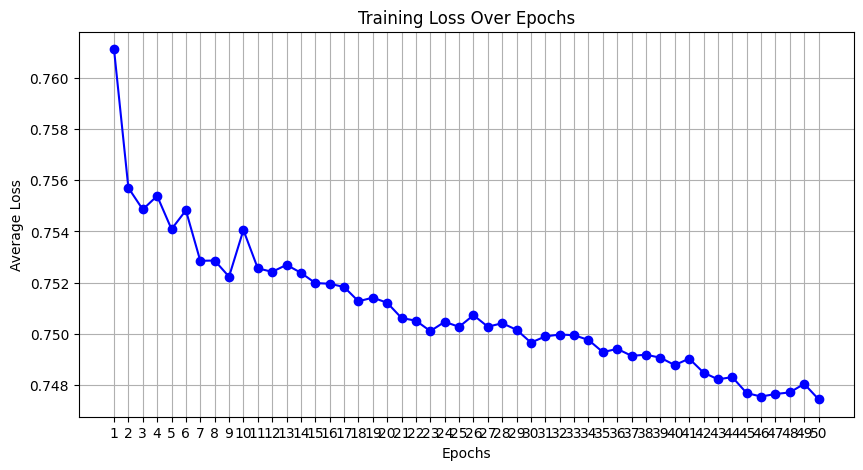

In [7]:
import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 50
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

In [21]:
# エポック数：100
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/100: 100%|██████████| 4456/4456 [00:10<00:00, 429.93batch/s, loss=0.738]


Epoch [1/100], Average Loss: 0.7640


Epoch 2/100: 100%|██████████| 4456/4456 [00:11<00:00, 402.90batch/s, loss=0.237]


Epoch [2/100], Average Loss: 0.7576


Epoch 3/100: 100%|██████████| 4456/4456 [00:10<00:00, 412.66batch/s, loss=0.754]


Epoch [3/100], Average Loss: 0.7562


Epoch 4/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.74batch/s, loss=0.228]


Epoch [4/100], Average Loss: 0.7561


Epoch 5/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.33batch/s, loss=0.596]


Epoch [5/100], Average Loss: 0.7553


Epoch 6/100: 100%|██████████| 4456/4456 [00:11<00:00, 399.47batch/s, loss=0.721]


Epoch [6/100], Average Loss: 0.7551


Epoch 7/100: 100%|██████████| 4456/4456 [00:11<00:00, 395.28batch/s, loss=1.89] 


Epoch [7/100], Average Loss: 0.7550


Epoch 8/100: 100%|██████████| 4456/4456 [00:11<00:00, 398.97batch/s, loss=0.35] 


Epoch [8/100], Average Loss: 0.7548


Epoch 9/100: 100%|██████████| 4456/4456 [00:11<00:00, 402.21batch/s, loss=1.45] 


Epoch [9/100], Average Loss: 0.7549


Epoch 10/100: 100%|██████████| 4456/4456 [00:11<00:00, 402.93batch/s, loss=0.292]


Epoch [10/100], Average Loss: 0.7543


Epoch 11/100: 100%|██████████| 4456/4456 [00:11<00:00, 400.70batch/s, loss=1.02] 


Epoch [11/100], Average Loss: 0.7545


Epoch 12/100: 100%|██████████| 4456/4456 [00:11<00:00, 396.88batch/s, loss=0.344]


Epoch [12/100], Average Loss: 0.7545


Epoch 13/100: 100%|██████████| 4456/4456 [00:12<00:00, 369.13batch/s, loss=0.311]


Epoch [13/100], Average Loss: 0.7544


Epoch 14/100: 100%|██████████| 4456/4456 [00:11<00:00, 396.27batch/s, loss=0.698]


Epoch [14/100], Average Loss: 0.7545


Epoch 15/100: 100%|██████████| 4456/4456 [00:11<00:00, 402.80batch/s, loss=0.309]


Epoch [15/100], Average Loss: 0.7544


Epoch 16/100: 100%|██████████| 4456/4456 [00:11<00:00, 389.49batch/s, loss=0.722]


Epoch [16/100], Average Loss: 0.7546


Epoch 17/100: 100%|██████████| 4456/4456 [00:11<00:00, 395.87batch/s, loss=0.316]


Epoch [17/100], Average Loss: 0.7545


Epoch 18/100: 100%|██████████| 4456/4456 [00:11<00:00, 404.38batch/s, loss=0.719]


Epoch [18/100], Average Loss: 0.7545


Epoch 19/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.12batch/s, loss=0.73] 


Epoch [19/100], Average Loss: 0.7543


Epoch 20/100: 100%|██████████| 4456/4456 [00:10<00:00, 412.62batch/s, loss=0.799]


Epoch [20/100], Average Loss: 0.7546


Epoch 21/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.88batch/s, loss=0.329]


Epoch [21/100], Average Loss: 0.7544


Epoch 22/100: 100%|██████████| 4456/4456 [00:10<00:00, 409.99batch/s, loss=1.14] 


Epoch [22/100], Average Loss: 0.7544


Epoch 23/100: 100%|██████████| 4456/4456 [00:10<00:00, 410.93batch/s, loss=0.366]


Epoch [23/100], Average Loss: 0.7545


Epoch 24/100: 100%|██████████| 4456/4456 [00:10<00:00, 412.21batch/s, loss=0.475]


Epoch [24/100], Average Loss: 0.7548


Epoch 25/100: 100%|██████████| 4456/4456 [00:10<00:00, 410.91batch/s, loss=0.722]


Epoch [25/100], Average Loss: 0.7547


Epoch 26/100: 100%|██████████| 4456/4456 [00:10<00:00, 407.08batch/s, loss=1.17] 


Epoch [26/100], Average Loss: 0.7547


Epoch 27/100: 100%|██████████| 4456/4456 [00:10<00:00, 414.50batch/s, loss=1.12] 


Epoch [27/100], Average Loss: 0.7548


Epoch 28/100: 100%|██████████| 4456/4456 [00:10<00:00, 417.73batch/s, loss=0.792]


Epoch [28/100], Average Loss: 0.7543


Epoch 29/100: 100%|██████████| 4456/4456 [00:10<00:00, 411.78batch/s, loss=1.12] 


Epoch [29/100], Average Loss: 0.7549


Epoch 30/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.88batch/s, loss=0.728]


Epoch [30/100], Average Loss: 0.7544


Epoch 31/100: 100%|██████████| 4456/4456 [00:10<00:00, 413.27batch/s, loss=0.761]


Epoch [31/100], Average Loss: 0.7544


Epoch 32/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.09batch/s, loss=1.36] 


Epoch [32/100], Average Loss: 0.7547


Epoch 33/100: 100%|██████████| 4456/4456 [00:10<00:00, 420.05batch/s, loss=0.614]


Epoch [33/100], Average Loss: 0.7542


Epoch 34/100: 100%|██████████| 4456/4456 [00:10<00:00, 419.31batch/s, loss=0.308]


Epoch [34/100], Average Loss: 0.7543


Epoch 35/100: 100%|██████████| 4456/4456 [00:10<00:00, 410.38batch/s, loss=0.719]


Epoch [35/100], Average Loss: 0.7545


Epoch 36/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.18batch/s, loss=0.764]


Epoch [36/100], Average Loss: 0.7549


Epoch 37/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.07batch/s, loss=0.682]


Epoch [37/100], Average Loss: 0.7546


Epoch 38/100: 100%|██████████| 4456/4456 [00:10<00:00, 420.11batch/s, loss=0.335]


Epoch [38/100], Average Loss: 0.7546


Epoch 39/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.21batch/s, loss=1.05] 


Epoch [39/100], Average Loss: 0.7544


Epoch 40/100: 100%|██████████| 4456/4456 [00:10<00:00, 405.30batch/s, loss=1.15] 


Epoch [40/100], Average Loss: 0.7544


Epoch 41/100: 100%|██████████| 4456/4456 [00:10<00:00, 419.30batch/s, loss=0.32] 


Epoch [41/100], Average Loss: 0.7531


Epoch 42/100: 100%|██████████| 4456/4456 [00:10<00:00, 417.96batch/s, loss=0.258]


Epoch [42/100], Average Loss: 0.7530


Epoch 43/100: 100%|██████████| 4456/4456 [00:10<00:00, 415.26batch/s, loss=0.739]


Epoch [43/100], Average Loss: 0.7526


Epoch 44/100: 100%|██████████| 4456/4456 [00:10<00:00, 414.09batch/s, loss=0.314]


Epoch [44/100], Average Loss: 0.7523


Epoch 45/100: 100%|██████████| 4456/4456 [00:10<00:00, 405.77batch/s, loss=0.361]


Epoch [45/100], Average Loss: 0.7520


Epoch 46/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.72batch/s, loss=0.362]


Epoch [46/100], Average Loss: 0.7521


Epoch 47/100: 100%|██████████| 4456/4456 [00:10<00:00, 417.32batch/s, loss=0.706]


Epoch [47/100], Average Loss: 0.7515


Epoch 48/100: 100%|██████████| 4456/4456 [00:10<00:00, 421.42batch/s, loss=0.806]


Epoch [48/100], Average Loss: 0.7517


Epoch 49/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.65batch/s, loss=1.13] 


Epoch [49/100], Average Loss: 0.7516


Epoch 50/100: 100%|██████████| 4456/4456 [00:10<00:00, 421.09batch/s, loss=0.675]


Epoch [50/100], Average Loss: 0.7514


Epoch 51/100: 100%|██████████| 4456/4456 [00:10<00:00, 413.01batch/s, loss=1.14] 


Epoch [51/100], Average Loss: 0.7514


Epoch 52/100: 100%|██████████| 4456/4456 [00:10<00:00, 414.40batch/s, loss=1.43] 


Epoch [52/100], Average Loss: 0.7513


Epoch 53/100: 100%|██████████| 4456/4456 [00:10<00:00, 412.19batch/s, loss=1.08] 


Epoch [53/100], Average Loss: 0.7513


Epoch 54/100: 100%|██████████| 4456/4456 [00:10<00:00, 409.74batch/s, loss=0.276]


Epoch [54/100], Average Loss: 0.7508


Epoch 55/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.31batch/s, loss=1.16] 


Epoch [55/100], Average Loss: 0.7506


Epoch 56/100: 100%|██████████| 4456/4456 [00:10<00:00, 421.29batch/s, loss=0.655]


Epoch [56/100], Average Loss: 0.7505


Epoch 57/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.71batch/s, loss=0.305]


Epoch [57/100], Average Loss: 0.7503


Epoch 58/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.91batch/s, loss=0.79] 


Epoch [58/100], Average Loss: 0.7503


Epoch 59/100: 100%|██████████| 4456/4456 [00:10<00:00, 409.17batch/s, loss=0.277]


Epoch [59/100], Average Loss: 0.7502


Epoch 60/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.35batch/s, loss=0.687]


Epoch [60/100], Average Loss: 0.7500


Epoch 61/100: 100%|██████████| 4456/4456 [00:11<00:00, 403.89batch/s, loss=1.3]  


Epoch [61/100], Average Loss: 0.7504


Epoch 62/100: 100%|██████████| 4456/4456 [00:11<00:00, 404.94batch/s, loss=1.13] 


Epoch [62/100], Average Loss: 0.7503


Epoch 63/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.34batch/s, loss=1.1]  


Epoch [63/100], Average Loss: 0.7500


Epoch 64/100: 100%|██████████| 4456/4456 [00:11<00:00, 404.08batch/s, loss=1.08] 


Epoch [64/100], Average Loss: 0.7501


Epoch 65/100: 100%|██████████| 4456/4456 [00:10<00:00, 407.58batch/s, loss=0.874]


Epoch [65/100], Average Loss: 0.7497


Epoch 66/100: 100%|██████████| 4456/4456 [00:11<00:00, 400.11batch/s, loss=0.544]


Epoch [66/100], Average Loss: 0.7497


Epoch 67/100: 100%|██████████| 4456/4456 [00:11<00:00, 400.74batch/s, loss=0.61] 


Epoch [67/100], Average Loss: 0.7497


Epoch 68/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.15batch/s, loss=1.14] 


Epoch [68/100], Average Loss: 0.7498


Epoch 69/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.88batch/s, loss=0.843]


Epoch [69/100], Average Loss: 0.7498


Epoch 70/100: 100%|██████████| 4456/4456 [00:10<00:00, 411.68batch/s, loss=1.18] 


Epoch [70/100], Average Loss: 0.7504


Epoch 71/100: 100%|██████████| 4456/4456 [00:10<00:00, 414.29batch/s, loss=0.2]  


Epoch [71/100], Average Loss: 0.7498


Epoch 72/100: 100%|██████████| 4456/4456 [00:10<00:00, 405.70batch/s, loss=0.394]


Epoch [72/100], Average Loss: 0.7494


Epoch 73/100: 100%|██████████| 4456/4456 [00:10<00:00, 418.10batch/s, loss=0.542]


Epoch [73/100], Average Loss: 0.7494


Epoch 74/100: 100%|██████████| 4456/4456 [00:11<00:00, 403.57batch/s, loss=0.314]


Epoch [74/100], Average Loss: 0.7494


Epoch 75/100: 100%|██████████| 4456/4456 [00:10<00:00, 411.02batch/s, loss=0.285]


Epoch [75/100], Average Loss: 0.7494


Epoch 76/100: 100%|██████████| 4456/4456 [00:10<00:00, 419.64batch/s, loss=1.6]  


Epoch [76/100], Average Loss: 0.7490


Epoch 77/100: 100%|██████████| 4456/4456 [00:10<00:00, 421.24batch/s, loss=1.53] 


Epoch [77/100], Average Loss: 0.7493


Epoch 78/100: 100%|██████████| 4456/4456 [00:10<00:00, 415.07batch/s, loss=0.315]


Epoch [78/100], Average Loss: 0.7492


Epoch 79/100: 100%|██████████| 4456/4456 [00:10<00:00, 415.42batch/s, loss=0.279]


Epoch [79/100], Average Loss: 0.7512


Epoch 80/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.80batch/s, loss=0.363]


Epoch [80/100], Average Loss: 0.7491


Epoch 81/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.67batch/s, loss=0.666]


Epoch [81/100], Average Loss: 0.7491


Epoch 82/100: 100%|██████████| 4456/4456 [00:10<00:00, 416.87batch/s, loss=0.276]


Epoch [82/100], Average Loss: 0.7489


Epoch 83/100: 100%|██████████| 4456/4456 [00:10<00:00, 409.15batch/s, loss=0.265]


Epoch [83/100], Average Loss: 0.7489


Epoch 84/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.10batch/s, loss=1.25] 


Epoch [84/100], Average Loss: 0.7491


Epoch 85/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.13batch/s, loss=0.696]


Epoch [85/100], Average Loss: 0.7490


Epoch 86/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.45batch/s, loss=0.347]


Epoch [86/100], Average Loss: 0.7485


Epoch 87/100: 100%|██████████| 4456/4456 [00:10<00:00, 411.07batch/s, loss=0.3]  


Epoch [87/100], Average Loss: 0.7486


Epoch 88/100: 100%|██████████| 4456/4456 [00:10<00:00, 412.06batch/s, loss=0.76] 


Epoch [88/100], Average Loss: 0.7489


Epoch 89/100: 100%|██████████| 4456/4456 [00:10<00:00, 415.81batch/s, loss=0.667]


Epoch [89/100], Average Loss: 0.7487


Epoch 90/100: 100%|██████████| 4456/4456 [00:11<00:00, 401.74batch/s, loss=0.277]


Epoch [90/100], Average Loss: 0.7481


Epoch 91/100: 100%|██████████| 4456/4456 [00:10<00:00, 411.56batch/s, loss=0.316]


Epoch [91/100], Average Loss: 0.7483


Epoch 92/100: 100%|██████████| 4456/4456 [00:10<00:00, 414.05batch/s, loss=0.696]


Epoch [92/100], Average Loss: 0.7486


Epoch 93/100: 100%|██████████| 4456/4456 [00:10<00:00, 417.17batch/s, loss=1.27] 


Epoch [93/100], Average Loss: 0.7487


Epoch 94/100: 100%|██████████| 4456/4456 [00:10<00:00, 410.19batch/s, loss=0.333]


Epoch [94/100], Average Loss: 0.7481


Epoch 95/100: 100%|██████████| 4456/4456 [00:10<00:00, 408.44batch/s, loss=1.83] 


Epoch [95/100], Average Loss: 0.7485


Epoch 96/100: 100%|██████████| 4456/4456 [00:10<00:00, 406.82batch/s, loss=0.757]


Epoch [96/100], Average Loss: 0.7485


Epoch 97/100: 100%|██████████| 4456/4456 [00:10<00:00, 409.36batch/s, loss=1.16] 


Epoch [97/100], Average Loss: 0.7486


Epoch 98/100: 100%|██████████| 4456/4456 [00:10<00:00, 405.42batch/s, loss=1.05] 


Epoch [98/100], Average Loss: 0.7480


Epoch 99/100: 100%|██████████| 4456/4456 [00:11<00:00, 402.51batch/s, loss=0.687]


Epoch [99/100], Average Loss: 0.7481


Epoch 100/100: 100%|██████████| 4456/4456 [00:10<00:00, 407.11batch/s, loss=0.359]


Epoch [100/100], Average Loss: 0.7481


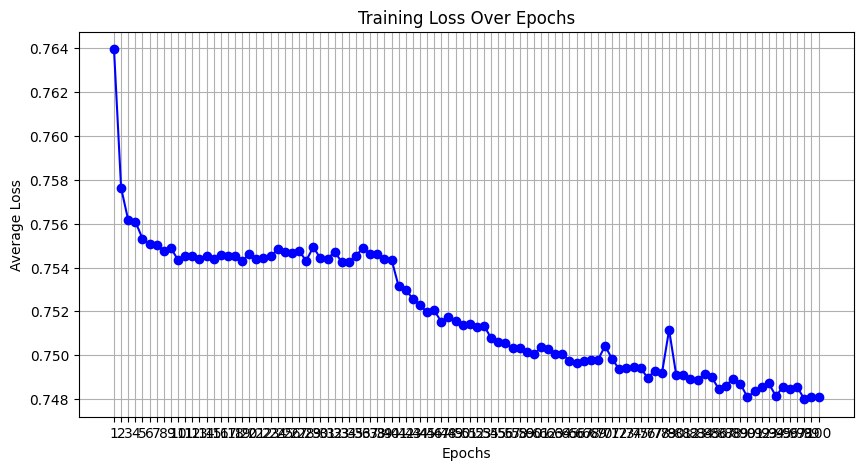

In [22]:
import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 100
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

In [2]:
# ここから
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

(178206, 5, 5) (178206,)


In [3]:
# エポック数；120
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/120: 100%|██████████| 4456/4456 [00:10<00:00, 441.81batch/s, loss=0.336]


Epoch [1/120], Average Loss: 0.7622


Epoch 2/120: 100%|██████████| 4456/4456 [00:10<00:00, 420.50batch/s, loss=1.08] 


Epoch [2/120], Average Loss: 0.7585


Epoch 3/120: 100%|██████████| 4456/4456 [00:10<00:00, 418.68batch/s, loss=0.282]


Epoch [3/120], Average Loss: 0.7567


Epoch 4/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.91batch/s, loss=0.31] 


Epoch [4/120], Average Loss: 0.7558


Epoch 5/120: 100%|██████████| 4456/4456 [00:10<00:00, 414.71batch/s, loss=0.785]


Epoch [5/120], Average Loss: 0.7557


Epoch 6/120: 100%|██████████| 4456/4456 [00:10<00:00, 419.22batch/s, loss=0.731]


Epoch [6/120], Average Loss: 0.7545


Epoch 7/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.40batch/s, loss=0.314]


Epoch [7/120], Average Loss: 0.7534


Epoch 8/120: 100%|██████████| 4456/4456 [00:10<00:00, 406.15batch/s, loss=0.952]


Epoch [8/120], Average Loss: 0.7522


Epoch 9/120: 100%|██████████| 4456/4456 [00:11<00:00, 404.41batch/s, loss=0.699]


Epoch [9/120], Average Loss: 0.7525


Epoch 10/120: 100%|██████████| 4456/4456 [00:11<00:00, 399.17batch/s, loss=1.19] 


Epoch [10/120], Average Loss: 0.7523


Epoch 11/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.35batch/s, loss=0.792]


Epoch [11/120], Average Loss: 0.7519


Epoch 12/120: 100%|██████████| 4456/4456 [00:10<00:00, 409.35batch/s, loss=0.729]


Epoch [12/120], Average Loss: 0.7517


Epoch 13/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.84batch/s, loss=0.24] 


Epoch [13/120], Average Loss: 0.7516


Epoch 14/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.56batch/s, loss=0.328]


Epoch [14/120], Average Loss: 0.7512


Epoch 15/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.45batch/s, loss=0.751]


Epoch [15/120], Average Loss: 0.7514


Epoch 16/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.17batch/s, loss=1.29] 


Epoch [16/120], Average Loss: 0.7516


Epoch 17/120: 100%|██████████| 4456/4456 [00:11<00:00, 405.02batch/s, loss=1.06] 


Epoch [17/120], Average Loss: 0.7516


Epoch 18/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.80batch/s, loss=0.774]


Epoch [18/120], Average Loss: 0.7518


Epoch 19/120: 100%|██████████| 4456/4456 [00:11<00:00, 398.59batch/s, loss=1.13] 


Epoch [19/120], Average Loss: 0.7534


Epoch 20/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.30batch/s, loss=1.2]  


Epoch [20/120], Average Loss: 0.7519


Epoch 21/120: 100%|██████████| 4456/4456 [00:11<00:00, 398.68batch/s, loss=0.886]


Epoch [21/120], Average Loss: 0.7510


Epoch 22/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.38batch/s, loss=0.248]


Epoch [22/120], Average Loss: 0.7507


Epoch 23/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.58batch/s, loss=0.757]


Epoch [23/120], Average Loss: 0.7506


Epoch 24/120: 100%|██████████| 4456/4456 [00:11<00:00, 399.21batch/s, loss=1.43] 


Epoch [24/120], Average Loss: 0.7503


Epoch 25/120: 100%|██████████| 4456/4456 [00:11<00:00, 404.01batch/s, loss=1.18] 


Epoch [25/120], Average Loss: 0.7504


Epoch 26/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.21batch/s, loss=0.729]


Epoch [26/120], Average Loss: 0.7508


Epoch 27/120: 100%|██████████| 4456/4456 [00:10<00:00, 413.27batch/s, loss=0.857]


Epoch [27/120], Average Loss: 0.7502


Epoch 28/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.70batch/s, loss=0.274]


Epoch [28/120], Average Loss: 0.7499


Epoch 29/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.57batch/s, loss=1.12] 


Epoch [29/120], Average Loss: 0.7495


Epoch 30/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.74batch/s, loss=0.808]


Epoch [30/120], Average Loss: 0.7493


Epoch 31/120: 100%|██████████| 4456/4456 [00:11<00:00, 397.72batch/s, loss=0.952]


Epoch [31/120], Average Loss: 0.7491


Epoch 32/120: 100%|██████████| 4456/4456 [00:11<00:00, 390.46batch/s, loss=0.791]


Epoch [32/120], Average Loss: 0.7489


Epoch 33/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.22batch/s, loss=0.585]


Epoch [33/120], Average Loss: 0.7486


Epoch 34/120: 100%|██████████| 4456/4456 [00:11<00:00, 404.27batch/s, loss=0.307]


Epoch [34/120], Average Loss: 0.7487


Epoch 35/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.61batch/s, loss=0.696]


Epoch [35/120], Average Loss: 0.7485


Epoch 36/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.07batch/s, loss=0.724]


Epoch [36/120], Average Loss: 0.7481


Epoch 37/120: 100%|██████████| 4456/4456 [00:11<00:00, 398.38batch/s, loss=1.19] 


Epoch [37/120], Average Loss: 0.7482


Epoch 38/120: 100%|██████████| 4456/4456 [00:11<00:00, 380.38batch/s, loss=0.751]


Epoch [38/120], Average Loss: 0.7480


Epoch 39/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.01batch/s, loss=0.791]


Epoch [39/120], Average Loss: 0.7477


Epoch 40/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.91batch/s, loss=1.1]  


Epoch [40/120], Average Loss: 0.7477


Epoch 41/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.77batch/s, loss=1.14] 


Epoch [41/120], Average Loss: 0.7473


Epoch 42/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.02batch/s, loss=0.812]


Epoch [42/120], Average Loss: 0.7470


Epoch 43/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.95batch/s, loss=0.939]


Epoch [43/120], Average Loss: 0.7470


Epoch 44/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.95batch/s, loss=0.632]


Epoch [44/120], Average Loss: 0.7471


Epoch 45/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.30batch/s, loss=0.632]


Epoch [45/120], Average Loss: 0.7475


Epoch 46/120: 100%|██████████| 4456/4456 [00:11<00:00, 398.52batch/s, loss=1.08] 


Epoch [46/120], Average Loss: 0.7472


Epoch 47/120: 100%|██████████| 4456/4456 [00:11<00:00, 395.07batch/s, loss=0.639]


Epoch [47/120], Average Loss: 0.7468


Epoch 48/120: 100%|██████████| 4456/4456 [00:11<00:00, 392.13batch/s, loss=1.09] 


Epoch [48/120], Average Loss: 0.7466


Epoch 49/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.47batch/s, loss=0.774]


Epoch [49/120], Average Loss: 0.7459


Epoch 50/120: 100%|██████████| 4456/4456 [00:10<00:00, 412.19batch/s, loss=0.675]


Epoch [50/120], Average Loss: 0.7461


Epoch 51/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.53batch/s, loss=0.307]


Epoch [51/120], Average Loss: 0.7456


Epoch 52/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.15batch/s, loss=1.08] 


Epoch [52/120], Average Loss: 0.7459


Epoch 53/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.28batch/s, loss=1.53] 


Epoch [53/120], Average Loss: 0.7453


Epoch 54/120: 100%|██████████| 4456/4456 [00:11<00:00, 396.54batch/s, loss=0.725]


Epoch [54/120], Average Loss: 0.7449


Epoch 55/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.57batch/s, loss=0.742]


Epoch [55/120], Average Loss: 0.7448


Epoch 56/120: 100%|██████████| 4456/4456 [00:11<00:00, 399.65batch/s, loss=0.694]


Epoch [56/120], Average Loss: 0.7445


Epoch 57/120: 100%|██████████| 4456/4456 [00:11<00:00, 402.34batch/s, loss=0.611]


Epoch [57/120], Average Loss: 0.7442


Epoch 58/120: 100%|██████████| 4456/4456 [00:11<00:00, 400.72batch/s, loss=0.967]


Epoch [58/120], Average Loss: 0.7436


Epoch 59/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.32batch/s, loss=0.86] 


Epoch [59/120], Average Loss: 0.7431


Epoch 60/120: 100%|██████████| 4456/4456 [00:10<00:00, 410.93batch/s, loss=0.779]


Epoch [60/120], Average Loss: 0.7429


Epoch 61/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.63batch/s, loss=0.83] 


Epoch [61/120], Average Loss: 0.7426


Epoch 62/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.53batch/s, loss=0.741]


Epoch [62/120], Average Loss: 0.7423


Epoch 63/120: 100%|██████████| 4456/4456 [00:11<00:00, 399.87batch/s, loss=0.356]


Epoch [63/120], Average Loss: 0.7421


Epoch 64/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.69batch/s, loss=0.676]


Epoch [64/120], Average Loss: 0.7422


Epoch 65/120: 100%|██████████| 4456/4456 [00:11<00:00, 397.41batch/s, loss=1.08] 


Epoch [65/120], Average Loss: 0.7420


Epoch 66/120: 100%|██████████| 4456/4456 [00:10<00:00, 406.33batch/s, loss=1.09] 


Epoch [66/120], Average Loss: 0.7418


Epoch 67/120: 100%|██████████| 4456/4456 [00:11<00:00, 401.53batch/s, loss=1.02] 


Epoch [67/120], Average Loss: 0.7421


Epoch 68/120: 100%|██████████| 4456/4456 [00:10<00:00, 408.36batch/s, loss=0.374]


Epoch [68/120], Average Loss: 0.7419


Epoch 69/120: 100%|██████████| 4456/4456 [00:10<00:00, 409.61batch/s, loss=0.713]


Epoch [69/120], Average Loss: 0.7411


Epoch 70/120: 100%|██████████| 4456/4456 [00:10<00:00, 410.25batch/s, loss=1.23] 


Epoch [70/120], Average Loss: 0.7415


Epoch 71/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.24batch/s, loss=0.844]


Epoch [71/120], Average Loss: 0.7411


Epoch 72/120: 100%|██████████| 4456/4456 [00:11<00:00, 399.81batch/s, loss=0.759]


Epoch [72/120], Average Loss: 0.7412


Epoch 73/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.65batch/s, loss=0.317]


Epoch [73/120], Average Loss: 0.7411


Epoch 74/120: 100%|██████████| 4456/4456 [00:11<00:00, 395.91batch/s, loss=0.303]


Epoch [74/120], Average Loss: 0.7410


Epoch 75/120: 100%|██████████| 4456/4456 [00:11<00:00, 398.63batch/s, loss=0.744]


Epoch [75/120], Average Loss: 0.7406


Epoch 76/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.50batch/s, loss=0.727]


Epoch [76/120], Average Loss: 0.7410


Epoch 77/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.34batch/s, loss=0.816]


Epoch [77/120], Average Loss: 0.7404


Epoch 78/120: 100%|██████████| 4456/4456 [00:11<00:00, 391.47batch/s, loss=0.578]


Epoch [78/120], Average Loss: 0.7407


Epoch 79/120: 100%|██████████| 4456/4456 [00:11<00:00, 394.20batch/s, loss=1.19] 


Epoch [79/120], Average Loss: 0.7410


Epoch 80/120: 100%|██████████| 4456/4456 [00:10<00:00, 417.16batch/s, loss=0.765]


Epoch [80/120], Average Loss: 0.7416


Epoch 81/120: 100%|██████████| 4456/4456 [00:10<00:00, 413.10batch/s, loss=0.301]


Epoch [81/120], Average Loss: 0.7401


Epoch 82/120: 100%|██████████| 4456/4456 [00:10<00:00, 410.15batch/s, loss=2.13] 


Epoch [82/120], Average Loss: 0.7408


Epoch 83/120: 100%|██████████| 4456/4456 [00:10<00:00, 416.29batch/s, loss=1.17] 


Epoch [83/120], Average Loss: 0.7405


Epoch 84/120: 100%|██████████| 4456/4456 [00:11<00:00, 403.70batch/s, loss=0.357]


Epoch [84/120], Average Loss: 0.7408


Epoch 85/120: 100%|██████████| 4456/4456 [00:10<00:00, 405.55batch/s, loss=0.215]


Epoch [85/120], Average Loss: 0.7404


Epoch 86/120: 100%|██████████| 4456/4456 [00:10<00:00, 410.86batch/s, loss=1.09] 


Epoch [86/120], Average Loss: 0.7407


Epoch 87/120: 100%|██████████| 4456/4456 [00:10<00:00, 418.08batch/s, loss=0.745]


Epoch [87/120], Average Loss: 0.7409


Epoch 88/120: 100%|██████████| 4456/4456 [00:10<00:00, 415.78batch/s, loss=0.593]


Epoch [88/120], Average Loss: 0.7405


Epoch 89/120: 100%|██████████| 4456/4456 [00:10<00:00, 412.54batch/s, loss=0.741]


Epoch [89/120], Average Loss: 0.7410


Epoch 90/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.91batch/s, loss=0.217]


Epoch [90/120], Average Loss: 0.7412


Epoch 91/120: 100%|██████████| 4456/4456 [00:10<00:00, 416.89batch/s, loss=0.347]


Epoch [91/120], Average Loss: 0.7415


Epoch 92/120: 100%|██████████| 4456/4456 [00:10<00:00, 411.51batch/s, loss=0.731]


Epoch [92/120], Average Loss: 0.7406


Epoch 93/120: 100%|██████████| 4456/4456 [00:10<00:00, 417.60batch/s, loss=0.668]


Epoch [93/120], Average Loss: 0.7406


Epoch 94/120: 100%|██████████| 4456/4456 [00:10<00:00, 410.28batch/s, loss=1.72] 


Epoch [94/120], Average Loss: 0.7416


Epoch 95/120: 100%|██████████| 4456/4456 [00:10<00:00, 413.39batch/s, loss=1.2]  


Epoch [95/120], Average Loss: 0.7403


Epoch 96/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.40batch/s, loss=0.351]


Epoch [96/120], Average Loss: 0.7401


Epoch 97/120: 100%|██████████| 4456/4456 [00:10<00:00, 418.69batch/s, loss=0.334]


Epoch [97/120], Average Loss: 0.7400


Epoch 98/120: 100%|██████████| 4456/4456 [00:10<00:00, 420.44batch/s, loss=0.456]


Epoch [98/120], Average Loss: 0.7404


Epoch 99/120: 100%|██████████| 4456/4456 [00:10<00:00, 419.36batch/s, loss=0.732]


Epoch [99/120], Average Loss: 0.7399


Epoch 100/120: 100%|██████████| 4456/4456 [00:10<00:00, 425.19batch/s, loss=0.574]


Epoch [100/120], Average Loss: 0.7399


Epoch 101/120: 100%|██████████| 4456/4456 [00:10<00:00, 407.94batch/s, loss=0.924]


Epoch [101/120], Average Loss: 0.7399


Epoch 102/120: 100%|██████████| 4456/4456 [00:10<00:00, 414.89batch/s, loss=1.07] 


Epoch [102/120], Average Loss: 0.7394


Epoch 103/120: 100%|██████████| 4456/4456 [00:10<00:00, 413.62batch/s, loss=0.745]


Epoch [103/120], Average Loss: 0.7399


Epoch 104/120: 100%|██████████| 4456/4456 [00:10<00:00, 422.58batch/s, loss=0.665]


Epoch [104/120], Average Loss: 0.7395


Epoch 105/120: 100%|██████████| 4456/4456 [00:10<00:00, 419.19batch/s, loss=0.509]


Epoch [105/120], Average Loss: 0.7406


Epoch 106/120: 100%|██████████| 4456/4456 [00:10<00:00, 421.16batch/s, loss=0.77] 


Epoch [106/120], Average Loss: 0.7403


Epoch 107/120: 100%|██████████| 4456/4456 [00:10<00:00, 421.73batch/s, loss=1.85] 


Epoch [107/120], Average Loss: 0.7395


Epoch 108/120: 100%|██████████| 4456/4456 [00:10<00:00, 424.46batch/s, loss=0.237]


Epoch [108/120], Average Loss: 0.7394


Epoch 109/120: 100%|██████████| 4456/4456 [00:10<00:00, 426.87batch/s, loss=0.699]


Epoch [109/120], Average Loss: 0.7393


Epoch 110/120: 100%|██████████| 4456/4456 [00:10<00:00, 426.31batch/s, loss=1.07] 


Epoch [110/120], Average Loss: 0.7393


Epoch 111/120: 100%|██████████| 4456/4456 [00:10<00:00, 411.47batch/s, loss=0.979]


Epoch [111/120], Average Loss: 0.7389


Epoch 112/120: 100%|██████████| 4456/4456 [00:10<00:00, 421.68batch/s, loss=0.319]


Epoch [112/120], Average Loss: 0.7390


Epoch 113/120: 100%|██████████| 4456/4456 [00:10<00:00, 422.88batch/s, loss=0.955]


Epoch [113/120], Average Loss: 0.7386


Epoch 114/120: 100%|██████████| 4456/4456 [00:10<00:00, 413.45batch/s, loss=0.457]


Epoch [114/120], Average Loss: 0.7396


Epoch 115/120: 100%|██████████| 4456/4456 [00:11<00:00, 404.14batch/s, loss=0.827]


Epoch [115/120], Average Loss: 0.7392


Epoch 116/120: 100%|██████████| 4456/4456 [00:10<00:00, 427.59batch/s, loss=0.644]


Epoch [116/120], Average Loss: 0.7385


Epoch 117/120: 100%|██████████| 4456/4456 [00:10<00:00, 418.61batch/s, loss=0.912]


Epoch [117/120], Average Loss: 0.7387


Epoch 118/120: 100%|██████████| 4456/4456 [00:10<00:00, 418.19batch/s, loss=0.946]


Epoch [118/120], Average Loss: 0.7393


Epoch 119/120: 100%|██████████| 4456/4456 [00:10<00:00, 416.96batch/s, loss=0.288]


Epoch [119/120], Average Loss: 0.7395


Epoch 120/120: 100%|██████████| 4456/4456 [00:10<00:00, 423.60batch/s, loss=0.224]


Epoch [120/120], Average Loss: 0.7382


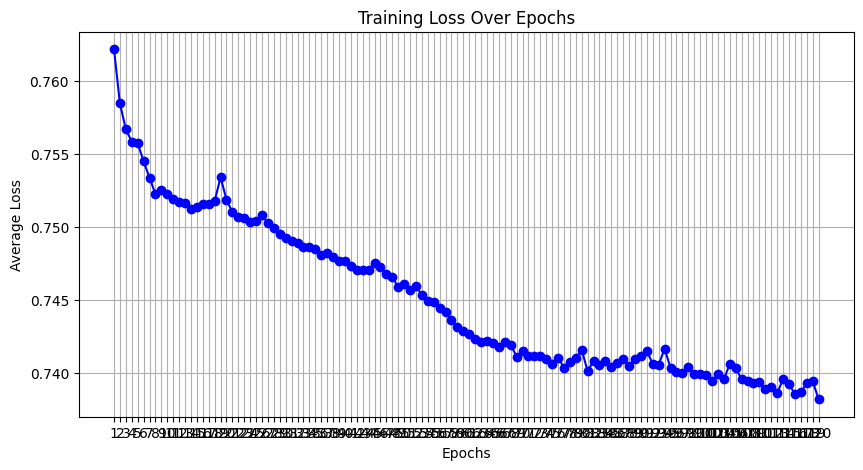

In [4]:
import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 120
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

In [16]:
# 無視
# 評価
model.eval()  # モデルを評価モードに設定
val_loss = 0
correct = 0
total = 0

with torch.no_grad():  # 勾配計算を無効にする
    for inputs, labels in val_dataloader:
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        val_loss += loss.item()

        # 精度の計算
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

# 平均損失と精度の計算
average_loss = val_loss / len(val_dataloader)
accuracy = 100 * correct / total

# 評価結果をリストに追加
val_losses.append(average_loss)
val_accuracies.append(accuracy)

# 評価結果の表示
print(f'Validation Loss: {average_loss:.4f}, Accuracy: {accuracy:.2f}%')

Validation Loss: 0.7473, Accuracy: 72.95%


In [18]:
# 無視
# 評価
model.eval()  # モデルを評価モードに設定
val_loss = 0
correct = 0
total = 0

# 予測結果を格納するリスト
predictions = []

with torch.no_grad():  # 勾配計算を無効にする
    for inputs, labels in val_dataloader:
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        val_loss += loss.item()

        # 精度の計算
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # 予測結果をリストに追加
        predictions.extend(predicted.tolist())  # リストに追加

# 平均損失と精度の計算
average_loss = val_loss / len(val_dataloader)
accuracy = 100 * correct / total

# 評価結果の表示
print(f'Validation Loss: {average_loss:.4f}, Accuracy: {accuracy:.2f}%')

# 予測結果と正解ラベルの比較
for i in range(len(predictions)):
    print(f'Prediction: {predictions[i]}, True Label: {y_val[i]}')

Validation Loss: 0.7473, Accuracy: 72.95%
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 1.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 1.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2.0
Prediction: 0, True Label: 1.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 0.0
Prediction: 0, True Label: 2

In [8]:
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

(178206, 5, 5) (178206,)


In [9]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        lstm_out, (hn, cn) = self.lstm(x)
        out = self.fc(hn[-1])
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 100
output_size = 3  # アクセントのクラス数（0, 1, 2）

model = LSTMModel(input_size, hidden_size, output_size)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/100: 100%|██████████| 4456/4456 [00:19<00:00, 234.21batch/s, loss=0.993]


Epoch [1/100], Average Loss: 0.7605


Epoch 2/100: 100%|██████████| 4456/4456 [00:18<00:00, 235.73batch/s, loss=0.739]


Epoch [2/100], Average Loss: 0.7564


Epoch 3/100: 100%|██████████| 4456/4456 [00:16<00:00, 267.54batch/s, loss=0.736]


Epoch [3/100], Average Loss: 0.7555


Epoch 4/100: 100%|██████████| 4456/4456 [00:15<00:00, 278.59batch/s, loss=1.11] 


Epoch [4/100], Average Loss: 0.7567


Epoch 5/100: 100%|██████████| 4456/4456 [00:16<00:00, 269.27batch/s, loss=0.729]


Epoch [5/100], Average Loss: 0.7543


Epoch 6/100: 100%|██████████| 4456/4456 [00:19<00:00, 229.68batch/s, loss=0.712]


Epoch [6/100], Average Loss: 0.7532


Epoch 7/100: 100%|██████████| 4456/4456 [00:19<00:00, 234.10batch/s, loss=1.03] 


Epoch [7/100], Average Loss: 0.7537


Epoch 8/100: 100%|██████████| 4456/4456 [00:16<00:00, 263.17batch/s, loss=0.67] 


Epoch [8/100], Average Loss: 0.7527


Epoch 9/100: 100%|██████████| 4456/4456 [00:22<00:00, 194.41batch/s, loss=0.712]


Epoch [9/100], Average Loss: 0.7524


Epoch 10/100: 100%|██████████| 4456/4456 [00:22<00:00, 202.05batch/s, loss=0.745]


Epoch [10/100], Average Loss: 0.7521


Epoch 11/100: 100%|██████████| 4456/4456 [00:21<00:00, 206.83batch/s, loss=0.597]


Epoch [11/100], Average Loss: 0.7520


Epoch 12/100: 100%|██████████| 4456/4456 [00:17<00:00, 249.71batch/s, loss=0.67] 


Epoch [12/100], Average Loss: 0.7514


Epoch 13/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.84batch/s, loss=0.662]


Epoch [13/100], Average Loss: 0.7516


Epoch 14/100: 100%|██████████| 4456/4456 [00:17<00:00, 258.88batch/s, loss=0.355]


Epoch [14/100], Average Loss: 0.7515


Epoch 15/100: 100%|██████████| 4456/4456 [00:17<00:00, 255.40batch/s, loss=0.731]


Epoch [15/100], Average Loss: 0.7514


Epoch 16/100: 100%|██████████| 4456/4456 [00:17<00:00, 256.48batch/s, loss=1.16] 


Epoch [16/100], Average Loss: 0.7511


Epoch 17/100: 100%|██████████| 4456/4456 [00:17<00:00, 256.76batch/s, loss=1.15] 


Epoch [17/100], Average Loss: 0.7508


Epoch 18/100: 100%|██████████| 4456/4456 [00:17<00:00, 256.63batch/s, loss=0.754]


Epoch [18/100], Average Loss: 0.7509


Epoch 19/100: 100%|██████████| 4456/4456 [00:17<00:00, 253.66batch/s, loss=1.05] 


Epoch [19/100], Average Loss: 0.7506


Epoch 20/100: 100%|██████████| 4456/4456 [00:17<00:00, 250.60batch/s, loss=0.285]


Epoch [20/100], Average Loss: 0.7506


Epoch 21/100: 100%|██████████| 4456/4456 [00:17<00:00, 251.16batch/s, loss=1.26] 


Epoch [21/100], Average Loss: 0.7509


Epoch 22/100: 100%|██████████| 4456/4456 [00:18<00:00, 247.26batch/s, loss=1.37] 


Epoch [22/100], Average Loss: 0.7505


Epoch 23/100: 100%|██████████| 4456/4456 [00:21<00:00, 212.18batch/s, loss=0.806]


Epoch [23/100], Average Loss: 0.7501


Epoch 24/100: 100%|██████████| 4456/4456 [00:21<00:00, 207.04batch/s, loss=0.441]


Epoch [24/100], Average Loss: 0.7505


Epoch 25/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.17batch/s, loss=0.781]


Epoch [25/100], Average Loss: 0.7490


Epoch 26/100: 100%|██████████| 4456/4456 [00:17<00:00, 254.67batch/s, loss=0.472]


Epoch [26/100], Average Loss: 0.7492


Epoch 27/100: 100%|██████████| 4456/4456 [00:17<00:00, 256.02batch/s, loss=0.305]


Epoch [27/100], Average Loss: 0.7489


Epoch 28/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.39batch/s, loss=1.52] 


Epoch [28/100], Average Loss: 0.7500


Epoch 29/100: 100%|██████████| 4456/4456 [00:17<00:00, 255.85batch/s, loss=0.453]


Epoch [29/100], Average Loss: 0.7493


Epoch 30/100: 100%|██████████| 4456/4456 [00:17<00:00, 255.45batch/s, loss=1.65] 


Epoch [30/100], Average Loss: 0.7500


Epoch 31/100: 100%|██████████| 4456/4456 [00:17<00:00, 254.34batch/s, loss=0.372]


Epoch [31/100], Average Loss: 0.7489


Epoch 32/100: 100%|██████████| 4456/4456 [00:17<00:00, 259.54batch/s, loss=1.05] 


Epoch [32/100], Average Loss: 0.7484


Epoch 33/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.59batch/s, loss=0.733]


Epoch [33/100], Average Loss: 0.7487


Epoch 34/100: 100%|██████████| 4456/4456 [00:17<00:00, 260.56batch/s, loss=0.287]


Epoch [34/100], Average Loss: 0.7481


Epoch 35/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.08batch/s, loss=0.728]


Epoch [35/100], Average Loss: 0.7478


Epoch 36/100: 100%|██████████| 4456/4456 [00:17<00:00, 257.64batch/s, loss=0.682]


Epoch [36/100], Average Loss: 0.7478


Epoch 37/100: 100%|██████████| 4456/4456 [00:16<00:00, 263.53batch/s, loss=0.729]


Epoch [37/100], Average Loss: 0.7476


Epoch 38/100: 100%|██████████| 4456/4456 [00:16<00:00, 264.84batch/s, loss=0.357]


Epoch [38/100], Average Loss: 0.7487


Epoch 39/100: 100%|██████████| 4456/4456 [00:16<00:00, 262.29batch/s, loss=0.717]


Epoch [39/100], Average Loss: 0.7474


Epoch 40/100: 100%|██████████| 4456/4456 [00:17<00:00, 259.57batch/s, loss=1.18] 


Epoch [40/100], Average Loss: 0.7482


Epoch 41/100: 100%|██████████| 4456/4456 [00:17<00:00, 261.53batch/s, loss=0.295]


Epoch [41/100], Average Loss: 0.7476


Epoch 42/100: 100%|██████████| 4456/4456 [00:17<00:00, 260.98batch/s, loss=0.292]


Epoch [42/100], Average Loss: 0.7478


Epoch 43/100: 100%|██████████| 4456/4456 [00:17<00:00, 252.17batch/s, loss=1.59] 


Epoch [43/100], Average Loss: 0.7482


Epoch 44/100: 100%|██████████| 4456/4456 [00:17<00:00, 253.55batch/s, loss=0.734]


Epoch [44/100], Average Loss: 0.7481


Epoch 45/100: 100%|██████████| 4456/4456 [00:16<00:00, 266.26batch/s, loss=0.681]


Epoch [45/100], Average Loss: 0.7489


Epoch 46/100: 100%|██████████| 4456/4456 [00:16<00:00, 264.77batch/s, loss=1.62] 


Epoch [46/100], Average Loss: 0.7482


Epoch 47/100: 100%|██████████| 4456/4456 [00:16<00:00, 263.51batch/s, loss=1.26] 


Epoch [47/100], Average Loss: 0.7480


Epoch 48/100: 100%|██████████| 4456/4456 [00:17<00:00, 258.06batch/s, loss=0.817]


Epoch [48/100], Average Loss: 0.7474


Epoch 49/100: 100%|██████████| 4456/4456 [00:17<00:00, 259.71batch/s, loss=0.235]


Epoch [49/100], Average Loss: 0.7472


Epoch 50/100: 100%|██████████| 4456/4456 [00:17<00:00, 258.27batch/s, loss=0.286]


Epoch [50/100], Average Loss: 0.7476


Epoch 51/100: 100%|██████████| 4456/4456 [00:17<00:00, 248.24batch/s, loss=1.43] 


Epoch [51/100], Average Loss: 0.7478


Epoch 52/100: 100%|██████████| 4456/4456 [00:19<00:00, 226.94batch/s, loss=0.756]


Epoch [52/100], Average Loss: 0.7472


Epoch 53/100: 100%|██████████| 4456/4456 [00:18<00:00, 241.32batch/s, loss=0.699]


Epoch [53/100], Average Loss: 0.7481


Epoch 54/100: 100%|██████████| 4456/4456 [00:16<00:00, 263.02batch/s, loss=0.68] 


Epoch [54/100], Average Loss: 0.7474


Epoch 55/100: 100%|██████████| 4456/4456 [00:16<00:00, 271.11batch/s, loss=0.713]


Epoch [55/100], Average Loss: 0.7482


Epoch 56/100: 100%|██████████| 4456/4456 [00:16<00:00, 269.47batch/s, loss=1.13] 


Epoch [56/100], Average Loss: 0.7478


Epoch 57/100: 100%|██████████| 4456/4456 [00:16<00:00, 268.91batch/s, loss=1.14] 


Epoch [57/100], Average Loss: 0.7480


Epoch 58/100: 100%|██████████| 4456/4456 [00:16<00:00, 266.80batch/s, loss=0.702]


Epoch [58/100], Average Loss: 0.7472


Epoch 59/100: 100%|██████████| 4456/4456 [00:16<00:00, 269.93batch/s, loss=0.791]


Epoch [59/100], Average Loss: 0.7475


Epoch 60/100: 100%|██████████| 4456/4456 [00:16<00:00, 266.21batch/s, loss=0.728]


Epoch [60/100], Average Loss: 0.7480


Epoch 61/100: 100%|██████████| 4456/4456 [00:16<00:00, 272.74batch/s, loss=0.216]


Epoch [61/100], Average Loss: 0.7474


Epoch 62/100: 100%|██████████| 4456/4456 [00:16<00:00, 269.02batch/s, loss=0.337]


Epoch [62/100], Average Loss: 0.7476


Epoch 63/100: 100%|██████████| 4456/4456 [00:17<00:00, 259.25batch/s, loss=0.297]


Epoch [63/100], Average Loss: 0.7480


Epoch 64/100: 100%|██████████| 4456/4456 [00:15<00:00, 281.64batch/s, loss=0.269]


Epoch [64/100], Average Loss: 0.7471


Epoch 65/100: 100%|██████████| 4456/4456 [00:16<00:00, 263.40batch/s, loss=0.653]


Epoch [65/100], Average Loss: 0.7477


Epoch 66/100: 100%|██████████| 4456/4456 [00:18<00:00, 237.44batch/s, loss=1.25] 


Epoch [66/100], Average Loss: 0.7474


Epoch 67/100: 100%|██████████| 4456/4456 [00:18<00:00, 242.91batch/s, loss=1.32] 


Epoch [67/100], Average Loss: 0.7478


Epoch 68/100: 100%|██████████| 4456/4456 [00:17<00:00, 252.32batch/s, loss=1.11] 


Epoch [68/100], Average Loss: 0.7483


Epoch 69/100: 100%|██████████| 4456/4456 [00:16<00:00, 266.99batch/s, loss=1.57] 


Epoch [69/100], Average Loss: 0.7487


Epoch 70/100: 100%|██████████| 4456/4456 [00:21<00:00, 207.78batch/s, loss=1.33] 


Epoch [70/100], Average Loss: 0.7480


Epoch 71/100: 100%|██████████| 4456/4456 [00:20<00:00, 222.31batch/s, loss=0.278]


Epoch [71/100], Average Loss: 0.7475


Epoch 72/100: 100%|██████████| 4456/4456 [00:17<00:00, 256.22batch/s, loss=0.272]


Epoch [72/100], Average Loss: 0.7473


Epoch 73/100: 100%|██████████| 4456/4456 [00:15<00:00, 283.66batch/s, loss=0.779]


Epoch [73/100], Average Loss: 0.7476


Epoch 74/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.90batch/s, loss=0.686]


Epoch [74/100], Average Loss: 0.7484


Epoch 75/100: 100%|██████████| 4456/4456 [00:15<00:00, 280.96batch/s, loss=0.697]


Epoch [75/100], Average Loss: 0.7470


Epoch 76/100: 100%|██████████| 4456/4456 [00:15<00:00, 278.74batch/s, loss=0.681]


Epoch [76/100], Average Loss: 0.7475


Epoch 77/100: 100%|██████████| 4456/4456 [00:15<00:00, 288.33batch/s, loss=0.318]


Epoch [77/100], Average Loss: 0.7485


Epoch 78/100: 100%|██████████| 4456/4456 [00:15<00:00, 279.55batch/s, loss=0.718]


Epoch [78/100], Average Loss: 0.7483


Epoch 79/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.05batch/s, loss=0.265]


Epoch [79/100], Average Loss: 0.7480


Epoch 80/100: 100%|██████████| 4456/4456 [00:15<00:00, 287.08batch/s, loss=0.681]


Epoch [80/100], Average Loss: 0.7485


Epoch 81/100: 100%|██████████| 4456/4456 [00:15<00:00, 280.54batch/s, loss=0.657]


Epoch [81/100], Average Loss: 0.7506


Epoch 82/100: 100%|██████████| 4456/4456 [00:15<00:00, 285.18batch/s, loss=0.585]


Epoch [82/100], Average Loss: 0.7498


Epoch 83/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.08batch/s, loss=0.767]


Epoch [83/100], Average Loss: 0.7481


Epoch 84/100: 100%|██████████| 4456/4456 [00:15<00:00, 289.02batch/s, loss=0.723]


Epoch [84/100], Average Loss: 0.7474


Epoch 85/100: 100%|██████████| 4456/4456 [00:15<00:00, 290.27batch/s, loss=0.302]


Epoch [85/100], Average Loss: 0.7479


Epoch 86/100: 100%|██████████| 4456/4456 [00:15<00:00, 291.07batch/s, loss=0.726]


Epoch [86/100], Average Loss: 0.7475


Epoch 87/100: 100%|██████████| 4456/4456 [00:15<00:00, 285.09batch/s, loss=0.946]


Epoch [87/100], Average Loss: 0.7482


Epoch 88/100: 100%|██████████| 4456/4456 [00:16<00:00, 275.41batch/s, loss=0.268]


Epoch [88/100], Average Loss: 0.7473


Epoch 89/100: 100%|██████████| 4456/4456 [00:15<00:00, 279.43batch/s, loss=0.301]


Epoch [89/100], Average Loss: 0.7480


Epoch 90/100: 100%|██████████| 4456/4456 [00:15<00:00, 288.19batch/s, loss=0.52] 


Epoch [90/100], Average Loss: 0.7485


Epoch 91/100: 100%|██████████| 4456/4456 [00:15<00:00, 280.12batch/s, loss=0.313]


Epoch [91/100], Average Loss: 0.7484


Epoch 92/100: 100%|██████████| 4456/4456 [00:15<00:00, 282.41batch/s, loss=1.13] 


Epoch [92/100], Average Loss: 0.7487


Epoch 93/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.06batch/s, loss=1.34] 


Epoch [93/100], Average Loss: 0.7482


Epoch 94/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.10batch/s, loss=0.301]


Epoch [94/100], Average Loss: 0.7478


Epoch 95/100: 100%|██████████| 4456/4456 [00:15<00:00, 288.71batch/s, loss=1.38] 


Epoch [95/100], Average Loss: 0.7485


Epoch 96/100: 100%|██████████| 4456/4456 [00:15<00:00, 294.92batch/s, loss=0.387]


Epoch [96/100], Average Loss: 0.7475


Epoch 97/100: 100%|██████████| 4456/4456 [00:15<00:00, 296.63batch/s, loss=1.03] 


Epoch [97/100], Average Loss: 0.7500


Epoch 98/100: 100%|██████████| 4456/4456 [00:15<00:00, 292.38batch/s, loss=0.953]


Epoch [98/100], Average Loss: 0.7532


Epoch 99/100: 100%|██████████| 4456/4456 [00:15<00:00, 284.84batch/s, loss=0.586]


Epoch [99/100], Average Loss: 0.7501


Epoch 100/100: 100%|██████████| 4456/4456 [00:15<00:00, 288.41batch/s, loss=0.769]


Epoch [100/100], Average Loss: 0.7493


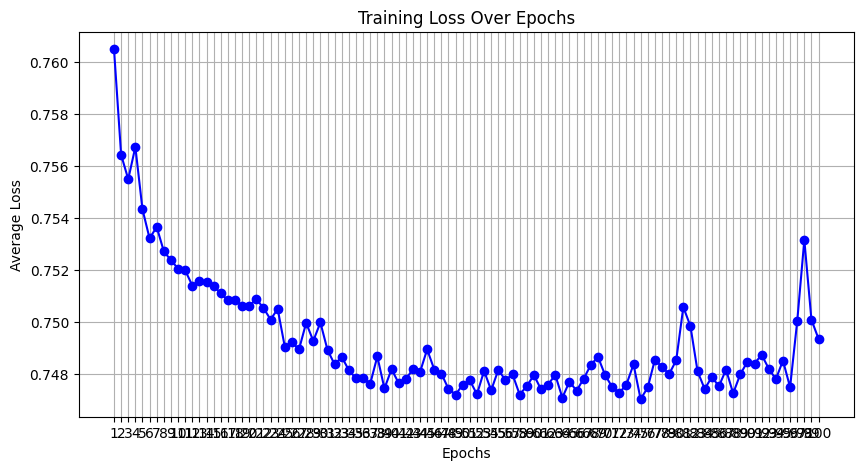

In [10]:
import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 100
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

(178206, 5, 5) (178206,)
(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.12batch/s, loss=1.21] 


Epoch [1/100], Average Loss: 0.7583


Epoch 2/100: 100%|██████████| 4456/4456 [00:23<00:00, 188.73batch/s, loss=0.743]


Epoch [2/100], Average Loss: 0.7556


Epoch 3/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.49batch/s, loss=0.322]


Epoch [3/100], Average Loss: 0.7552


Epoch 4/100: 100%|██████████| 4456/4456 [00:23<00:00, 190.74batch/s, loss=0.253]


Epoch [4/100], Average Loss: 0.7549


Epoch 5/100: 100%|██████████| 4456/4456 [00:23<00:00, 187.65batch/s, loss=0.831]


Epoch [5/100], Average Loss: 0.7547


Epoch 6/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.68batch/s, loss=0.266]


Epoch [6/100], Average Loss: 0.7545


Epoch 7/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.88batch/s, loss=0.809]


Epoch [7/100], Average Loss: 0.7546


Epoch 8/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.17batch/s, loss=1.04] 


Epoch [8/100], Average Loss: 0.7547


Epoch 9/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.66batch/s, loss=0.388]


Epoch [9/100], Average Loss: 0.7544


Epoch 10/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.45batch/s, loss=0.933]


Epoch [10/100], Average Loss: 0.7545


Epoch 11/100: 100%|██████████| 4456/4456 [00:25<00:00, 177.95batch/s, loss=0.74] 


Epoch [11/100], Average Loss: 0.7543


Epoch 12/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.25batch/s, loss=1.19] 


Epoch [12/100], Average Loss: 0.7545


Epoch 13/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.97batch/s, loss=0.783]


Epoch [13/100], Average Loss: 0.7544


Epoch 14/100: 100%|██████████| 4456/4456 [00:23<00:00, 189.54batch/s, loss=0.655]


Epoch [14/100], Average Loss: 0.7543


Epoch 15/100: 100%|██████████| 4456/4456 [00:24<00:00, 185.33batch/s, loss=1.08] 


Epoch [15/100], Average Loss: 0.7543


Epoch 16/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.51batch/s, loss=0.325]


Epoch [16/100], Average Loss: 0.7543


Epoch 17/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.87batch/s, loss=0.69] 


Epoch [17/100], Average Loss: 0.7542


Epoch 18/100: 100%|██████████| 4456/4456 [00:23<00:00, 185.80batch/s, loss=0.698]


Epoch [18/100], Average Loss: 0.7543


Epoch 19/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.28batch/s, loss=0.296]


Epoch [19/100], Average Loss: 0.7542


Epoch 20/100: 100%|██████████| 4456/4456 [00:24<00:00, 185.20batch/s, loss=0.754]


Epoch [20/100], Average Loss: 0.7543


Epoch 21/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.99batch/s, loss=0.695]


Epoch [21/100], Average Loss: 0.7542


Epoch 22/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.48batch/s, loss=0.321]


Epoch [22/100], Average Loss: 0.7542


Epoch 23/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.32batch/s, loss=0.721]


Epoch [23/100], Average Loss: 0.7543


Epoch 24/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.16batch/s, loss=0.961]


Epoch [24/100], Average Loss: 0.7542


Epoch 25/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.98batch/s, loss=1.17] 


Epoch [25/100], Average Loss: 0.7544


Epoch 26/100: 100%|██████████| 4456/4456 [00:23<00:00, 187.62batch/s, loss=0.724]


Epoch [26/100], Average Loss: 0.7543


Epoch 27/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.27batch/s, loss=0.318]


Epoch [27/100], Average Loss: 0.7542


Epoch 28/100: 100%|██████████| 4456/4456 [00:24<00:00, 185.15batch/s, loss=0.735]


Epoch [28/100], Average Loss: 0.7543


Epoch 29/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.90batch/s, loss=0.691]


Epoch [29/100], Average Loss: 0.7542


Epoch 30/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.73batch/s, loss=1.14] 


Epoch [30/100], Average Loss: 0.7543


Epoch 31/100: 100%|██████████| 4456/4456 [00:25<00:00, 178.00batch/s, loss=0.38] 


Epoch [31/100], Average Loss: 0.7543


Epoch 32/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.28batch/s, loss=0.78] 


Epoch [32/100], Average Loss: 0.7543


Epoch 33/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.35batch/s, loss=0.869]


Epoch [33/100], Average Loss: 0.7543


Epoch 34/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.65batch/s, loss=0.816]


Epoch [34/100], Average Loss: 0.7544


Epoch 35/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.42batch/s, loss=0.286]


Epoch [35/100], Average Loss: 0.7542


Epoch 36/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.80batch/s, loss=1.1]  


Epoch [36/100], Average Loss: 0.7543


Epoch 37/100: 100%|██████████| 4456/4456 [00:23<00:00, 187.64batch/s, loss=0.765]


Epoch [37/100], Average Loss: 0.7543


Epoch 38/100: 100%|██████████| 4456/4456 [00:24<00:00, 179.66batch/s, loss=1.1]  


Epoch [38/100], Average Loss: 0.7544


Epoch 39/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.68batch/s, loss=1.25] 


Epoch [39/100], Average Loss: 0.7544


Epoch 40/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.74batch/s, loss=0.666]


Epoch [40/100], Average Loss: 0.7543


Epoch 41/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.48batch/s, loss=0.739]


Epoch [41/100], Average Loss: 0.7543


Epoch 42/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.72batch/s, loss=0.333]


Epoch [42/100], Average Loss: 0.7542


Epoch 43/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.03batch/s, loss=0.272]


Epoch [43/100], Average Loss: 0.7542


Epoch 44/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.24batch/s, loss=0.749]


Epoch [44/100], Average Loss: 0.7542


Epoch 45/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.18batch/s, loss=0.788]


Epoch [45/100], Average Loss: 0.7542


Epoch 46/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.09batch/s, loss=1.13] 


Epoch [46/100], Average Loss: 0.7545


Epoch 47/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.40batch/s, loss=0.342]


Epoch [47/100], Average Loss: 0.7541


Epoch 48/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.91batch/s, loss=0.594]


Epoch [48/100], Average Loss: 0.7543


Epoch 49/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.78batch/s, loss=0.709]


Epoch [49/100], Average Loss: 0.7542


Epoch 50/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.03batch/s, loss=1.15] 


Epoch [50/100], Average Loss: 0.7543


Epoch 51/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.79batch/s, loss=0.642]


Epoch [51/100], Average Loss: 0.7543


Epoch 52/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.56batch/s, loss=0.726]


Epoch [52/100], Average Loss: 0.7542


Epoch 53/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.89batch/s, loss=1.56] 


Epoch [53/100], Average Loss: 0.7545


Epoch 54/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.98batch/s, loss=0.743]


Epoch [54/100], Average Loss: 0.7543


Epoch 55/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.09batch/s, loss=0.721]


Epoch [55/100], Average Loss: 0.7543


Epoch 56/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.36batch/s, loss=1.14] 


Epoch [56/100], Average Loss: 0.7543


Epoch 57/100: 100%|██████████| 4456/4456 [00:24<00:00, 185.61batch/s, loss=0.882]


Epoch [57/100], Average Loss: 0.7544


Epoch 58/100: 100%|██████████| 4456/4456 [00:24<00:00, 180.16batch/s, loss=0.398]


Epoch [58/100], Average Loss: 0.7542


Epoch 59/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.80batch/s, loss=0.272]


Epoch [59/100], Average Loss: 0.7542


Epoch 60/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.15batch/s, loss=1.56] 


Epoch [60/100], Average Loss: 0.7545


Epoch 61/100: 100%|██████████| 4456/4456 [00:23<00:00, 185.84batch/s, loss=0.354]


Epoch [61/100], Average Loss: 0.7542


Epoch 62/100: 100%|██████████| 4456/4456 [00:23<00:00, 189.75batch/s, loss=0.68] 


Epoch [62/100], Average Loss: 0.7542


Epoch 63/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.65batch/s, loss=1.53] 


Epoch [63/100], Average Loss: 0.7543


Epoch 64/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.68batch/s, loss=0.874]


Epoch [64/100], Average Loss: 0.7543


Epoch 65/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.85batch/s, loss=0.265]


Epoch [65/100], Average Loss: 0.7542


Epoch 66/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.70batch/s, loss=0.676]


Epoch [66/100], Average Loss: 0.7542


Epoch 67/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.51batch/s, loss=0.646]


Epoch [67/100], Average Loss: 0.7542


Epoch 68/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.07batch/s, loss=1.22] 


Epoch [68/100], Average Loss: 0.7543


Epoch 69/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.17batch/s, loss=1.08] 


Epoch [69/100], Average Loss: 0.7544


Epoch 70/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.15batch/s, loss=0.734]


Epoch [70/100], Average Loss: 0.7543


Epoch 71/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.47batch/s, loss=1.36] 


Epoch [71/100], Average Loss: 0.7544


Epoch 72/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.96batch/s, loss=1.11] 


Epoch [72/100], Average Loss: 0.7543


Epoch 73/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.83batch/s, loss=1.56] 


Epoch [73/100], Average Loss: 0.7544


Epoch 74/100: 100%|██████████| 4456/4456 [00:23<00:00, 187.86batch/s, loss=1.11] 


Epoch [74/100], Average Loss: 0.7543


Epoch 75/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.12batch/s, loss=0.636]


Epoch [75/100], Average Loss: 0.7541


Epoch 76/100: 100%|██████████| 4456/4456 [00:24<00:00, 185.45batch/s, loss=0.675]


Epoch [76/100], Average Loss: 0.7542


Epoch 77/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.67batch/s, loss=0.866]


Epoch [77/100], Average Loss: 0.7544


Epoch 78/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.13batch/s, loss=0.801]


Epoch [78/100], Average Loss: 0.7543


Epoch 79/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.93batch/s, loss=1.12] 


Epoch [79/100], Average Loss: 0.7543


Epoch 80/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.17batch/s, loss=0.278]


Epoch [80/100], Average Loss: 0.7542


Epoch 81/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.71batch/s, loss=1.1]  


Epoch [81/100], Average Loss: 0.7543


Epoch 82/100: 100%|██████████| 4456/4456 [00:23<00:00, 187.25batch/s, loss=0.693]


Epoch [82/100], Average Loss: 0.7542


Epoch 83/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.70batch/s, loss=1.12] 


Epoch [83/100], Average Loss: 0.7544


Epoch 84/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.90batch/s, loss=1.04] 


Epoch [84/100], Average Loss: 0.7544


Epoch 85/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.67batch/s, loss=0.292]


Epoch [85/100], Average Loss: 0.7542


Epoch 86/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.85batch/s, loss=1.35] 


Epoch [86/100], Average Loss: 0.7544


Epoch 87/100: 100%|██████████| 4456/4456 [00:23<00:00, 186.10batch/s, loss=0.685]


Epoch [87/100], Average Loss: 0.7542


Epoch 88/100: 100%|██████████| 4456/4456 [00:24<00:00, 180.13batch/s, loss=1.58] 


Epoch [88/100], Average Loss: 0.7545


Epoch 89/100: 100%|██████████| 4456/4456 [00:25<00:00, 176.61batch/s, loss=1.16] 


Epoch [89/100], Average Loss: 0.7543


Epoch 90/100: 100%|██████████| 4456/4456 [00:24<00:00, 178.83batch/s, loss=0.945]


Epoch [90/100], Average Loss: 0.7543


Epoch 91/100: 100%|██████████| 4456/4456 [00:25<00:00, 173.64batch/s, loss=0.291]


Epoch [91/100], Average Loss: 0.7542


Epoch 92/100: 100%|██████████| 4456/4456 [00:24<00:00, 178.36batch/s, loss=0.35] 


Epoch [92/100], Average Loss: 0.7541


Epoch 93/100: 100%|██████████| 4456/4456 [00:25<00:00, 176.68batch/s, loss=0.341]


Epoch [93/100], Average Loss: 0.7542


Epoch 94/100: 100%|██████████| 4456/4456 [00:24<00:00, 184.51batch/s, loss=1.15] 


Epoch [94/100], Average Loss: 0.7543


Epoch 95/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.27batch/s, loss=0.319]


Epoch [95/100], Average Loss: 0.7541


Epoch 96/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.03batch/s, loss=1.13] 


Epoch [96/100], Average Loss: 0.7543


Epoch 97/100: 100%|██████████| 4456/4456 [00:24<00:00, 182.50batch/s, loss=1.07] 


Epoch [97/100], Average Loss: 0.7542


Epoch 98/100: 100%|██████████| 4456/4456 [00:24<00:00, 181.69batch/s, loss=0.742]


Epoch [98/100], Average Loss: 0.7543


Epoch 99/100: 100%|██████████| 4456/4456 [00:24<00:00, 183.01batch/s, loss=1.46] 


Epoch [99/100], Average Loss: 0.7545


Epoch 100/100: 100%|██████████| 4456/4456 [00:24<00:00, 180.14batch/s, loss=0.336]


Epoch [100/100], Average Loss: 0.7542


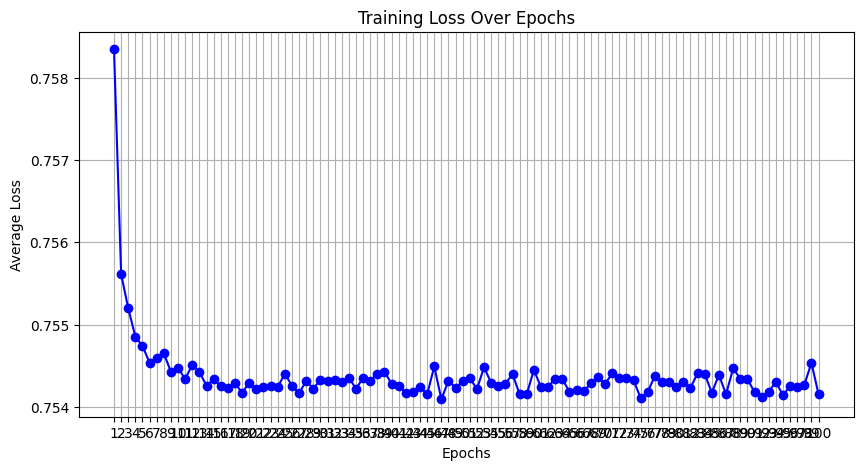

In [1]:
# 双方向LSTM+２つのドロップアウト層
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# BiLSTMモデルの定義
class BiLSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2, dropout_prob=0.5):
        super(BiLSTMModel, self).__init__()
        # 2つの双方向LSTM層を設定
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers, 
                            dropout=dropout_prob, bidirectional=True, batch_first=True)
        # ドロップアウト層を設定
        self.dropout = nn.Dropout(dropout_prob)
        # 双方向LSTMなのでhidden_size * 2を次元に持つ全結合層
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        # LSTM層を通過
        lstm_out, (hn, cn) = self.lstm(x)
        # ドロップアウトを適用
        lstm_out = self.dropout(lstm_out)
        # 双方向なので、順方向と逆方向の出力を結合 (hidden statesの最後を使用)
        hn_concat = torch.cat((hn[-2], hn[-1]), dim=1)  # 双方向の最終層の出力を結合
        # 全結合層に通して出力
        out = self.fc(hn_concat)
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）
num_layers = 2
dropout_prob = 0.5

model = BiLSTMModel(input_size, hidden_size, output_size, num_layers=num_layers, dropout_prob=dropout_prob)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 100
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

(178206, 5, 5) (178206,)
(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/120: 100%|██████████| 4456/4456 [00:23<00:00, 188.65batch/s, loss=0.655]


Epoch [1/120], Average Loss: 0.7582


Epoch 2/120: 100%|██████████| 4456/4456 [00:23<00:00, 189.47batch/s, loss=0.287]


Epoch [2/120], Average Loss: 0.7554


Epoch 3/120: 100%|██████████| 4456/4456 [00:23<00:00, 186.74batch/s, loss=0.661]


Epoch [3/120], Average Loss: 0.7551


Epoch 4/120: 100%|██████████| 4456/4456 [00:23<00:00, 186.05batch/s, loss=0.231]


Epoch [4/120], Average Loss: 0.7545


Epoch 5/120: 100%|██████████| 4456/4456 [00:23<00:00, 188.59batch/s, loss=1.11] 


Epoch [5/120], Average Loss: 0.7544


Epoch 6/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.08batch/s, loss=0.3]  


Epoch [6/120], Average Loss: 0.7540


Epoch 7/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.83batch/s, loss=1.14] 


Epoch [7/120], Average Loss: 0.7538


Epoch 8/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.22batch/s, loss=1.14] 


Epoch [8/120], Average Loss: 0.7538


Epoch 9/120: 100%|██████████| 4456/4456 [00:24<00:00, 184.79batch/s, loss=0.603]


Epoch [9/120], Average Loss: 0.7534


Epoch 10/120: 100%|██████████| 4456/4456 [00:24<00:00, 185.19batch/s, loss=0.28] 


Epoch [10/120], Average Loss: 0.7531


Epoch 11/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.52batch/s, loss=1.18] 


Epoch [11/120], Average Loss: 0.7532


Epoch 12/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.12batch/s, loss=0.726]


Epoch [12/120], Average Loss: 0.7532


Epoch 13/120: 100%|██████████| 4456/4456 [00:24<00:00, 184.09batch/s, loss=1.12] 


Epoch [13/120], Average Loss: 0.7533


Epoch 14/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.80batch/s, loss=1.17] 


Epoch [14/120], Average Loss: 0.7530


Epoch 15/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.15batch/s, loss=0.336]


Epoch [15/120], Average Loss: 0.7530


Epoch 16/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.61batch/s, loss=1.16] 


Epoch [16/120], Average Loss: 0.7533


Epoch 17/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.68batch/s, loss=0.321]


Epoch [17/120], Average Loss: 0.7528


Epoch 18/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.75batch/s, loss=0.308]


Epoch [18/120], Average Loss: 0.7529


Epoch 19/120: 100%|██████████| 4456/4456 [00:24<00:00, 185.24batch/s, loss=1.06] 


Epoch [19/120], Average Loss: 0.7529


Epoch 20/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.43batch/s, loss=0.767]


Epoch [20/120], Average Loss: 0.7528


Epoch 21/120: 100%|██████████| 4456/4456 [00:24<00:00, 184.24batch/s, loss=0.874]


Epoch [21/120], Average Loss: 0.7527


Epoch 22/120: 100%|██████████| 4456/4456 [00:24<00:00, 184.70batch/s, loss=1.13] 


Epoch [22/120], Average Loss: 0.7529


Epoch 23/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.47batch/s, loss=0.325]


Epoch [23/120], Average Loss: 0.7525


Epoch 24/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.60batch/s, loss=0.684]


Epoch [24/120], Average Loss: 0.7527


Epoch 25/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.63batch/s, loss=0.289]


Epoch [25/120], Average Loss: 0.7526


Epoch 26/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.79batch/s, loss=0.661]


Epoch [26/120], Average Loss: 0.7526


Epoch 27/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.78batch/s, loss=0.742]


Epoch [27/120], Average Loss: 0.7528


Epoch 28/120: 100%|██████████| 4456/4456 [00:25<00:00, 176.22batch/s, loss=0.27] 


Epoch [28/120], Average Loss: 0.7528


Epoch 29/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.46batch/s, loss=1.12] 


Epoch [29/120], Average Loss: 0.7528


Epoch 30/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.93batch/s, loss=1.61] 


Epoch [30/120], Average Loss: 0.7528


Epoch 31/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.50batch/s, loss=0.734]


Epoch [31/120], Average Loss: 0.7530


Epoch 32/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.34batch/s, loss=1.39] 


Epoch [32/120], Average Loss: 0.7531


Epoch 33/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.38batch/s, loss=0.722]


Epoch [33/120], Average Loss: 0.7527


Epoch 34/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.45batch/s, loss=0.331]


Epoch [34/120], Average Loss: 0.7525


Epoch 35/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.18batch/s, loss=0.263]


Epoch [35/120], Average Loss: 0.7524


Epoch 36/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.26batch/s, loss=0.332]


Epoch [36/120], Average Loss: 0.7525


Epoch 37/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.74batch/s, loss=0.263]


Epoch [37/120], Average Loss: 0.7524


Epoch 38/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.24batch/s, loss=0.7]  


Epoch [38/120], Average Loss: 0.7526


Epoch 39/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.51batch/s, loss=0.258]


Epoch [39/120], Average Loss: 0.7528


Epoch 40/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.22batch/s, loss=0.787]


Epoch [40/120], Average Loss: 0.7527


Epoch 41/120: 100%|██████████| 4456/4456 [00:25<00:00, 175.97batch/s, loss=0.336]


Epoch [41/120], Average Loss: 0.7526


Epoch 42/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.66batch/s, loss=0.343]


Epoch [42/120], Average Loss: 0.7522


Epoch 43/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.72batch/s, loss=1.55] 


Epoch [43/120], Average Loss: 0.7527


Epoch 44/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.43batch/s, loss=1.14] 


Epoch [44/120], Average Loss: 0.7529


Epoch 45/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.10batch/s, loss=0.202]


Epoch [45/120], Average Loss: 0.7524


Epoch 46/120: 100%|██████████| 4456/4456 [00:25<00:00, 178.16batch/s, loss=0.274]


Epoch [46/120], Average Loss: 0.7525


Epoch 47/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.95batch/s, loss=0.732]


Epoch [47/120], Average Loss: 0.7528


Epoch 48/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.21batch/s, loss=1.15] 


Epoch [48/120], Average Loss: 0.7525


Epoch 49/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.78batch/s, loss=0.738]


Epoch [49/120], Average Loss: 0.7528


Epoch 50/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.42batch/s, loss=0.216]


Epoch [50/120], Average Loss: 0.7523


Epoch 51/120: 100%|██████████| 4456/4456 [00:25<00:00, 176.09batch/s, loss=0.687]


Epoch [51/120], Average Loss: 0.7525


Epoch 52/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.71batch/s, loss=0.705]


Epoch [52/120], Average Loss: 0.7523


Epoch 53/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.82batch/s, loss=0.315]


Epoch [53/120], Average Loss: 0.7525


Epoch 54/120: 100%|██████████| 4456/4456 [00:25<00:00, 174.93batch/s, loss=0.245]


Epoch [54/120], Average Loss: 0.7526


Epoch 55/120: 100%|██████████| 4456/4456 [00:25<00:00, 178.00batch/s, loss=0.772]


Epoch [55/120], Average Loss: 0.7521


Epoch 56/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.11batch/s, loss=1.18] 


Epoch [56/120], Average Loss: 0.7524


Epoch 57/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.30batch/s, loss=0.258]


Epoch [57/120], Average Loss: 0.7523


Epoch 58/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.38batch/s, loss=0.667]


Epoch [58/120], Average Loss: 0.7523


Epoch 59/120: 100%|██████████| 4456/4456 [00:25<00:00, 172.63batch/s, loss=0.789]


Epoch [59/120], Average Loss: 0.7524


Epoch 60/120: 100%|██████████| 4456/4456 [00:26<00:00, 171.26batch/s, loss=0.717]


Epoch [60/120], Average Loss: 0.7529


Epoch 61/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.10batch/s, loss=1.09] 


Epoch [61/120], Average Loss: 0.7524


Epoch 62/120: 100%|██████████| 4456/4456 [00:25<00:00, 172.45batch/s, loss=1.09] 


Epoch [62/120], Average Loss: 0.7521


Epoch 63/120: 100%|██████████| 4456/4456 [00:25<00:00, 176.14batch/s, loss=0.3]  


Epoch [63/120], Average Loss: 0.7521


Epoch 64/120: 100%|██████████| 4456/4456 [00:25<00:00, 176.74batch/s, loss=0.304]


Epoch [64/120], Average Loss: 0.7522


Epoch 65/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.99batch/s, loss=0.747]


Epoch [65/120], Average Loss: 0.7524


Epoch 66/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.19batch/s, loss=0.653]


Epoch [66/120], Average Loss: 0.7526


Epoch 67/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.52batch/s, loss=1.21] 


Epoch [67/120], Average Loss: 0.7526


Epoch 68/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.23batch/s, loss=0.761]


Epoch [68/120], Average Loss: 0.7521


Epoch 69/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.39batch/s, loss=1.43] 


Epoch [69/120], Average Loss: 0.7521


Epoch 70/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.26batch/s, loss=0.692]


Epoch [70/120], Average Loss: 0.7515


Epoch 71/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.74batch/s, loss=0.651]


Epoch [71/120], Average Loss: 0.7519


Epoch 72/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.96batch/s, loss=0.629]


Epoch [72/120], Average Loss: 0.7518


Epoch 73/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.96batch/s, loss=1.1]  


Epoch [73/120], Average Loss: 0.7515


Epoch 74/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.80batch/s, loss=0.292]


Epoch [74/120], Average Loss: 0.7507


Epoch 75/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.76batch/s, loss=0.859]


Epoch [75/120], Average Loss: 0.7508


Epoch 76/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.16batch/s, loss=0.72] 


Epoch [76/120], Average Loss: 0.7508


Epoch 77/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.97batch/s, loss=0.686]


Epoch [77/120], Average Loss: 0.7491


Epoch 78/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.24batch/s, loss=0.307]


Epoch [78/120], Average Loss: 0.7487


Epoch 79/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.85batch/s, loss=1.11] 


Epoch [79/120], Average Loss: 0.7480


Epoch 80/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.65batch/s, loss=0.877]


Epoch [80/120], Average Loss: 0.7476


Epoch 81/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.11batch/s, loss=0.332]


Epoch [81/120], Average Loss: 0.7466


Epoch 82/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.57batch/s, loss=0.758]


Epoch [82/120], Average Loss: 0.7459


Epoch 83/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.89batch/s, loss=0.329]


Epoch [83/120], Average Loss: 0.7462


Epoch 84/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.33batch/s, loss=1.11] 


Epoch [84/120], Average Loss: 0.7457


Epoch 85/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.95batch/s, loss=0.911]


Epoch [85/120], Average Loss: 0.7452


Epoch 86/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.66batch/s, loss=0.24] 


Epoch [86/120], Average Loss: 0.7450


Epoch 87/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.73batch/s, loss=0.728]


Epoch [87/120], Average Loss: 0.7453


Epoch 88/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.09batch/s, loss=0.296]


Epoch [88/120], Average Loss: 0.7449


Epoch 89/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.02batch/s, loss=0.714]


Epoch [89/120], Average Loss: 0.7454


Epoch 90/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.83batch/s, loss=0.916]


Epoch [90/120], Average Loss: 0.7456


Epoch 91/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.72batch/s, loss=0.762]


Epoch [91/120], Average Loss: 0.7451


Epoch 92/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.59batch/s, loss=1.11] 


Epoch [92/120], Average Loss: 0.7454


Epoch 93/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.74batch/s, loss=0.698]


Epoch [93/120], Average Loss: 0.7454


Epoch 94/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.04batch/s, loss=1.03] 


Epoch [94/120], Average Loss: 0.7443


Epoch 95/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.33batch/s, loss=0.727]


Epoch [95/120], Average Loss: 0.7450


Epoch 96/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.81batch/s, loss=0.278]


Epoch [96/120], Average Loss: 0.7444


Epoch 97/120: 100%|██████████| 4456/4456 [00:24<00:00, 184.15batch/s, loss=1.15] 


Epoch [97/120], Average Loss: 0.7445


Epoch 98/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.20batch/s, loss=0.392]


Epoch [98/120], Average Loss: 0.7447


Epoch 99/120: 100%|██████████| 4456/4456 [00:25<00:00, 178.08batch/s, loss=0.447]


Epoch [99/120], Average Loss: 0.7446


Epoch 100/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.65batch/s, loss=0.33] 


Epoch [100/120], Average Loss: 0.7445


Epoch 101/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.64batch/s, loss=0.64] 


Epoch [101/120], Average Loss: 0.7442


Epoch 102/120: 100%|██████████| 4456/4456 [00:25<00:00, 178.14batch/s, loss=1.3]  


Epoch [102/120], Average Loss: 0.7444


Epoch 103/120: 100%|██████████| 4456/4456 [00:25<00:00, 178.16batch/s, loss=0.501]


Epoch [103/120], Average Loss: 0.7443


Epoch 104/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.23batch/s, loss=1.28] 


Epoch [104/120], Average Loss: 0.7442


Epoch 105/120: 100%|██████████| 4456/4456 [00:24<00:00, 178.26batch/s, loss=1.13] 


Epoch [105/120], Average Loss: 0.7444


Epoch 106/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.21batch/s, loss=0.751]


Epoch [106/120], Average Loss: 0.7444


Epoch 107/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.83batch/s, loss=0.765]


Epoch [107/120], Average Loss: 0.7442


Epoch 108/120: 100%|██████████| 4456/4456 [00:24<00:00, 183.46batch/s, loss=1.13] 


Epoch [108/120], Average Loss: 0.7438


Epoch 109/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.83batch/s, loss=0.705]


Epoch [109/120], Average Loss: 0.7443


Epoch 110/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.78batch/s, loss=0.338]


Epoch [110/120], Average Loss: 0.7432


Epoch 111/120: 100%|██████████| 4456/4456 [00:24<00:00, 180.07batch/s, loss=0.705]


Epoch [111/120], Average Loss: 0.7443


Epoch 112/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.48batch/s, loss=0.494]


Epoch [112/120], Average Loss: 0.7435


Epoch 113/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.54batch/s, loss=0.31] 


Epoch [113/120], Average Loss: 0.7438


Epoch 114/120: 100%|██████████| 4456/4456 [00:24<00:00, 181.20batch/s, loss=0.331]


Epoch [114/120], Average Loss: 0.7428


Epoch 115/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.14batch/s, loss=0.499]


Epoch [115/120], Average Loss: 0.7433


Epoch 116/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.20batch/s, loss=0.308]


Epoch [116/120], Average Loss: 0.7433


Epoch 117/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.49batch/s, loss=0.289]


Epoch [117/120], Average Loss: 0.7435


Epoch 118/120: 100%|██████████| 4456/4456 [00:24<00:00, 182.22batch/s, loss=0.701]


Epoch [118/120], Average Loss: 0.7424


Epoch 119/120: 100%|██████████| 4456/4456 [00:24<00:00, 179.35batch/s, loss=0.422]


Epoch [119/120], Average Loss: 0.7434


Epoch 120/120: 100%|██████████| 4456/4456 [00:25<00:00, 177.94batch/s, loss=1.69] 


Epoch [120/120], Average Loss: 0.7435


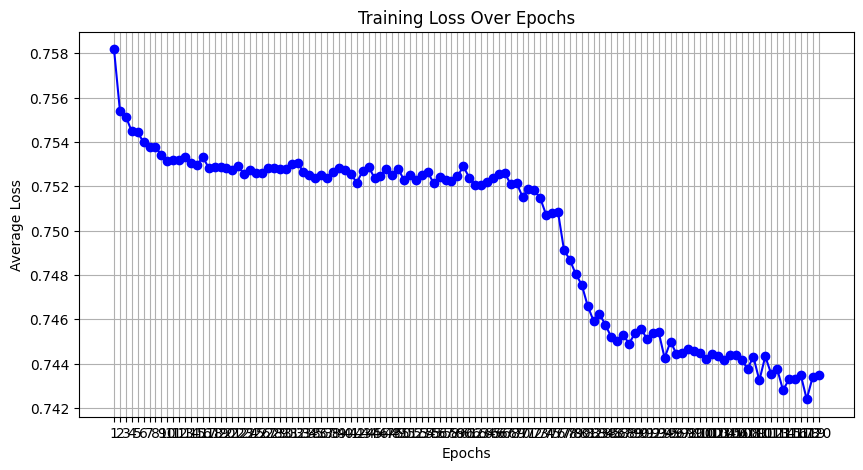

In [2]:
# 双方向LSTM+２つのドロップアウト層
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# BiLSTMモデルの定義
class BiLSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2, dropout_prob=0.5):
        super(BiLSTMModel, self).__init__()
        # 2つの双方向LSTM層を設定
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers, 
                            dropout=dropout_prob, bidirectional=True, batch_first=True)
        # ドロップアウト層を設定
        self.dropout = nn.Dropout(dropout_prob)
        # 双方向LSTMなのでhidden_size * 2を次元に持つ全結合層
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        # LSTM層を通過
        lstm_out, (hn, cn) = self.lstm(x)
        # ドロップアウトを適用
        lstm_out = self.dropout(lstm_out)
        # 双方向なので、順方向と逆方向の出力を結合 (hidden statesの最後を使用)
        hn_concat = torch.cat((hn[-2], hn[-1]), dim=1)  # 双方向の最終層の出力を結合
        # 全結合層に通して出力
        out = self.fc(hn_concat)
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）
num_layers = 2
dropout_prob = 0.5

model = BiLSTMModel(input_size, hidden_size, output_size, num_layers=num_layers, dropout_prob=dropout_prob)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 120
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

(178206, 5, 5) (178206,)
(142564, 5, 5) (142564,)
(35642, 5, 5) (35642,)


Epoch 1/150: 100%|██████████| 4456/4456 [00:23<00:00, 188.23batch/s, loss=0.744]


Epoch [1/150], Average Loss: 0.7584


Epoch 2/150: 100%|██████████| 4456/4456 [00:24<00:00, 185.44batch/s, loss=1.75] 


Epoch [2/150], Average Loss: 0.7553


Epoch 3/150: 100%|██████████| 4456/4456 [00:24<00:00, 183.09batch/s, loss=1.12] 


Epoch [3/150], Average Loss: 0.7546


Epoch 4/150: 100%|██████████| 4456/4456 [00:24<00:00, 181.24batch/s, loss=1.61] 


Epoch [4/150], Average Loss: 0.7541


Epoch 5/150: 100%|██████████| 4456/4456 [00:24<00:00, 182.48batch/s, loss=1.03] 


Epoch [5/150], Average Loss: 0.7536


Epoch 6/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.73batch/s, loss=0.652]


Epoch [6/150], Average Loss: 0.7532


Epoch 7/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.64batch/s, loss=1.6]  


Epoch [7/150], Average Loss: 0.7532


Epoch 8/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.21batch/s, loss=1.63] 


Epoch [8/150], Average Loss: 0.7529


Epoch 9/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.17batch/s, loss=1.26] 


Epoch [9/150], Average Loss: 0.7525


Epoch 10/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.25batch/s, loss=0.334]


Epoch [10/150], Average Loss: 0.7520


Epoch 11/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.13batch/s, loss=0.764]


Epoch [11/150], Average Loss: 0.7517


Epoch 12/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.55batch/s, loss=0.799]


Epoch [12/150], Average Loss: 0.7515


Epoch 13/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.35batch/s, loss=1.52] 


Epoch [13/150], Average Loss: 0.7511


Epoch 14/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.55batch/s, loss=1.03] 


Epoch [14/150], Average Loss: 0.7504


Epoch 15/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.53batch/s, loss=0.493]


Epoch [15/150], Average Loss: 0.7477


Epoch 16/150: 100%|██████████| 4456/4456 [00:24<00:00, 182.15batch/s, loss=0.292]


Epoch [16/150], Average Loss: 0.7461


Epoch 17/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.82batch/s, loss=0.838]


Epoch [17/150], Average Loss: 0.7450


Epoch 18/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.72batch/s, loss=0.768]


Epoch [18/150], Average Loss: 0.7447


Epoch 19/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.56batch/s, loss=1.08] 


Epoch [19/150], Average Loss: 0.7447


Epoch 20/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.91batch/s, loss=1.31] 


Epoch [20/150], Average Loss: 0.7447


Epoch 21/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.64batch/s, loss=0.703]


Epoch [21/150], Average Loss: 0.7448


Epoch 22/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.62batch/s, loss=0.648]


Epoch [22/150], Average Loss: 0.7435


Epoch 23/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.28batch/s, loss=0.371]


Epoch [23/150], Average Loss: 0.7433


Epoch 24/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.86batch/s, loss=0.308]


Epoch [24/150], Average Loss: 0.7432


Epoch 25/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.53batch/s, loss=1.23] 


Epoch [25/150], Average Loss: 0.7435


Epoch 26/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.97batch/s, loss=0.613]


Epoch [26/150], Average Loss: 0.7431


Epoch 27/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.18batch/s, loss=0.699]


Epoch [27/150], Average Loss: 0.7436


Epoch 28/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.32batch/s, loss=1.02] 


Epoch [28/150], Average Loss: 0.7430


Epoch 29/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.88batch/s, loss=0.263]


Epoch [29/150], Average Loss: 0.7431


Epoch 30/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.50batch/s, loss=1.01] 


Epoch [30/150], Average Loss: 0.7430


Epoch 31/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.51batch/s, loss=0.292]


Epoch [31/150], Average Loss: 0.7429


Epoch 32/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.39batch/s, loss=1.1]  


Epoch [32/150], Average Loss: 0.7431


Epoch 33/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.38batch/s, loss=0.593]


Epoch [33/150], Average Loss: 0.7434


Epoch 34/150: 100%|██████████| 4456/4456 [00:24<00:00, 182.55batch/s, loss=1.26] 


Epoch [34/150], Average Loss: 0.7422


Epoch 35/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.25batch/s, loss=1.17] 


Epoch [35/150], Average Loss: 0.7426


Epoch 36/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.50batch/s, loss=0.333]


Epoch [36/150], Average Loss: 0.7420


Epoch 37/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.45batch/s, loss=0.747]


Epoch [37/150], Average Loss: 0.7422


Epoch 38/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.57batch/s, loss=0.624]


Epoch [38/150], Average Loss: 0.7419


Epoch 39/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.92batch/s, loss=0.716]


Epoch [39/150], Average Loss: 0.7425


Epoch 40/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.89batch/s, loss=0.763]


Epoch [40/150], Average Loss: 0.7424


Epoch 41/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.53batch/s, loss=0.6]  


Epoch [41/150], Average Loss: 0.7425


Epoch 42/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.32batch/s, loss=2.05] 


Epoch [42/150], Average Loss: 0.7428


Epoch 43/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.41batch/s, loss=0.667]


Epoch [43/150], Average Loss: 0.7416


Epoch 44/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.64batch/s, loss=1.15] 


Epoch [44/150], Average Loss: 0.7422


Epoch 45/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.36batch/s, loss=0.716]


Epoch [45/150], Average Loss: 0.7419


Epoch 46/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.40batch/s, loss=1.06] 


Epoch [46/150], Average Loss: 0.7420


Epoch 47/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.46batch/s, loss=0.641]


Epoch [47/150], Average Loss: 0.7421


Epoch 48/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.37batch/s, loss=1.65] 


Epoch [48/150], Average Loss: 0.7423


Epoch 49/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.27batch/s, loss=0.235]


Epoch [49/150], Average Loss: 0.7418


Epoch 50/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.57batch/s, loss=0.339]


Epoch [50/150], Average Loss: 0.7419


Epoch 51/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.06batch/s, loss=0.832]


Epoch [51/150], Average Loss: 0.7427


Epoch 52/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.13batch/s, loss=0.953]


Epoch [52/150], Average Loss: 0.7422


Epoch 53/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.14batch/s, loss=0.327]


Epoch [53/150], Average Loss: 0.7416


Epoch 54/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.12batch/s, loss=1.24] 


Epoch [54/150], Average Loss: 0.7417


Epoch 55/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.02batch/s, loss=1.2]  


Epoch [55/150], Average Loss: 0.7420


Epoch 56/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.02batch/s, loss=0.276]


Epoch [56/150], Average Loss: 0.7412


Epoch 57/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.06batch/s, loss=0.783]


Epoch [57/150], Average Loss: 0.7427


Epoch 58/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.20batch/s, loss=1.17] 


Epoch [58/150], Average Loss: 0.7416


Epoch 59/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.69batch/s, loss=1.88] 


Epoch [59/150], Average Loss: 0.7418


Epoch 60/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.22batch/s, loss=1.57] 


Epoch [60/150], Average Loss: 0.7414


Epoch 61/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.27batch/s, loss=0.378]


Epoch [61/150], Average Loss: 0.7414


Epoch 62/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.26batch/s, loss=0.942]


Epoch [62/150], Average Loss: 0.7416


Epoch 63/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.09batch/s, loss=1.11] 


Epoch [63/150], Average Loss: 0.7417


Epoch 64/150: 100%|██████████| 4456/4456 [00:25<00:00, 171.91batch/s, loss=1.32] 


Epoch [64/150], Average Loss: 0.7414


Epoch 65/150: 100%|██████████| 4456/4456 [00:26<00:00, 171.02batch/s, loss=0.568]


Epoch [65/150], Average Loss: 0.7412


Epoch 66/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.22batch/s, loss=0.622]


Epoch [66/150], Average Loss: 0.7415


Epoch 67/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.47batch/s, loss=0.339]


Epoch [67/150], Average Loss: 0.7412


Epoch 68/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.52batch/s, loss=0.695]


Epoch [68/150], Average Loss: 0.7414


Epoch 69/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.80batch/s, loss=0.66] 


Epoch [69/150], Average Loss: 0.7414


Epoch 70/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.55batch/s, loss=0.339]


Epoch [70/150], Average Loss: 0.7415


Epoch 71/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.28batch/s, loss=0.74] 


Epoch [71/150], Average Loss: 0.7421


Epoch 72/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.20batch/s, loss=0.677]


Epoch [72/150], Average Loss: 0.7409


Epoch 73/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.86batch/s, loss=0.308]


Epoch [73/150], Average Loss: 0.7416


Epoch 74/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.27batch/s, loss=0.395]


Epoch [74/150], Average Loss: 0.7410


Epoch 75/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.50batch/s, loss=0.848]


Epoch [75/150], Average Loss: 0.7407


Epoch 76/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.82batch/s, loss=0.364]


Epoch [76/150], Average Loss: 0.7411


Epoch 77/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.58batch/s, loss=1.05] 


Epoch [77/150], Average Loss: 0.7408


Epoch 78/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.00batch/s, loss=0.991]


Epoch [78/150], Average Loss: 0.7418


Epoch 79/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.59batch/s, loss=0.75] 


Epoch [79/150], Average Loss: 0.7424


Epoch 80/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.52batch/s, loss=1.18] 


Epoch [80/150], Average Loss: 0.7417


Epoch 81/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.56batch/s, loss=1.66] 


Epoch [81/150], Average Loss: 0.7419


Epoch 82/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.68batch/s, loss=0.643]


Epoch [82/150], Average Loss: 0.7418


Epoch 83/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.77batch/s, loss=0.877]


Epoch [83/150], Average Loss: 0.7417


Epoch 84/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.97batch/s, loss=0.348]


Epoch [84/150], Average Loss: 0.7409


Epoch 85/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.98batch/s, loss=0.293]


Epoch [85/150], Average Loss: 0.7412


Epoch 86/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.99batch/s, loss=1.47] 


Epoch [86/150], Average Loss: 0.7411


Epoch 87/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.91batch/s, loss=1.07] 


Epoch [87/150], Average Loss: 0.7411


Epoch 88/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.32batch/s, loss=0.919]


Epoch [88/150], Average Loss: 0.7412


Epoch 89/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.39batch/s, loss=0.785]


Epoch [89/150], Average Loss: 0.7405


Epoch 90/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.56batch/s, loss=0.308]


Epoch [90/150], Average Loss: 0.7407


Epoch 91/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.73batch/s, loss=0.675]


Epoch [91/150], Average Loss: 0.7403


Epoch 92/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.61batch/s, loss=0.28] 


Epoch [92/150], Average Loss: 0.7408


Epoch 93/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.45batch/s, loss=0.368]


Epoch [93/150], Average Loss: 0.7407


Epoch 94/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.86batch/s, loss=0.208]


Epoch [94/150], Average Loss: 0.7412


Epoch 95/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.62batch/s, loss=1.13] 


Epoch [95/150], Average Loss: 0.7410


Epoch 96/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.37batch/s, loss=1.78] 


Epoch [96/150], Average Loss: 0.7409


Epoch 97/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.05batch/s, loss=0.374]


Epoch [97/150], Average Loss: 0.7409


Epoch 98/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.80batch/s, loss=0.852]


Epoch [98/150], Average Loss: 0.7408


Epoch 99/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.19batch/s, loss=0.267]


Epoch [99/150], Average Loss: 0.7413


Epoch 100/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.76batch/s, loss=0.733]


Epoch [100/150], Average Loss: 0.7408


Epoch 101/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.94batch/s, loss=0.709]


Epoch [101/150], Average Loss: 0.7413


Epoch 102/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.43batch/s, loss=0.381]


Epoch [102/150], Average Loss: 0.7419


Epoch 103/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.23batch/s, loss=0.28] 


Epoch [103/150], Average Loss: 0.7414


Epoch 104/150: 100%|██████████| 4456/4456 [00:24<00:00, 178.40batch/s, loss=0.603]


Epoch [104/150], Average Loss: 0.7412


Epoch 105/150: 100%|██████████| 4456/4456 [00:25<00:00, 171.89batch/s, loss=0.558]


Epoch [105/150], Average Loss: 0.7409


Epoch 106/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.67batch/s, loss=1.41] 


Epoch [106/150], Average Loss: 0.7411


Epoch 107/150: 100%|██████████| 4456/4456 [00:26<00:00, 169.39batch/s, loss=0.211]


Epoch [107/150], Average Loss: 0.7407


Epoch 108/150: 100%|██████████| 4456/4456 [00:25<00:00, 178.21batch/s, loss=0.753]


Epoch [108/150], Average Loss: 0.7406


Epoch 109/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.31batch/s, loss=0.686]


Epoch [109/150], Average Loss: 0.7416


Epoch 110/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.91batch/s, loss=1.08] 


Epoch [110/150], Average Loss: 0.7410


Epoch 111/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.40batch/s, loss=0.622]


Epoch [111/150], Average Loss: 0.7408


Epoch 112/150: 100%|██████████| 4456/4456 [00:24<00:00, 179.39batch/s, loss=1.13] 


Epoch [112/150], Average Loss: 0.7411


Epoch 113/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.65batch/s, loss=1.99] 


Epoch [113/150], Average Loss: 0.7415


Epoch 114/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.35batch/s, loss=0.634]


Epoch [114/150], Average Loss: 0.7419


Epoch 115/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.81batch/s, loss=0.788]


Epoch [115/150], Average Loss: 0.7410


Epoch 116/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.17batch/s, loss=0.775]


Epoch [116/150], Average Loss: 0.7407


Epoch 117/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.18batch/s, loss=1.36] 


Epoch [117/150], Average Loss: 0.7405


Epoch 118/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.19batch/s, loss=0.742]


Epoch [118/150], Average Loss: 0.7413


Epoch 119/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.55batch/s, loss=0.731]


Epoch [119/150], Average Loss: 0.7411


Epoch 120/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.62batch/s, loss=0.388]


Epoch [120/150], Average Loss: 0.7407


Epoch 121/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.76batch/s, loss=0.236]


Epoch [121/150], Average Loss: 0.7409


Epoch 122/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.26batch/s, loss=1.07] 


Epoch [122/150], Average Loss: 0.7411


Epoch 123/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.91batch/s, loss=0.296]


Epoch [123/150], Average Loss: 0.7404


Epoch 124/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.94batch/s, loss=0.358]


Epoch [124/150], Average Loss: 0.7397


Epoch 125/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.04batch/s, loss=0.472]


Epoch [125/150], Average Loss: 0.7409


Epoch 126/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.97batch/s, loss=0.8]  


Epoch [126/150], Average Loss: 0.7406


Epoch 127/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.04batch/s, loss=0.276]


Epoch [127/150], Average Loss: 0.7408


Epoch 128/150: 100%|██████████| 4456/4456 [00:24<00:00, 180.23batch/s, loss=1.29] 


Epoch [128/150], Average Loss: 0.7405


Epoch 129/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.22batch/s, loss=0.357]


Epoch [129/150], Average Loss: 0.7412


Epoch 130/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.51batch/s, loss=0.264]


Epoch [130/150], Average Loss: 0.7408


Epoch 131/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.08batch/s, loss=0.748]


Epoch [131/150], Average Loss: 0.7423


Epoch 132/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.67batch/s, loss=0.809]


Epoch [132/150], Average Loss: 0.7408


Epoch 133/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.87batch/s, loss=0.28] 


Epoch [133/150], Average Loss: 0.7403


Epoch 134/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.10batch/s, loss=0.719]


Epoch [134/150], Average Loss: 0.7413


Epoch 135/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.97batch/s, loss=0.29] 


Epoch [135/150], Average Loss: 0.7403


Epoch 136/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.99batch/s, loss=1.39] 


Epoch [136/150], Average Loss: 0.7410


Epoch 137/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.53batch/s, loss=1.76] 


Epoch [137/150], Average Loss: 0.7413


Epoch 138/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.68batch/s, loss=0.818]


Epoch [138/150], Average Loss: 0.7415


Epoch 139/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.45batch/s, loss=0.719]


Epoch [139/150], Average Loss: 0.7413


Epoch 140/150: 100%|██████████| 4456/4456 [00:25<00:00, 172.72batch/s, loss=0.429]


Epoch [140/150], Average Loss: 0.7409


Epoch 141/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.10batch/s, loss=0.931]


Epoch [141/150], Average Loss: 0.7413


Epoch 142/150: 100%|██████████| 4456/4456 [00:25<00:00, 174.54batch/s, loss=0.298]


Epoch [142/150], Average Loss: 0.7406


Epoch 143/150: 100%|██████████| 4456/4456 [00:26<00:00, 165.53batch/s, loss=0.696]


Epoch [143/150], Average Loss: 0.7409


Epoch 144/150: 100%|██████████| 4456/4456 [00:26<00:00, 166.41batch/s, loss=0.302]


Epoch [144/150], Average Loss: 0.7412


Epoch 145/150: 100%|██████████| 4456/4456 [00:25<00:00, 176.99batch/s, loss=1.04] 


Epoch [145/150], Average Loss: 0.7406


Epoch 146/150: 100%|██████████| 4456/4456 [00:25<00:00, 173.87batch/s, loss=1.01] 


Epoch [146/150], Average Loss: 0.7401


Epoch 147/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.22batch/s, loss=0.696]


Epoch [147/150], Average Loss: 0.7411


Epoch 148/150: 100%|██████████| 4456/4456 [00:25<00:00, 171.47batch/s, loss=0.253]


Epoch [148/150], Average Loss: 0.7407


Epoch 149/150: 100%|██████████| 4456/4456 [00:25<00:00, 175.50batch/s, loss=1.08] 


Epoch [149/150], Average Loss: 0.7410


Epoch 150/150: 100%|██████████| 4456/4456 [00:25<00:00, 177.38batch/s, loss=0.294]


Epoch [150/150], Average Loss: 0.7409


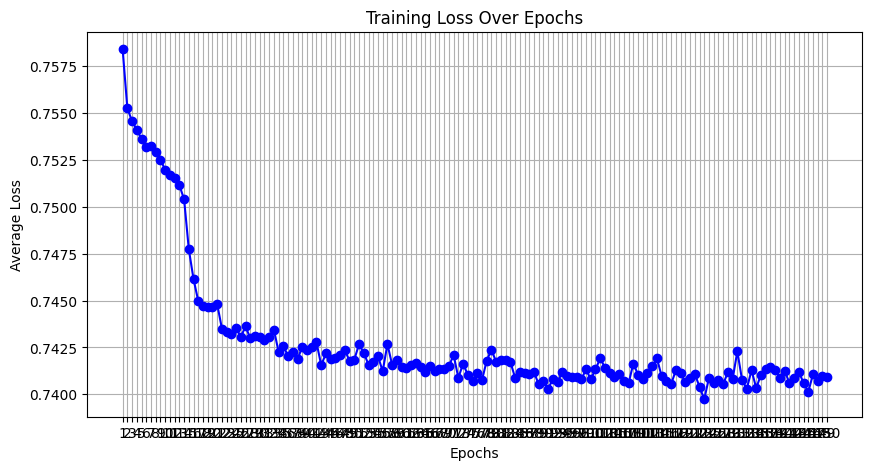

In [ ]:
# 双方向LSTM+２つのドロップアウト層
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')  # 特徴量とラベルが一緒のデータ

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    
    for i in range(len(X) - time_steps + 1):  # 修正: +1を追加
        X_reshaped.append(X[i:i + time_steps])
        
    return np.array(X_reshaped)

# データの整形
time_steps = 5  # 5つの時間ステップを使用
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]  # 最初の4つはシーケンスが足りないためカット

# データの形状確認
print(X_reshaped.shape, y_reshaped.shape)

import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# reshape_data関数を定義
def reshape_data(X, time_steps=1):
    X_reshaped = []
    for i in range(len(X) - time_steps + 1):
        X_reshaped.append(X[i:i + time_steps])
    return np.array(X_reshaped)

# データの整形
time_steps = 5
X_reshaped = reshape_data(X, time_steps=time_steps)
y_reshaped = y[time_steps - 1:]

# データの分割（80%を学習、20%を評価）
X_train, X_val, y_train, y_val = train_test_split(X_reshaped, y_reshaped, test_size=0.2, random_state=42)

# データの形状確認
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

# データをPyTorchのテンソルに変換
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)

# データセットとデータローダーの作成
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# BiLSTMモデルの定義
class BiLSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=2, dropout_prob=0.5):
        super(BiLSTMModel, self).__init__()
        # 2つの双方向LSTM層を設定
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers, 
                            dropout=dropout_prob, bidirectional=True, batch_first=True)
        # ドロップアウト層を設定
        self.dropout = nn.Dropout(dropout_prob)
        # 双方向LSTMなのでhidden_size * 2を次元に持つ全結合層
        self.fc = nn.Linear(hidden_size * 2, output_size)

    def forward(self, x):
        # LSTM層を通過
        lstm_out, (hn, cn) = self.lstm(x)
        # ドロップアウトを適用
        lstm_out = self.dropout(lstm_out)
        # 双方向なので、順方向と逆方向の出力を結合 (hidden statesの最後を使用)
        hn_concat = torch.cat((hn[-2], hn[-1]), dim=1)  # 双方向の最終層の出力を結合
        # 全結合層に通して出力
        out = self.fc(hn_concat)
        return out

# モデルのインスタンスを作成
input_size = X_train_tensor.shape[2]
hidden_size = 50
output_size = 3  # アクセントのクラス数（0, 1, 2）
num_layers = 2
dropout_prob = 0.5

model = BiLSTMModel(input_size, hidden_size, output_size, num_layers=num_layers, dropout_prob=dropout_prob)

# 損失関数とオプティマイザの定義
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# 評価結果を保存するリスト
val_losses = []
val_accuracies = []

import matplotlib.pyplot as plt
from tqdm import tqdm

# 学習
num_epochs = 150
epoch_losses = []  # 各エポックの平均損失を格納するリスト

for epoch in range(num_epochs):
    model.train()  # モデルをトレーニングモードに設定
    epoch_loss = 0
    
    with tqdm(total=len(train_dataloader), desc=f'Epoch {epoch + 1}/{num_epochs}', unit='batch') as pbar:
        for inputs, labels in train_dataloader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
            pbar.update(1)
    
    average_loss = epoch_loss / len(train_dataloader)
    epoch_losses.append(average_loss)  # 平均損失をリストに追加
    print(f'Epoch [{epoch + 1}/{num_epochs}], Average Loss: {average_loss:.4f}')

# 損失の折れ線グラフを描画
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), epoch_losses, marker='o', linestyle='-', color='b')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Average Loss')
plt.xticks(range(1, num_epochs + 1))  # x軸の目盛りを設定
plt.grid()
plt.show()

In [7]:
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）
print(X)
print(y)

[[193.32679122 222.76349146 180.66581811  10.13195176 190.07284255]
 [208.51359371 253.64304791 176.59760768  28.6668768  190.65943273]
 [253.46414558 279.84408799 231.4532376   13.6187348  252.06062235]
 ...
 [209.04845572 230.81346107 189.59980274  13.00838447 212.70875402]
 [202.79836018 210.84090246 192.04427334   4.6199699  201.92711609]
 [198.74001385 221.65624548 177.0609461    8.5613774  196.97067933]]
[0. 2. 0. ... 0. 2. 0.]


In [8]:
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    csv_files = glob.glob(f"{folder_path}/*.csv")
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

# 特徴量をDataFrameに変換してCSVファイルとして保存
X_df = pd.DataFrame(X, columns=['Mean', 'Max', 'Min', 'Std', 'Median'])
X_df.to_csv('output_features.csv', index=False)  # index=Falseでインデックスを保存しない

In [9]:
# 各音声の区切りがわからない
import pandas as pd
import numpy as np
import glob

def load_and_preprocess_data(folder_path):
    # f0_statistics_1.csv から f0_statistics_5000.csv までのファイルを指定して読み込む
    csv_files = [f"{folder_path}/f0_statistics_{i}.csv" for i in range(1, 5001)]
    
    data_list = []
    
    for file in csv_files:
        df = pd.read_csv(file)
        # 必要な列を取得
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        data_list.append(data)
    
    return np.concatenate(data_list, axis=0)

# データのロード
data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルを分ける
X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
y = data[:, -1]   # ラベル（Accent）

# 特徴量をDataFrameに変換してCSVファイルとして保存
X_df = pd.DataFrame(X, columns=['Mean', 'Max', 'Min', 'Std', 'Median'])
X_df.to_csv('output_features.csv', index=False)  # index=Falseでインデックスを保存しない

In [10]:
import pandas as pd
import numpy as np
import glob
import os

def load_and_preprocess_data(folder_path):
    # f0_statistics_1.csv から f0_statistics_5000.csv までのファイルを指定して読み込む
    csv_files = [f"{folder_path}/f0_statistics_{i}.csv" for i in range(1, 5001)]
    
    # 音声ごとに特徴量とラベルを保存するリスト
    audio_data = {}

    for file in csv_files:
        # CSVを読み込む
        df = pd.read_csv(file)
        # 必要な列を取得
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        
        # 音声のIDをファイル名から取得
        audio_id = os.path.basename(file).split('.')[0]  # 例: 'f0_statistics_1'
        
        # 音声ごとに特徴量とラベルを保存
        audio_data[audio_id] = data

    return audio_data

# データのロード
audio_data = load_and_preprocess_data('f0_stac_result_5000')

# 保存先のディレクトリを作成
output_folder = 'processed_audio_data'
os.makedirs(output_folder, exist_ok=True)

# 各音声のデータをCSVファイルに保存
for audio_id, data in audio_data.items():
    # 特徴量とラベルを分ける
    X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
    y = data[:, -1]   # ラベル（Accent）
    
    # DataFrameを作成
    df = pd.DataFrame(X, columns=['Mean', 'Max', 'Min', 'Std', 'Median'])
    df['Accent'] = y  # アクセントラベルを追加
    
    # CSVファイルとして保存
    output_file = os.path.join(output_folder, f"{audio_id}.csv")
    df.to_csv(output_file, index=False)

    print(f"Saved: {output_file}")

Saved: processed_audio_data/f0_statistics_1.csv
Saved: processed_audio_data/f0_statistics_2.csv
Saved: processed_audio_data/f0_statistics_3.csv
Saved: processed_audio_data/f0_statistics_4.csv
Saved: processed_audio_data/f0_statistics_5.csv
Saved: processed_audio_data/f0_statistics_6.csv
Saved: processed_audio_data/f0_statistics_7.csv
Saved: processed_audio_data/f0_statistics_8.csv
Saved: processed_audio_data/f0_statistics_9.csv
Saved: processed_audio_data/f0_statistics_10.csv
Saved: processed_audio_data/f0_statistics_11.csv
Saved: processed_audio_data/f0_statistics_12.csv
Saved: processed_audio_data/f0_statistics_13.csv
Saved: processed_audio_data/f0_statistics_14.csv
Saved: processed_audio_data/f0_statistics_15.csv
Saved: processed_audio_data/f0_statistics_16.csv
Saved: processed_audio_data/f0_statistics_17.csv
Saved: processed_audio_data/f0_statistics_18.csv
Saved: processed_audio_data/f0_statistics_19.csv
Saved: processed_audio_data/f0_statistics_20.csv
Saved: processed_audio_data/f

In [ ]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# 入力；f0_stac_result_5000
# 出力；prepared_features_dataとして保存
# 特徴量とアクセントの統合データを特徴量だけとアクセントだけのファイルに分けた！
import pandas as pd
import numpy as np
import glob
import os
import torch

# データのロードと整形を行う関数
def load_and_preprocess_data(folder_path):
    # 指定したフォルダー内のCSVファイルを全て取得
    csv_files = [f"{folder_path}/f0_statistics_{i}.csv" for i in range(1, 5001)]
    
    audio_data = {}

    # 各CSVファイルを読み込み
    for file in csv_files:
        # CSVファイルをDataFrameとして読み込み
        df = pd.read_csv(file)
        
        # 特徴量とラベルを抽出
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        
        # ファイル名から音声IDを取得
        audio_id = os.path.basename(file).split('.')[0]  # 例: 'f0_statistics_1'

        # 音声IDをキーとしてデータを辞書に格納
        audio_data[audio_id] = data

    return audio_data

# データのロード
audio_data = load_and_preprocess_data('f0_stac_result_5000')

# 特徴量とラベルに分け、PyTorchのテンソルに変換する関数
def prepare_data(audio_data):
    X_list = []
    y_list = []
    
    for audio_id, data in audio_data.items():
        # 特徴量とラベルを分ける
        X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
        y = data[:, -1]   # ラベル（Accent）

        # 各音声データの特徴量とラベルをリストに追加
        X_list.append(X)
        y_list.append(y)

    # リストをPyTorchのテンソルに変換
    X_tensor = [torch.tensor(X, dtype=torch.float32) for X in X_list]
    y_tensor = [torch.tensor(y, dtype=torch.long) for y in y_list]

    return X_tensor, y_tensor

# 特徴量とラベルを準備する
X_tensor, y_tensor = prepare_data(audio_data)

# データの確認
for i in range(len(X_tensor)):
    print(f"Audio ID: {i + 1}, Feature shape: {X_tensor[i].shape}, Label shape: {y_tensor[i].shape}")

# データを保存する（必要に応じて）
def save_data(X_tensor, y_tensor, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    for i, (X, y) in enumerate(zip(X_tensor, y_tensor)):
        # 特徴量とラベルをCSVファイルとして保存
        df_X = pd.DataFrame(X.numpy(), columns=['Mean', 'Max', 'Min', 'Std', 'Median'])
        df_y = pd.DataFrame(y.numpy(), columns=['Accent'])
        
        df_X.to_csv(os.path.join(output_folder, f"features_audio_{i + 1}.csv"), index=False)
        df_y.to_csv(os.path.join(output_folder, f"labels_audio_{i + 1}.csv"), index=False)

# 特徴量とラベルを保存（必要に応じて）
save_data(X_tensor, y_tensor, 'prepared_features_data')

print("データの準備と保存が完了しました。")

Audio ID: 1, Feature shape: torch.Size([23, 5]), Label shape: torch.Size([23])
Audio ID: 2, Feature shape: torch.Size([36, 5]), Label shape: torch.Size([36])
Audio ID: 3, Feature shape: torch.Size([28, 5]), Label shape: torch.Size([28])
Audio ID: 4, Feature shape: torch.Size([23, 5]), Label shape: torch.Size([23])
Audio ID: 5, Feature shape: torch.Size([27, 5]), Label shape: torch.Size([27])
Audio ID: 6, Feature shape: torch.Size([21, 5]), Label shape: torch.Size([21])
Audio ID: 7, Feature shape: torch.Size([17, 5]), Label shape: torch.Size([17])
Audio ID: 8, Feature shape: torch.Size([28, 5]), Label shape: torch.Size([28])
Audio ID: 9, Feature shape: torch.Size([21, 5]), Label shape: torch.Size([21])
Audio ID: 10, Feature shape: torch.Size([31, 5]), Label shape: torch.Size([31])
Audio ID: 11, Feature shape: torch.Size([26, 5]), Label shape: torch.Size([26])
Audio ID: 12, Feature shape: torch.Size([24, 5]), Label shape: torch.Size([24])
Audio ID: 13, Feature shape: torch.Size([30, 5]),

In [17]:
# ここから！
import pandas as pd
import os
import torch
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)
print(X_list)
print(y_list)

[tensor([[220.1532, 233.1025, 203.7741,   8.4280, 221.5975],
        [234.3138, 289.1366, 205.9780,  25.8086, 227.4372],
        [292.2794, 297.4105, 286.8425,   3.2274, 292.5545],
        [272.2669, 303.3582, 247.2070,  17.6739, 272.4776],
        [278.5027, 334.6972, 247.5841,  29.6248, 271.9398],
        [367.0295, 379.8789, 341.5825,  12.0248, 372.9296],
        [333.2610, 372.3958, 283.5876,  33.3897, 342.1624],
        [232.5356, 284.1006, 203.9635,  23.8735, 224.2536],
        [199.3579, 228.7899, 173.3367,  15.0315, 199.5000],
        [184.7273, 196.1951, 176.2460,   5.0661, 183.7427],
        [188.2982, 208.1497, 154.6721,  16.3688, 198.3850],
        [227.0187, 267.0948, 197.8895,  21.4841, 225.1755],
        [297.7467, 319.8497, 267.1959,  14.8757, 301.5992],
        [  0.0000,   0.0000,   0.0000,   0.0000,   0.0000],
        [271.5930, 280.9266, 257.4801,   9.4255, 273.9827],
        [204.3236, 242.7508, 186.7180,  14.8480, 199.2627],
        [168.1414, 184.7172, 158.9665, 

In [18]:
# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

In [19]:
import torch.nn as nn

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])  # 最後のタイムステップの出力を使う
        return out

# ハイパーパラメータの設定
input_size = 5  # 特徴量の次元数 (Mean, Max, Min, Std, Median の5つ)
hidden_size = 64
output_size = len(set(torch.cat(y_list).numpy()))  # ラベル（アクセント）の数

# モデルのインスタンス化
model = LSTMModel(input_size, hidden_size, output_size)


In [23]:
import torch
import torch.nn as nn
import torch.optim as optim

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=20, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    for epoch in range(num_epochs):
        total_loss = 0.0
        for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
            # バッチ化されたデータをモデルに渡して予測を取得
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            
            # 出力とラベルの形を一致させる
            outputs = outputs.view(-1, outputs.size(-1))
            
            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(X_train):.4f}")

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Epoch [1/20], Loss: 0.7685
Epoch [2/20], Loss: 0.7576
Epoch [3/20], Loss: 0.7418
Epoch [4/20], Loss: 0.7197
Epoch [5/20], Loss: 0.7159
Epoch [6/20], Loss: 0.7136
Epoch [7/20], Loss: 0.7130
Epoch [8/20], Loss: 0.7120
Epoch [9/20], Loss: 0.7121
Epoch [10/20], Loss: 0.7127
Epoch [11/20], Loss: 0.7117
Epoch [12/20], Loss: 0.7113
Epoch [13/20], Loss: 0.7111
Epoch [14/20], Loss: 0.7110
Epoch [15/20], Loss: 0.7112
Epoch [16/20], Loss: 0.7107
Epoch [17/20], Loss: 0.7107
Epoch [18/20], Loss: 0.7105
Epoch [19/20], Loss: 0.7105
Epoch [20/20], Loss: 0.7100


In [ ]:
# まとめ
import pandas as pd
import os
import torch
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"re_features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"re_labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

import torch.nn as nn

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])  # 最後のタイムステップの出力を使う
        return out

# ハイパーパラメータの設定
input_size = 5  # 特徴量の次元数 (Mean, Max, Min, Std, Median の5つ)
hidden_size = 64
output_size = len(set(torch.cat(y_list).numpy()))  # ラベル（アクセント）の数

# モデルのインスタンス化
model = LSTMModel(input_size, hidden_size, output_size)

import torch
import torch.nn as nn
import torch.optim as optim

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=20, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    for epoch in range(num_epochs):
        total_loss = 0.0
        for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
            # バッチ化されたデータをモデルに渡して予測を取得
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            
            # 出力とラベルの形を一致させる
            outputs = outputs.view(-1, outputs.size(-1))
            
            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {total_loss / len(X_train):.4f}")

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Training Progress:   5%|▌         | 1/20 [00:06<02:01,  6.42s/it]

Epoch [1/20], Loss: 0.7690


Training Progress:  10%|█         | 2/20 [00:13<02:01,  6.76s/it]

Epoch [2/20], Loss: 0.7594


Training Progress:  15%|█▌        | 3/20 [00:20<01:54,  6.72s/it]

Epoch [3/20], Loss: 0.7542


Training Progress:  20%|██        | 4/20 [00:26<01:44,  6.53s/it]

Epoch [4/20], Loss: 0.7449


Training Progress:  25%|██▌       | 5/20 [00:32<01:36,  6.45s/it]

Epoch [5/20], Loss: 0.7327


Training Progress:  30%|███       | 6/20 [00:39<01:29,  6.43s/it]

Epoch [6/20], Loss: 0.7261


Training Progress:  35%|███▌      | 7/20 [00:45<01:23,  6.41s/it]

Epoch [7/20], Loss: 0.7213


Training Progress:  40%|████      | 8/20 [00:51<01:17,  6.43s/it]

Epoch [8/20], Loss: 0.7176


Training Progress:  45%|████▌     | 9/20 [00:58<01:11,  6.53s/it]

Epoch [9/20], Loss: 0.7145


Training Progress:  50%|█████     | 10/20 [01:05<01:05,  6.53s/it]

Epoch [10/20], Loss: 0.7123


Training Progress:  55%|█████▌    | 11/20 [01:11<00:58,  6.55s/it]

Epoch [11/20], Loss: 0.7106


Training Progress:  60%|██████    | 12/20 [01:18<00:52,  6.54s/it]

Epoch [12/20], Loss: 0.7095


Training Progress:  65%|██████▌   | 13/20 [01:24<00:45,  6.56s/it]

Epoch [13/20], Loss: 0.7085


Training Progress:  70%|███████   | 14/20 [01:31<00:39,  6.57s/it]

Epoch [14/20], Loss: 0.7077


Training Progress:  75%|███████▌  | 15/20 [01:38<00:33,  6.62s/it]

Epoch [15/20], Loss: 0.7068


Training Progress:  80%|████████  | 16/20 [01:44<00:26,  6.67s/it]

Epoch [16/20], Loss: 0.7066


Training Progress:  85%|████████▌ | 17/20 [01:51<00:20,  6.69s/it]

Epoch [17/20], Loss: 0.7059


Training Progress:  90%|█████████ | 18/20 [01:58<00:13,  6.71s/it]

Epoch [18/20], Loss: 0.7057


Training Progress:  95%|█████████▌| 19/20 [02:05<00:06,  6.70s/it]

Epoch [19/20], Loss: 0.7051


Training Progress: 100%|██████████| 20/20 [02:11<00:00,  6.59s/it]

Epoch [20/20], Loss: 0.7052


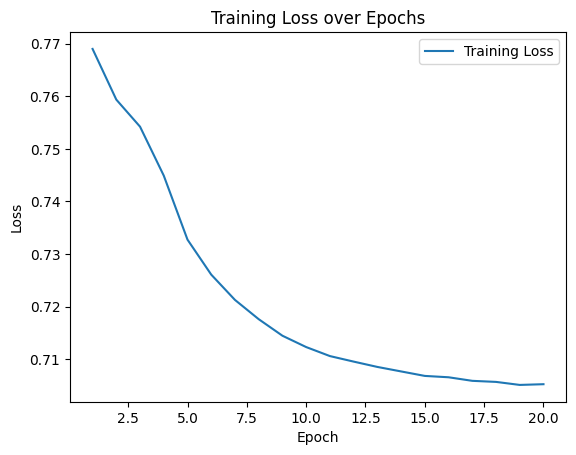

In [ ]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# 学習過程を描画
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=20, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in tqdm(range(num_epochs), desc="Training Progress"):  # tqdmで進捗を表示
        total_loss = 0.0
        for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
            # バッチ化されたデータをモデルに渡して予測を取得
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            
            # 出力とラベルの形を一致させる
            outputs = outputs.view(-1, outputs.size(-1))
            
            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Epoch 1/20: 100%|██████████| 5000/5000 [00:06<00:00, 817.89batch/s]


Epoch [1/20], Loss: 0.7680


Epoch 2/20: 100%|██████████| 5000/5000 [00:06<00:00, 740.42batch/s]


Epoch [2/20], Loss: 0.7581


Epoch 3/20: 100%|██████████| 5000/5000 [00:06<00:00, 777.91batch/s]


Epoch [3/20], Loss: 0.7525


Epoch 4/20: 100%|██████████| 5000/5000 [00:07<00:00, 690.39batch/s]


Epoch [4/20], Loss: 0.7429


Epoch 5/20: 100%|██████████| 5000/5000 [00:06<00:00, 771.85batch/s]


Epoch [5/20], Loss: 0.7285


Epoch 6/20: 100%|██████████| 5000/5000 [00:06<00:00, 771.27batch/s]


Epoch [6/20], Loss: 0.7194


Epoch 7/20: 100%|██████████| 5000/5000 [00:06<00:00, 758.03batch/s]


Epoch [7/20], Loss: 0.7162


Epoch 8/20: 100%|██████████| 5000/5000 [00:06<00:00, 752.64batch/s]


Epoch [8/20], Loss: 0.7147


Epoch 9/20: 100%|██████████| 5000/5000 [00:06<00:00, 753.98batch/s]


Epoch [9/20], Loss: 0.7139


Epoch 10/20: 100%|██████████| 5000/5000 [00:07<00:00, 711.53batch/s]


Epoch [10/20], Loss: 0.7136


Epoch 11/20: 100%|██████████| 5000/5000 [00:07<00:00, 676.19batch/s]


Epoch [11/20], Loss: 0.7133


Epoch 12/20: 100%|██████████| 5000/5000 [00:06<00:00, 718.73batch/s]


Epoch [12/20], Loss: 0.7131


Epoch 13/20: 100%|██████████| 5000/5000 [00:07<00:00, 705.83batch/s]


Epoch [13/20], Loss: 0.7172


Epoch 14/20: 100%|██████████| 5000/5000 [00:07<00:00, 690.98batch/s]


Epoch [14/20], Loss: 0.7119


Epoch 15/20: 100%|██████████| 5000/5000 [00:06<00:00, 727.94batch/s]


Epoch [15/20], Loss: 0.7084


Epoch 16/20: 100%|██████████| 5000/5000 [00:06<00:00, 727.86batch/s]


Epoch [16/20], Loss: 0.7068


Epoch 17/20: 100%|██████████| 5000/5000 [00:06<00:00, 739.78batch/s]


Epoch [17/20], Loss: 0.7062


Epoch 18/20: 100%|██████████| 5000/5000 [00:07<00:00, 660.34batch/s]


Epoch [18/20], Loss: 0.7055


Epoch 19/20: 100%|██████████| 5000/5000 [00:07<00:00, 697.83batch/s]


Epoch [19/20], Loss: 0.7052


Epoch 20/20: 100%|██████████| 5000/5000 [00:06<00:00, 750.63batch/s]


Epoch [20/20], Loss: 0.7052


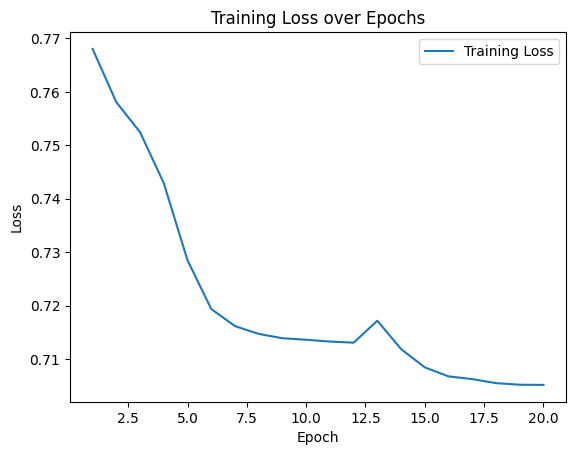

In [26]:
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=20, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in range(num_epochs):
        total_loss = 0.0
        
        # tqdmでエポック全体の進捗バーを表示（全バッチを100%とする）
        with tqdm(total=len(X_train), desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
                # バッチ化されたデータをモデルに渡して予測を取得
                inputs = inputs.unsqueeze(0)  # バッチ次元を追加
                labels = labels.view(-1)  # ラベルを1次元に変換
                
                outputs = model(inputs)
                
                # 出力とラベルの形を一致させる
                outputs = outputs.view(-1, outputs.size(-1))
                
                # 損失計算
                loss = criterion(outputs, labels)
                total_loss += loss.item()
                
                # バックプロパゲーション
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # バッチごとに進捗を更新
                pbar.update(1)

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Epoch 1/100: 100%|██████████| 5000/5000 [00:06<00:00, 803.56batch/s]


Epoch [1/100], Loss: 0.7694


Epoch 2/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.89batch/s]


Epoch [2/100], Loss: 0.7576


Epoch 3/100: 100%|██████████| 5000/5000 [00:06<00:00, 784.07batch/s]


Epoch [3/100], Loss: 0.7460


Epoch 4/100: 100%|██████████| 5000/5000 [00:06<00:00, 773.92batch/s]


Epoch [4/100], Loss: 0.7336


Epoch 5/100: 100%|██████████| 5000/5000 [00:06<00:00, 743.75batch/s]


Epoch [5/100], Loss: 0.7225


Epoch 6/100: 100%|██████████| 5000/5000 [00:06<00:00, 729.19batch/s]


Epoch [6/100], Loss: 0.7177


Epoch 7/100: 100%|██████████| 5000/5000 [00:06<00:00, 749.27batch/s]


Epoch [7/100], Loss: 0.7158


Epoch 8/100: 100%|██████████| 5000/5000 [00:06<00:00, 744.33batch/s]


Epoch [8/100], Loss: 0.7145


Epoch 9/100: 100%|██████████| 5000/5000 [00:06<00:00, 750.17batch/s]


Epoch [9/100], Loss: 0.7137


Epoch 10/100: 100%|██████████| 5000/5000 [00:06<00:00, 740.61batch/s]


Epoch [10/100], Loss: 0.7137


Epoch 11/100: 100%|██████████| 5000/5000 [00:06<00:00, 742.99batch/s]


Epoch [11/100], Loss: 0.7133


Epoch 12/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.10batch/s]


Epoch [12/100], Loss: 0.7134


Epoch 13/100: 100%|██████████| 5000/5000 [00:08<00:00, 619.58batch/s]


Epoch [13/100], Loss: 0.7128


Epoch 14/100: 100%|██████████| 5000/5000 [00:07<00:00, 670.49batch/s]


Epoch [14/100], Loss: 0.7126


Epoch 15/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.60batch/s]


Epoch [15/100], Loss: 0.7125


Epoch 16/100: 100%|██████████| 5000/5000 [00:07<00:00, 697.19batch/s]


Epoch [16/100], Loss: 0.7130


Epoch 17/100: 100%|██████████| 5000/5000 [00:06<00:00, 742.28batch/s]


Epoch [17/100], Loss: 0.7128


Epoch 18/100: 100%|██████████| 5000/5000 [00:06<00:00, 740.95batch/s]


Epoch [18/100], Loss: 0.7125


Epoch 19/100: 100%|██████████| 5000/5000 [00:07<00:00, 693.45batch/s]


Epoch [19/100], Loss: 0.7125


Epoch 20/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.87batch/s]


Epoch [20/100], Loss: 0.7126


Epoch 21/100: 100%|██████████| 5000/5000 [00:07<00:00, 662.67batch/s]


Epoch [21/100], Loss: 0.7121


Epoch 22/100: 100%|██████████| 5000/5000 [00:07<00:00, 655.62batch/s]


Epoch [22/100], Loss: 0.7120


Epoch 23/100: 100%|██████████| 5000/5000 [00:06<00:00, 719.50batch/s]


Epoch [23/100], Loss: 0.7116


Epoch 24/100: 100%|██████████| 5000/5000 [00:07<00:00, 681.58batch/s]


Epoch [24/100], Loss: 0.7117


Epoch 25/100: 100%|██████████| 5000/5000 [00:06<00:00, 723.81batch/s]


Epoch [25/100], Loss: 0.7124


Epoch 26/100: 100%|██████████| 5000/5000 [00:07<00:00, 683.76batch/s]


Epoch [26/100], Loss: 0.7347


Epoch 27/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.80batch/s]


Epoch [27/100], Loss: 0.7171


Epoch 28/100: 100%|██████████| 5000/5000 [00:06<00:00, 722.77batch/s]


Epoch [28/100], Loss: 0.7154


Epoch 29/100: 100%|██████████| 5000/5000 [00:06<00:00, 716.55batch/s]


Epoch [29/100], Loss: 0.7148


Epoch 30/100: 100%|██████████| 5000/5000 [00:07<00:00, 687.16batch/s]


Epoch [30/100], Loss: 0.7141


Epoch 31/100: 100%|██████████| 5000/5000 [00:07<00:00, 693.97batch/s]


Epoch [31/100], Loss: 0.7137


Epoch 32/100: 100%|██████████| 5000/5000 [00:07<00:00, 698.30batch/s]


Epoch [32/100], Loss: 0.7132


Epoch 33/100: 100%|██████████| 5000/5000 [00:06<00:00, 727.62batch/s]


Epoch [33/100], Loss: 0.7128


Epoch 34/100: 100%|██████████| 5000/5000 [00:06<00:00, 722.08batch/s]


Epoch [34/100], Loss: 0.7124


Epoch 35/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.43batch/s]


Epoch [35/100], Loss: 0.7121


Epoch 36/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.06batch/s]


Epoch [36/100], Loss: 0.7119


Epoch 37/100: 100%|██████████| 5000/5000 [00:06<00:00, 733.65batch/s]


Epoch [37/100], Loss: 0.7116


Epoch 38/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.91batch/s]


Epoch [38/100], Loss: 0.7115


Epoch 39/100: 100%|██████████| 5000/5000 [00:07<00:00, 708.36batch/s]


Epoch [39/100], Loss: 0.7115


Epoch 40/100: 100%|██████████| 5000/5000 [00:07<00:00, 696.62batch/s]


Epoch [40/100], Loss: 0.7113


Epoch 41/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.16batch/s]


Epoch [41/100], Loss: 0.7114


Epoch 42/100: 100%|██████████| 5000/5000 [00:06<00:00, 745.66batch/s]


Epoch [42/100], Loss: 0.7113


Epoch 43/100: 100%|██████████| 5000/5000 [00:06<00:00, 733.66batch/s]


Epoch [43/100], Loss: 0.7111


Epoch 44/100: 100%|██████████| 5000/5000 [00:06<00:00, 740.51batch/s]


Epoch [44/100], Loss: 0.7110


Epoch 45/100: 100%|██████████| 5000/5000 [00:06<00:00, 732.87batch/s]


Epoch [45/100], Loss: 0.7109


Epoch 46/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.38batch/s]


Epoch [46/100], Loss: 0.7109


Epoch 47/100: 100%|██████████| 5000/5000 [00:06<00:00, 716.47batch/s]


Epoch [47/100], Loss: 0.7108


Epoch 48/100: 100%|██████████| 5000/5000 [00:07<00:00, 656.28batch/s]


Epoch [48/100], Loss: 0.7109


Epoch 49/100: 100%|██████████| 5000/5000 [00:06<00:00, 740.67batch/s]


Epoch [49/100], Loss: 0.7111


Epoch 50/100: 100%|██████████| 5000/5000 [00:06<00:00, 722.32batch/s]


Epoch [50/100], Loss: 0.7106


Epoch 51/100: 100%|██████████| 5000/5000 [00:07<00:00, 691.34batch/s]


Epoch [51/100], Loss: 0.7105


Epoch 52/100: 100%|██████████| 5000/5000 [00:07<00:00, 642.64batch/s]


Epoch [52/100], Loss: 0.7103


Epoch 53/100: 100%|██████████| 5000/5000 [00:07<00:00, 678.77batch/s]


Epoch [53/100], Loss: 0.7110


Epoch 54/100: 100%|██████████| 5000/5000 [00:06<00:00, 728.84batch/s]


Epoch [54/100], Loss: 0.7108


Epoch 55/100: 100%|██████████| 5000/5000 [00:07<00:00, 711.94batch/s]


Epoch [55/100], Loss: 0.7108


Epoch 56/100: 100%|██████████| 5000/5000 [00:07<00:00, 692.19batch/s]


Epoch [56/100], Loss: 0.7107


Epoch 57/100: 100%|██████████| 5000/5000 [00:07<00:00, 665.75batch/s]


Epoch [57/100], Loss: 0.7269


Epoch 58/100: 100%|██████████| 5000/5000 [00:07<00:00, 674.46batch/s]


Epoch [58/100], Loss: 0.7166


Epoch 59/100: 100%|██████████| 5000/5000 [00:06<00:00, 738.12batch/s]


Epoch [59/100], Loss: 0.7158


Epoch 60/100: 100%|██████████| 5000/5000 [00:06<00:00, 732.42batch/s]


Epoch [60/100], Loss: 0.7153


Epoch 61/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.72batch/s]


Epoch [61/100], Loss: 0.7151


Epoch 62/100: 100%|██████████| 5000/5000 [00:06<00:00, 723.57batch/s]


Epoch [62/100], Loss: 0.7148


Epoch 63/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.96batch/s]


Epoch [63/100], Loss: 0.7145


Epoch 64/100: 100%|██████████| 5000/5000 [00:07<00:00, 642.14batch/s]


Epoch [64/100], Loss: 0.7143


Epoch 65/100: 100%|██████████| 5000/5000 [00:06<00:00, 732.22batch/s]


Epoch [65/100], Loss: 0.7140


Epoch 66/100: 100%|██████████| 5000/5000 [00:07<00:00, 707.75batch/s]


Epoch [66/100], Loss: 0.7139


Epoch 67/100: 100%|██████████| 5000/5000 [00:06<00:00, 737.28batch/s]


Epoch [67/100], Loss: 0.7137


Epoch 68/100: 100%|██████████| 5000/5000 [00:06<00:00, 723.77batch/s]


Epoch [68/100], Loss: 0.7135


Epoch 69/100: 100%|██████████| 5000/5000 [00:07<00:00, 702.81batch/s]


Epoch [69/100], Loss: 0.7135


Epoch 70/100: 100%|██████████| 5000/5000 [00:06<00:00, 724.00batch/s]


Epoch [70/100], Loss: 0.7133


Epoch 71/100: 100%|██████████| 5000/5000 [00:06<00:00, 727.95batch/s]


Epoch [71/100], Loss: 0.7132


Epoch 72/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.17batch/s]


Epoch [72/100], Loss: 0.7130


Epoch 73/100: 100%|██████████| 5000/5000 [00:07<00:00, 698.30batch/s]


Epoch [73/100], Loss: 0.7130


Epoch 74/100: 100%|██████████| 5000/5000 [00:07<00:00, 694.31batch/s]


Epoch [74/100], Loss: 0.7127


Epoch 75/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.44batch/s]


Epoch [75/100], Loss: 0.7126


Epoch 76/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.98batch/s]


Epoch [76/100], Loss: 0.7125


Epoch 77/100: 100%|██████████| 5000/5000 [00:06<00:00, 732.83batch/s]


Epoch [77/100], Loss: 0.7125


Epoch 78/100: 100%|██████████| 5000/5000 [00:06<00:00, 726.87batch/s]


Epoch [78/100], Loss: 0.7123


Epoch 79/100: 100%|██████████| 5000/5000 [00:07<00:00, 702.50batch/s]


Epoch [79/100], Loss: 0.7123


Epoch 80/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.71batch/s]


Epoch [80/100], Loss: 0.7122


Epoch 81/100: 100%|██████████| 5000/5000 [00:06<00:00, 728.76batch/s]


Epoch [81/100], Loss: 0.7123


Epoch 82/100: 100%|██████████| 5000/5000 [00:07<00:00, 666.73batch/s]


Epoch [82/100], Loss: 0.7121


Epoch 83/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.71batch/s]


Epoch [83/100], Loss: 0.7120


Epoch 84/100: 100%|██████████| 5000/5000 [00:06<00:00, 732.19batch/s]


Epoch [84/100], Loss: 0.7122


Epoch 85/100: 100%|██████████| 5000/5000 [00:06<00:00, 725.57batch/s]


Epoch [85/100], Loss: 0.7119


Epoch 86/100: 100%|██████████| 5000/5000 [00:07<00:00, 694.66batch/s]


Epoch [86/100], Loss: 0.7120


Epoch 87/100: 100%|██████████| 5000/5000 [00:07<00:00, 661.11batch/s]


Epoch [87/100], Loss: 0.7118


Epoch 88/100: 100%|██████████| 5000/5000 [00:06<00:00, 747.90batch/s]


Epoch [88/100], Loss: 0.7117


Epoch 89/100: 100%|██████████| 5000/5000 [00:06<00:00, 721.40batch/s]


Epoch [89/100], Loss: 0.7112


Epoch 90/100: 100%|██████████| 5000/5000 [00:06<00:00, 738.26batch/s]


Epoch [90/100], Loss: 0.7145


Epoch 91/100: 100%|██████████| 5000/5000 [00:07<00:00, 672.04batch/s]


Epoch [91/100], Loss: 0.7118


Epoch 92/100: 100%|██████████| 5000/5000 [00:07<00:00, 711.81batch/s]


Epoch [92/100], Loss: 0.7116


Epoch 93/100: 100%|██████████| 5000/5000 [00:07<00:00, 711.09batch/s]


Epoch [93/100], Loss: 0.7115


Epoch 94/100: 100%|██████████| 5000/5000 [00:06<00:00, 724.29batch/s]


Epoch [94/100], Loss: 0.7114


Epoch 95/100: 100%|██████████| 5000/5000 [00:06<00:00, 736.50batch/s]


Epoch [95/100], Loss: 0.7115


Epoch 96/100: 100%|██████████| 5000/5000 [00:06<00:00, 730.68batch/s]


Epoch [96/100], Loss: 0.7113


Epoch 97/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.33batch/s]


Epoch [97/100], Loss: 0.7113


Epoch 98/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.07batch/s]


Epoch [98/100], Loss: 0.7110


Epoch 99/100: 100%|██████████| 5000/5000 [00:06<00:00, 734.56batch/s]


Epoch [99/100], Loss: 0.7112


Epoch 100/100: 100%|██████████| 5000/5000 [00:06<00:00, 735.84batch/s]


Epoch [100/100], Loss: 0.7107


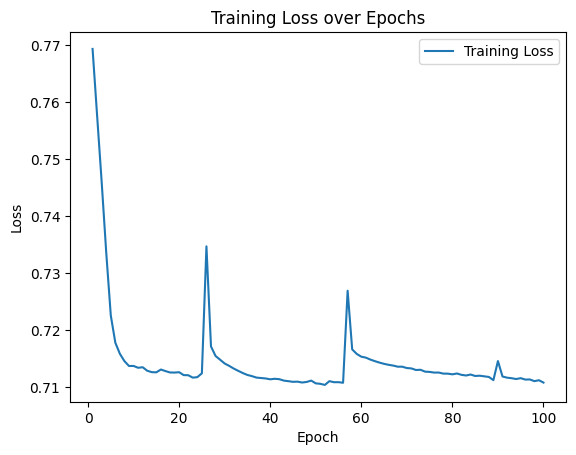

In [27]:
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in range(num_epochs):
        total_loss = 0.0
        
        # tqdmでエポック全体の進捗バーを表示（全バッチを100%とする）
        with tqdm(total=len(X_train), desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
                # バッチ化されたデータをモデルに渡して予測を取得
                inputs = inputs.unsqueeze(0)  # バッチ次元を追加
                labels = labels.view(-1)  # ラベルを1次元に変換
                
                outputs = model(inputs)
                
                # 出力とラベルの形を一致させる
                outputs = outputs.view(-1, outputs.size(-1))
                
                # 損失計算
                loss = criterion(outputs, labels)
                total_loss += loss.item()
                
                # バックプロパゲーション
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # バッチごとに進捗を更新
                pbar.update(1)

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Epoch 1/200: 100%|██████████| 5000/5000 [00:06<00:00, 822.15batch/s]


Epoch [1/200], Loss: 0.7669


Epoch 2/200: 100%|██████████| 5000/5000 [00:06<00:00, 802.33batch/s]


Epoch [2/200], Loss: 0.7571


Epoch 3/200: 100%|██████████| 5000/5000 [00:06<00:00, 780.35batch/s]


Epoch [3/200], Loss: 0.7509


Epoch 4/200: 100%|██████████| 5000/5000 [00:06<00:00, 772.56batch/s]


Epoch [4/200], Loss: 0.7431


Epoch 5/200: 100%|██████████| 5000/5000 [00:06<00:00, 747.47batch/s]


Epoch [5/200], Loss: 0.7346


Epoch 6/200: 100%|██████████| 5000/5000 [00:06<00:00, 777.02batch/s]


Epoch [6/200], Loss: 0.7284


Epoch 7/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.73batch/s]


Epoch [7/200], Loss: 0.7270


Epoch 8/200: 100%|██████████| 5000/5000 [00:06<00:00, 759.01batch/s]


Epoch [8/200], Loss: 0.7249


Epoch 9/200: 100%|██████████| 5000/5000 [00:07<00:00, 691.49batch/s]


Epoch [9/200], Loss: 0.7228


Epoch 10/200: 100%|██████████| 5000/5000 [00:06<00:00, 758.74batch/s]


Epoch [10/200], Loss: 0.7215


Epoch 11/200: 100%|██████████| 5000/5000 [00:07<00:00, 713.88batch/s]


Epoch [11/200], Loss: 0.7189


Epoch 12/200: 100%|██████████| 5000/5000 [00:07<00:00, 702.49batch/s]


Epoch [12/200], Loss: 0.7190


Epoch 13/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.65batch/s]


Epoch [13/200], Loss: 0.7149


Epoch 14/200: 100%|██████████| 5000/5000 [00:06<00:00, 757.32batch/s]


Epoch [14/200], Loss: 0.7138


Epoch 15/200: 100%|██████████| 5000/5000 [00:06<00:00, 731.86batch/s]


Epoch [15/200], Loss: 0.7131


Epoch 16/200: 100%|██████████| 5000/5000 [00:07<00:00, 714.28batch/s]


Epoch [16/200], Loss: 0.7125


Epoch 17/200: 100%|██████████| 5000/5000 [00:06<00:00, 758.82batch/s]


Epoch [17/200], Loss: 0.7121


Epoch 18/200: 100%|██████████| 5000/5000 [00:06<00:00, 751.21batch/s]


Epoch [18/200], Loss: 0.7117


Epoch 19/200: 100%|██████████| 5000/5000 [00:06<00:00, 755.64batch/s]


Epoch [19/200], Loss: 0.7171


Epoch 20/200: 100%|██████████| 5000/5000 [00:06<00:00, 750.02batch/s]


Epoch [20/200], Loss: 0.7171


Epoch 21/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.68batch/s]


Epoch [21/200], Loss: 0.7165


Epoch 22/200: 100%|██████████| 5000/5000 [00:06<00:00, 760.82batch/s]


Epoch [22/200], Loss: 0.7124


Epoch 23/200: 100%|██████████| 5000/5000 [00:06<00:00, 754.65batch/s]


Epoch [23/200], Loss: 0.7115


Epoch 24/200: 100%|██████████| 5000/5000 [00:06<00:00, 754.24batch/s]


Epoch [24/200], Loss: 0.7152


Epoch 25/200: 100%|██████████| 5000/5000 [00:06<00:00, 750.95batch/s]


Epoch [25/200], Loss: 0.7109


Epoch 26/200: 100%|██████████| 5000/5000 [00:06<00:00, 760.82batch/s]


Epoch [26/200], Loss: 0.7217


Epoch 27/200: 100%|██████████| 5000/5000 [00:06<00:00, 758.56batch/s]


Epoch [27/200], Loss: 0.7173


Epoch 28/200: 100%|██████████| 5000/5000 [00:06<00:00, 731.88batch/s]


Epoch [28/200], Loss: 0.7166


Epoch 29/200: 100%|██████████| 5000/5000 [00:06<00:00, 740.18batch/s]


Epoch [29/200], Loss: 0.7161


Epoch 30/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.58batch/s]


Epoch [30/200], Loss: 0.7156


Epoch 31/200: 100%|██████████| 5000/5000 [00:06<00:00, 742.76batch/s]


Epoch [31/200], Loss: 0.7152


Epoch 32/200: 100%|██████████| 5000/5000 [00:06<00:00, 744.96batch/s]


Epoch [32/200], Loss: 0.7149


Epoch 33/200: 100%|██████████| 5000/5000 [00:06<00:00, 734.85batch/s]


Epoch [33/200], Loss: 0.7146


Epoch 34/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.89batch/s]


Epoch [34/200], Loss: 0.7143


Epoch 35/200: 100%|██████████| 5000/5000 [00:06<00:00, 752.52batch/s]


Epoch [35/200], Loss: 0.7141


Epoch 36/200: 100%|██████████| 5000/5000 [00:06<00:00, 757.79batch/s]


Epoch [36/200], Loss: 0.7139


Epoch 37/200: 100%|██████████| 5000/5000 [00:06<00:00, 757.31batch/s]


Epoch [37/200], Loss: 0.7136


Epoch 38/200: 100%|██████████| 5000/5000 [00:06<00:00, 752.67batch/s]


Epoch [38/200], Loss: 0.7134


Epoch 39/200: 100%|██████████| 5000/5000 [00:07<00:00, 689.59batch/s]


Epoch [39/200], Loss: 0.7132


Epoch 40/200: 100%|██████████| 5000/5000 [00:06<00:00, 754.61batch/s]


Epoch [40/200], Loss: 0.7130


Epoch 41/200: 100%|██████████| 5000/5000 [00:06<00:00, 755.47batch/s]


Epoch [41/200], Loss: 0.7129


Epoch 42/200: 100%|██████████| 5000/5000 [00:06<00:00, 726.83batch/s]


Epoch [42/200], Loss: 0.7126


Epoch 43/200: 100%|██████████| 5000/5000 [00:06<00:00, 737.81batch/s]


Epoch [43/200], Loss: 0.7125


Epoch 44/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.64batch/s]


Epoch [44/200], Loss: 0.7123


Epoch 45/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.04batch/s]


Epoch [45/200], Loss: 0.7122


Epoch 46/200: 100%|██████████| 5000/5000 [00:06<00:00, 744.29batch/s]


Epoch [46/200], Loss: 0.7121


Epoch 47/200: 100%|██████████| 5000/5000 [00:06<00:00, 750.70batch/s]


Epoch [47/200], Loss: 0.7120


Epoch 48/200: 100%|██████████| 5000/5000 [00:06<00:00, 746.32batch/s]


Epoch [48/200], Loss: 0.7119


Epoch 49/200: 100%|██████████| 5000/5000 [00:06<00:00, 729.52batch/s]


Epoch [49/200], Loss: 0.7118


Epoch 50/200: 100%|██████████| 5000/5000 [00:07<00:00, 709.99batch/s]


Epoch [50/200], Loss: 0.7116


Epoch 51/200: 100%|██████████| 5000/5000 [00:07<00:00, 691.82batch/s]


Epoch [51/200], Loss: 0.7116


Epoch 52/200: 100%|██████████| 5000/5000 [00:06<00:00, 720.97batch/s]


Epoch [52/200], Loss: 0.7115


Epoch 53/200: 100%|██████████| 5000/5000 [00:06<00:00, 753.96batch/s]


Epoch [53/200], Loss: 0.7113


Epoch 54/200: 100%|██████████| 5000/5000 [00:06<00:00, 734.73batch/s]


Epoch [54/200], Loss: 0.7112


Epoch 55/200: 100%|██████████| 5000/5000 [00:07<00:00, 678.60batch/s]


Epoch [55/200], Loss: 0.7111


Epoch 56/200: 100%|██████████| 5000/5000 [00:06<00:00, 744.28batch/s]


Epoch [56/200], Loss: 0.7110


Epoch 57/200: 100%|██████████| 5000/5000 [00:07<00:00, 700.06batch/s]


Epoch [57/200], Loss: 0.7109


Epoch 58/200: 100%|██████████| 5000/5000 [00:07<00:00, 710.63batch/s]


Epoch [58/200], Loss: 0.7108


Epoch 59/200: 100%|██████████| 5000/5000 [00:07<00:00, 689.14batch/s]


Epoch [59/200], Loss: 0.7107


Epoch 60/200: 100%|██████████| 5000/5000 [00:07<00:00, 675.10batch/s]


Epoch [60/200], Loss: 0.7107


Epoch 61/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.98batch/s]


Epoch [61/200], Loss: 0.7106


Epoch 62/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.50batch/s]


Epoch [62/200], Loss: 0.7105


Epoch 63/200: 100%|██████████| 5000/5000 [00:06<00:00, 750.95batch/s]


Epoch [63/200], Loss: 0.7105


Epoch 64/200: 100%|██████████| 5000/5000 [00:06<00:00, 751.60batch/s]


Epoch [64/200], Loss: 0.7104


Epoch 65/200: 100%|██████████| 5000/5000 [00:07<00:00, 689.97batch/s]


Epoch [65/200], Loss: 0.7103


Epoch 66/200: 100%|██████████| 5000/5000 [00:07<00:00, 703.17batch/s]


Epoch [66/200], Loss: 0.7103


Epoch 67/200: 100%|██████████| 5000/5000 [00:06<00:00, 731.07batch/s]


Epoch [67/200], Loss: 0.7102


Epoch 68/200: 100%|██████████| 5000/5000 [00:06<00:00, 735.87batch/s]


Epoch [68/200], Loss: 0.7101


Epoch 69/200: 100%|██████████| 5000/5000 [00:07<00:00, 656.88batch/s]


Epoch [69/200], Loss: 0.7102


Epoch 70/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.19batch/s]


Epoch [70/200], Loss: 0.7100


Epoch 71/200: 100%|██████████| 5000/5000 [00:06<00:00, 730.40batch/s]


Epoch [71/200], Loss: 0.7100


Epoch 72/200: 100%|██████████| 5000/5000 [00:07<00:00, 695.69batch/s]


Epoch [72/200], Loss: 0.7099


Epoch 73/200: 100%|██████████| 5000/5000 [00:07<00:00, 705.58batch/s]


Epoch [73/200], Loss: 0.7099


Epoch 74/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.79batch/s]


Epoch [74/200], Loss: 0.7099


Epoch 75/200: 100%|██████████| 5000/5000 [00:06<00:00, 742.32batch/s]


Epoch [75/200], Loss: 0.7098


Epoch 76/200: 100%|██████████| 5000/5000 [00:06<00:00, 716.45batch/s]


Epoch [76/200], Loss: 0.7098


Epoch 77/200: 100%|██████████| 5000/5000 [00:06<00:00, 722.86batch/s]


Epoch [77/200], Loss: 0.7098


Epoch 78/200: 100%|██████████| 5000/5000 [00:06<00:00, 726.39batch/s]


Epoch [78/200], Loss: 0.7096


Epoch 79/200: 100%|██████████| 5000/5000 [00:06<00:00, 718.96batch/s]


Epoch [79/200], Loss: 0.7095


Epoch 80/200: 100%|██████████| 5000/5000 [00:06<00:00, 740.81batch/s]


Epoch [80/200], Loss: 0.7096


Epoch 81/200: 100%|██████████| 5000/5000 [00:06<00:00, 738.37batch/s]


Epoch [81/200], Loss: 0.7095


Epoch 82/200: 100%|██████████| 5000/5000 [00:06<00:00, 740.36batch/s]


Epoch [82/200], Loss: 0.7096


Epoch 83/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.87batch/s]


Epoch [83/200], Loss: 0.7095


Epoch 84/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.54batch/s]


Epoch [84/200], Loss: 0.7095


Epoch 85/200: 100%|██████████| 5000/5000 [00:06<00:00, 731.43batch/s]


Epoch [85/200], Loss: 0.7095


Epoch 86/200: 100%|██████████| 5000/5000 [00:06<00:00, 744.81batch/s]


Epoch [86/200], Loss: 0.7095


Epoch 87/200: 100%|██████████| 5000/5000 [00:07<00:00, 690.48batch/s]


Epoch [87/200], Loss: 0.7095


Epoch 88/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.80batch/s]


Epoch [88/200], Loss: 0.7094


Epoch 89/200: 100%|██████████| 5000/5000 [00:06<00:00, 731.15batch/s]


Epoch [89/200], Loss: 0.7094


Epoch 90/200: 100%|██████████| 5000/5000 [00:07<00:00, 667.15batch/s]


Epoch [90/200], Loss: 0.7102


Epoch 91/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.39batch/s]


Epoch [91/200], Loss: 0.7096


Epoch 92/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.00batch/s]


Epoch [92/200], Loss: 0.7094


Epoch 93/200: 100%|██████████| 5000/5000 [00:06<00:00, 738.72batch/s]


Epoch [93/200], Loss: 0.7094


Epoch 94/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.70batch/s]


Epoch [94/200], Loss: 0.7096


Epoch 95/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.55batch/s]


Epoch [95/200], Loss: 0.7095


Epoch 96/200: 100%|██████████| 5000/5000 [00:06<00:00, 756.08batch/s]


Epoch [96/200], Loss: 0.7093


Epoch 97/200: 100%|██████████| 5000/5000 [00:06<00:00, 758.17batch/s]


Epoch [97/200], Loss: 0.7095


Epoch 98/200: 100%|██████████| 5000/5000 [00:06<00:00, 749.19batch/s]


Epoch [98/200], Loss: 0.7098


Epoch 99/200: 100%|██████████| 5000/5000 [00:06<00:00, 735.29batch/s]


Epoch [99/200], Loss: 0.7094


Epoch 100/200: 100%|██████████| 5000/5000 [00:06<00:00, 756.53batch/s]


Epoch [100/200], Loss: 0.7095


Epoch 101/200: 100%|██████████| 5000/5000 [00:06<00:00, 755.18batch/s]


Epoch [101/200], Loss: 0.7094


Epoch 102/200: 100%|██████████| 5000/5000 [00:06<00:00, 738.88batch/s]


Epoch [102/200], Loss: 0.7093


Epoch 103/200: 100%|██████████| 5000/5000 [00:07<00:00, 700.33batch/s]


Epoch [103/200], Loss: 0.7092


Epoch 104/200: 100%|██████████| 5000/5000 [00:07<00:00, 656.33batch/s]


Epoch [104/200], Loss: 0.7092


Epoch 105/200: 100%|██████████| 5000/5000 [00:07<00:00, 706.43batch/s]


Epoch [105/200], Loss: 0.7091


Epoch 106/200: 100%|██████████| 5000/5000 [00:07<00:00, 691.60batch/s]


Epoch [106/200], Loss: 0.7091


Epoch 107/200: 100%|██████████| 5000/5000 [00:06<00:00, 725.57batch/s]


Epoch [107/200], Loss: 0.7094


Epoch 108/200: 100%|██████████| 5000/5000 [00:06<00:00, 727.19batch/s]


Epoch [108/200], Loss: 0.7092


Epoch 109/200: 100%|██████████| 5000/5000 [00:07<00:00, 699.98batch/s]


Epoch [109/200], Loss: 0.7094


Epoch 110/200: 100%|██████████| 5000/5000 [00:07<00:00, 703.77batch/s]


Epoch [110/200], Loss: 0.7090


Epoch 111/200: 100%|██████████| 5000/5000 [00:06<00:00, 719.19batch/s]


Epoch [111/200], Loss: 0.7091


Epoch 112/200: 100%|██████████| 5000/5000 [00:07<00:00, 664.04batch/s]


Epoch [112/200], Loss: 0.7090


Epoch 113/200: 100%|██████████| 5000/5000 [00:07<00:00, 703.24batch/s]


Epoch [113/200], Loss: 0.7092


Epoch 114/200: 100%|██████████| 5000/5000 [00:07<00:00, 669.34batch/s]


Epoch [114/200], Loss: 0.7091


Epoch 115/200: 100%|██████████| 5000/5000 [00:07<00:00, 685.35batch/s]


Epoch [115/200], Loss: 0.7091


Epoch 116/200: 100%|██████████| 5000/5000 [00:06<00:00, 740.76batch/s]


Epoch [116/200], Loss: 0.7092


Epoch 117/200: 100%|██████████| 5000/5000 [00:06<00:00, 736.34batch/s]


Epoch [117/200], Loss: 0.7089


Epoch 118/200: 100%|██████████| 5000/5000 [00:06<00:00, 714.73batch/s]


Epoch [118/200], Loss: 0.7089


Epoch 119/200: 100%|██████████| 5000/5000 [00:06<00:00, 748.17batch/s]


Epoch [119/200], Loss: 0.7089


Epoch 120/200: 100%|██████████| 5000/5000 [00:06<00:00, 722.61batch/s]


Epoch [120/200], Loss: 0.7092


Epoch 121/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.11batch/s]


Epoch [121/200], Loss: 0.7089


Epoch 122/200: 100%|██████████| 5000/5000 [00:07<00:00, 712.64batch/s]


Epoch [122/200], Loss: 0.7092


Epoch 123/200: 100%|██████████| 5000/5000 [00:07<00:00, 683.00batch/s]


Epoch [123/200], Loss: 0.7090


Epoch 124/200: 100%|██████████| 5000/5000 [00:07<00:00, 686.45batch/s]


Epoch [124/200], Loss: 0.7088


Epoch 125/200: 100%|██████████| 5000/5000 [00:06<00:00, 729.71batch/s]


Epoch [125/200], Loss: 0.7090


Epoch 126/200: 100%|██████████| 5000/5000 [00:07<00:00, 711.86batch/s]


Epoch [126/200], Loss: 0.7092


Epoch 127/200: 100%|██████████| 5000/5000 [00:07<00:00, 665.98batch/s]


Epoch [127/200], Loss: 0.7089


Epoch 128/200: 100%|██████████| 5000/5000 [00:06<00:00, 737.74batch/s]


Epoch [128/200], Loss: 0.7088


Epoch 129/200: 100%|██████████| 5000/5000 [00:06<00:00, 727.66batch/s]


Epoch [129/200], Loss: 0.7086


Epoch 130/200: 100%|██████████| 5000/5000 [00:06<00:00, 741.49batch/s]


Epoch [130/200], Loss: 0.7087


Epoch 131/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.26batch/s]


Epoch [131/200], Loss: 0.7089


Epoch 132/200: 100%|██████████| 5000/5000 [00:06<00:00, 743.40batch/s]


Epoch [132/200], Loss: 0.7085


Epoch 133/200: 100%|██████████| 5000/5000 [00:07<00:00, 694.85batch/s]


Epoch [133/200], Loss: 0.7086


Epoch 134/200: 100%|██████████| 5000/5000 [00:07<00:00, 682.85batch/s]


Epoch [134/200], Loss: 0.7430


Epoch 135/200: 100%|██████████| 5000/5000 [00:06<00:00, 728.60batch/s]


Epoch [135/200], Loss: 0.7522


Epoch 136/200: 100%|██████████| 5000/5000 [00:06<00:00, 767.85batch/s]


Epoch [136/200], Loss: 0.7120


Epoch 137/200: 100%|██████████| 5000/5000 [00:07<00:00, 697.01batch/s]


Epoch [137/200], Loss: 0.7106


Epoch 138/200: 100%|██████████| 5000/5000 [00:07<00:00, 673.49batch/s]


Epoch [138/200], Loss: 0.7101


Epoch 139/200: 100%|██████████| 5000/5000 [00:07<00:00, 703.14batch/s]


Epoch [139/200], Loss: 0.7093


Epoch 140/200: 100%|██████████| 5000/5000 [00:06<00:00, 769.57batch/s]


Epoch [140/200], Loss: 0.7096


Epoch 141/200: 100%|██████████| 5000/5000 [00:07<00:00, 712.90batch/s]


Epoch [141/200], Loss: 0.7088


Epoch 142/200: 100%|██████████| 5000/5000 [00:07<00:00, 670.17batch/s]


Epoch [142/200], Loss: 0.7091


Epoch 143/200: 100%|██████████| 5000/5000 [00:08<00:00, 616.41batch/s]


Epoch [143/200], Loss: 0.7088


Epoch 144/200: 100%|██████████| 5000/5000 [00:07<00:00, 681.19batch/s]


Epoch [144/200], Loss: 0.7087


Epoch 145/200: 100%|██████████| 5000/5000 [00:06<00:00, 722.98batch/s]


Epoch [145/200], Loss: 0.7092


Epoch 146/200: 100%|██████████| 5000/5000 [00:07<00:00, 679.92batch/s]


Epoch [146/200], Loss: 0.7093


Epoch 147/200: 100%|██████████| 5000/5000 [00:07<00:00, 710.29batch/s]


Epoch [147/200], Loss: 0.7087


Epoch 148/200: 100%|██████████| 5000/5000 [00:07<00:00, 696.23batch/s]


Epoch [148/200], Loss: 0.7085


Epoch 149/200: 100%|██████████| 5000/5000 [00:07<00:00, 676.99batch/s]


Epoch [149/200], Loss: 0.7087


Epoch 150/200: 100%|██████████| 5000/5000 [00:07<00:00, 694.57batch/s]


Epoch [150/200], Loss: 0.7087


Epoch 151/200: 100%|██████████| 5000/5000 [00:07<00:00, 684.38batch/s]


Epoch [151/200], Loss: 0.7087


Epoch 152/200: 100%|██████████| 5000/5000 [00:06<00:00, 735.78batch/s]


Epoch [152/200], Loss: 0.7101


Epoch 153/200: 100%|██████████| 5000/5000 [00:06<00:00, 736.20batch/s]


Epoch [153/200], Loss: 0.7089


Epoch 154/200: 100%|██████████| 5000/5000 [00:07<00:00, 631.69batch/s]


Epoch [154/200], Loss: 0.7089


Epoch 155/200: 100%|██████████| 5000/5000 [00:06<00:00, 747.69batch/s]


Epoch [155/200], Loss: 0.7085


Epoch 156/200: 100%|██████████| 5000/5000 [00:06<00:00, 749.78batch/s]


Epoch [156/200], Loss: 0.7084


Epoch 157/200: 100%|██████████| 5000/5000 [00:06<00:00, 762.59batch/s]


Epoch [157/200], Loss: 0.7086


Epoch 158/200: 100%|██████████| 5000/5000 [00:06<00:00, 737.40batch/s]


Epoch [158/200], Loss: 0.7084


Epoch 159/200: 100%|██████████| 5000/5000 [00:07<00:00, 708.27batch/s]


Epoch [159/200], Loss: 0.7088


Epoch 160/200: 100%|██████████| 5000/5000 [00:06<00:00, 757.83batch/s]


Epoch [160/200], Loss: 0.7086


Epoch 161/200: 100%|██████████| 5000/5000 [00:06<00:00, 734.33batch/s]


Epoch [161/200], Loss: 0.7088


Epoch 162/200: 100%|██████████| 5000/5000 [00:06<00:00, 760.44batch/s]


Epoch [162/200], Loss: 0.7084


Epoch 163/200: 100%|██████████| 5000/5000 [00:06<00:00, 746.42batch/s]


Epoch [163/200], Loss: 0.7087


Epoch 164/200: 100%|██████████| 5000/5000 [00:06<00:00, 747.89batch/s]


Epoch [164/200], Loss: 0.7086


Epoch 165/200: 100%|██████████| 5000/5000 [00:06<00:00, 760.38batch/s]


Epoch [165/200], Loss: 0.7088


Epoch 166/200: 100%|██████████| 5000/5000 [00:06<00:00, 754.80batch/s]


Epoch [166/200], Loss: 0.7087


Epoch 167/200: 100%|██████████| 5000/5000 [00:06<00:00, 746.58batch/s]


Epoch [167/200], Loss: 0.7084


Epoch 168/200: 100%|██████████| 5000/5000 [00:06<00:00, 754.19batch/s]


Epoch [168/200], Loss: 0.7091


Epoch 169/200: 100%|██████████| 5000/5000 [00:06<00:00, 724.29batch/s]


Epoch [169/200], Loss: 0.7086


Epoch 170/200: 100%|██████████| 5000/5000 [00:07<00:00, 703.95batch/s]


Epoch [170/200], Loss: 0.7086


Epoch 171/200: 100%|██████████| 5000/5000 [00:06<00:00, 723.52batch/s]


Epoch [171/200], Loss: 0.7086


Epoch 172/200: 100%|██████████| 5000/5000 [00:07<00:00, 701.03batch/s]


Epoch [172/200], Loss: 0.7086


Epoch 173/200: 100%|██████████| 5000/5000 [00:07<00:00, 692.46batch/s]


Epoch [173/200], Loss: 0.7094


Epoch 174/200: 100%|██████████| 5000/5000 [00:07<00:00, 687.08batch/s]


Epoch [174/200], Loss: 0.7094


Epoch 175/200: 100%|██████████| 5000/5000 [00:07<00:00, 648.70batch/s]


Epoch [175/200], Loss: 0.7093


Epoch 176/200: 100%|██████████| 5000/5000 [00:06<00:00, 739.82batch/s]


Epoch [176/200], Loss: 0.7087


Epoch 177/200: 100%|██████████| 5000/5000 [00:06<00:00, 730.32batch/s]


Epoch [177/200], Loss: 0.7086


Epoch 178/200: 100%|██████████| 5000/5000 [00:06<00:00, 746.84batch/s]


Epoch [178/200], Loss: 0.7086


Epoch 179/200: 100%|██████████| 5000/5000 [00:06<00:00, 749.73batch/s]


Epoch [179/200], Loss: 0.7089


Epoch 180/200: 100%|██████████| 5000/5000 [00:06<00:00, 753.38batch/s]


Epoch [180/200], Loss: 0.7087


Epoch 181/200: 100%|██████████| 5000/5000 [00:06<00:00, 719.41batch/s]


Epoch [181/200], Loss: 0.7098


Epoch 182/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.29batch/s]


Epoch [182/200], Loss: 0.7085


Epoch 183/200: 100%|██████████| 5000/5000 [00:06<00:00, 744.69batch/s]


Epoch [183/200], Loss: 0.7085


Epoch 184/200: 100%|██████████| 5000/5000 [00:07<00:00, 689.23batch/s]


Epoch [184/200], Loss: 0.7087


Epoch 185/200: 100%|██████████| 5000/5000 [00:06<00:00, 730.52batch/s]


Epoch [185/200], Loss: 0.7087


Epoch 186/200: 100%|██████████| 5000/5000 [00:06<00:00, 762.37batch/s]


Epoch [186/200], Loss: 0.7085


Epoch 187/200: 100%|██████████| 5000/5000 [00:06<00:00, 759.37batch/s]


Epoch [187/200], Loss: 0.7088


Epoch 188/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.81batch/s]


Epoch [188/200], Loss: 0.7087


Epoch 189/200: 100%|██████████| 5000/5000 [00:06<00:00, 756.17batch/s]


Epoch [189/200], Loss: 0.7092


Epoch 190/200: 100%|██████████| 5000/5000 [00:06<00:00, 733.23batch/s]


Epoch [190/200], Loss: 0.7083


Epoch 191/200: 100%|██████████| 5000/5000 [00:06<00:00, 721.09batch/s]


Epoch [191/200], Loss: 0.7083


Epoch 192/200: 100%|██████████| 5000/5000 [00:06<00:00, 756.17batch/s]


Epoch [192/200], Loss: 0.7084


Epoch 193/200: 100%|██████████| 5000/5000 [00:06<00:00, 732.87batch/s]


Epoch [193/200], Loss: 0.7085


Epoch 194/200: 100%|██████████| 5000/5000 [00:06<00:00, 715.61batch/s]


Epoch [194/200], Loss: 0.7109


Epoch 195/200: 100%|██████████| 5000/5000 [00:06<00:00, 752.83batch/s]


Epoch [195/200], Loss: 0.7096


Epoch 196/200: 100%|██████████| 5000/5000 [00:06<00:00, 745.71batch/s]


Epoch [196/200], Loss: 0.7090


Epoch 197/200: 100%|██████████| 5000/5000 [00:06<00:00, 751.40batch/s]


Epoch [197/200], Loss: 0.7086


Epoch 198/200: 100%|██████████| 5000/5000 [00:06<00:00, 746.99batch/s]


Epoch [198/200], Loss: 0.7083


Epoch 199/200: 100%|██████████| 5000/5000 [00:06<00:00, 728.82batch/s]


Epoch [199/200], Loss: 0.7085


Epoch 200/200: 100%|██████████| 5000/5000 [00:06<00:00, 752.89batch/s]

Epoch [200/200], Loss: 0.7085


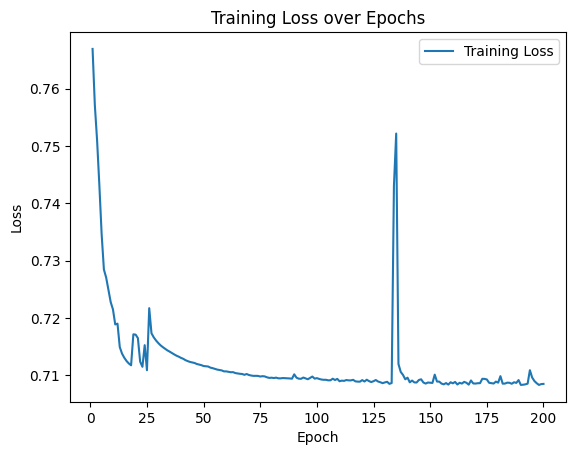

In [28]:
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=200, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in range(num_epochs):
        total_loss = 0.0
        
        # tqdmでエポック全体の進捗バーを表示（全バッチを100%とする）
        with tqdm(total=len(X_train), desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
                # バッチ化されたデータをモデルに渡して予測を取得
                inputs = inputs.unsqueeze(0)  # バッチ次元を追加
                labels = labels.view(-1)  # ラベルを1次元に変換
                
                outputs = model(inputs)
                
                # 出力とラベルの形を一致させる
                outputs = outputs.view(-1, outputs.size(-1))
                
                # 損失計算
                loss = criterion(outputs, labels)
                total_loss += loss.item()
                
                # バックプロパゲーション
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # バッチごとに進捗を更新
                pbar.update(1)

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1, 2の場合は output_size = 3 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 3  # ラベルの範囲が 0, 1, 2 ならば output_size = 3
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# データのロード（前に定義した `X_tensor` と `y_tensor` を使用）
X_train = X_tensor  # 特徴量
y_train = y_tensor  # ラベル

# モデルの学習を実行
train_model(model, X_train, y_train)

Self-supervised Epoch [1/100], Loss: 33072.0602
Self-supervised Epoch [2/100], Loss: 22758.2434
Self-supervised Epoch [3/100], Loss: 15329.1221
Self-supervised Epoch [4/100], Loss: 10015.5307
Self-supervised Epoch [5/100], Loss: 6372.3313
Self-supervised Epoch [6/100], Loss: 4034.2494
Self-supervised Epoch [7/100], Loss: 2575.4046
Self-supervised Epoch [8/100], Loss: 1567.1150
Self-supervised Epoch [9/100], Loss: 954.4345
Self-supervised Epoch [10/100], Loss: 586.0416
Self-supervised Epoch [11/100], Loss: 374.6721
Self-supervised Epoch [12/100], Loss: 256.9624
Self-supervised Epoch [13/100], Loss: 192.5556
Self-supervised Epoch [14/100], Loss: 160.3748
Self-supervised Epoch [15/100], Loss: 142.5698
Self-supervised Epoch [16/100], Loss: 130.5385
Self-supervised Epoch [17/100], Loss: 123.0022
Self-supervised Epoch [18/100], Loss: 115.9714
Self-supervised Epoch [19/100], Loss: 108.5123
Self-supervised Epoch [20/100], Loss: 102.2045
Self-supervised Epoch [21/100], Loss: 93.4349
Self-superv

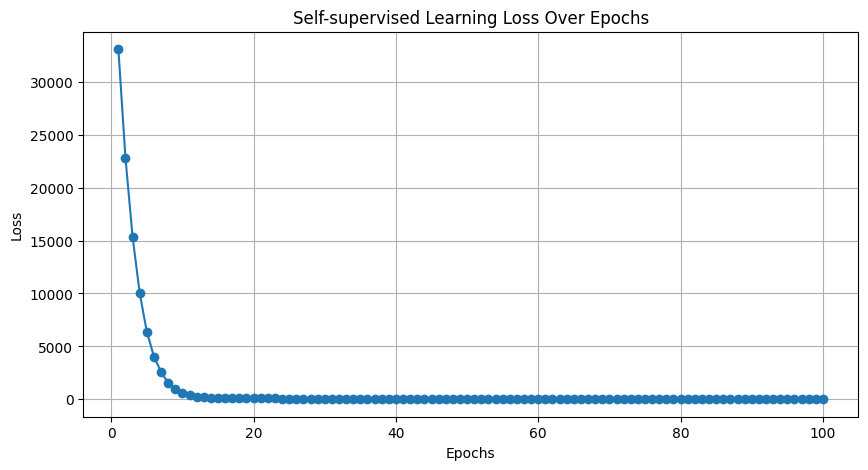

In [31]:
# 自己教師あり学習
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    
    # ラベルなしデータの準備
    X_unlabeled = X_test  # 評価用データの一部をラベルなしデータとして利用
    return X_train, y_train, X_unlabeled

# 学習データ、評価データ、ラベルなしデータに分割
X_train, y_train, X_unlabeled = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習用のモデルを定義
class SelfSupervisedModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SelfSupervisedModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)  # 入力と同じ次元に戻す

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習モデルの初期化
self_supervised_model = SelfSupervisedModel(input_size=5, hidden_size=64)  # 特徴量の数に応じて調整

# 自己教師あり学習のトレーニングループの修正
def train_self_supervised_model(model, X_unlabeled, num_epochs=100, learning_rate=0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()  # 入力を再構築するための損失関数
    loss_history = []  # 損失を記録するリストを関数内で定義

    for epoch in range(num_epochs):
        total_loss = 0  # エポックごとの累積損失
        for inputs in X_unlabeled:
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)  # モデルの出力を取得

            # 損失計算
            loss = criterion(outputs, inputs)
            total_loss += loss.item()  # 累積損失を加算
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_unlabeled)  # 平均損失を計算
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Self-supervised Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Self-supervised Learning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# 自己教師あり学習の実行
train_self_supervised_model(self_supervised_model, X_unlabeled)

Fine-tuning Epoch [1/100], Loss: 0.7700
Fine-tuning Epoch [2/100], Loss: 0.7618
Fine-tuning Epoch [3/100], Loss: 0.7542
Fine-tuning Epoch [4/100], Loss: 0.7397
Fine-tuning Epoch [5/100], Loss: 0.7295
Fine-tuning Epoch [6/100], Loss: 0.7240
Fine-tuning Epoch [7/100], Loss: 0.7205
Fine-tuning Epoch [8/100], Loss: 0.7175
Fine-tuning Epoch [9/100], Loss: 0.7131
Fine-tuning Epoch [10/100], Loss: 0.7108
Fine-tuning Epoch [11/100], Loss: 0.7093
Fine-tuning Epoch [12/100], Loss: 0.7127
Fine-tuning Epoch [13/100], Loss: 0.7105
Fine-tuning Epoch [14/100], Loss: 0.7077
Fine-tuning Epoch [15/100], Loss: 0.7074
Fine-tuning Epoch [16/100], Loss: 0.7067
Fine-tuning Epoch [17/100], Loss: 0.7061
Fine-tuning Epoch [18/100], Loss: 0.7056
Fine-tuning Epoch [19/100], Loss: 0.7051
Fine-tuning Epoch [20/100], Loss: 0.7046
Fine-tuning Epoch [21/100], Loss: 0.7049
Fine-tuning Epoch [22/100], Loss: 0.7049
Fine-tuning Epoch [23/100], Loss: 0.7040
Fine-tuning Epoch [24/100], Loss: 0.7036
Fine-tuning Epoch [25/100

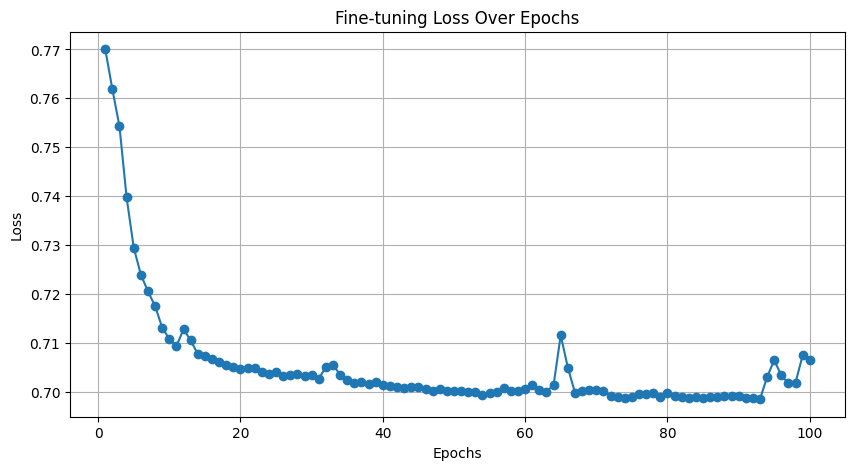

In [32]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=64, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Self-supervised Epoch [1/100], Loss: 22285.4627
Self-supervised Epoch [2/100], Loss: 5145.7398
Self-supervised Epoch [3/100], Loss: 914.4405
Self-supervised Epoch [4/100], Loss: 209.2207
Self-supervised Epoch [5/100], Loss: 133.4832
Self-supervised Epoch [6/100], Loss: 108.4166
Self-supervised Epoch [7/100], Loss: 91.8915
Self-supervised Epoch [8/100], Loss: 72.8815
Self-supervised Epoch [9/100], Loss: 59.6378
Self-supervised Epoch [10/100], Loss: 47.1834
Self-supervised Epoch [11/100], Loss: 41.2496
Self-supervised Epoch [12/100], Loss: 37.2621
Self-supervised Epoch [13/100], Loss: 32.3962
Self-supervised Epoch [14/100], Loss: 28.7368
Self-supervised Epoch [15/100], Loss: 25.1434
Self-supervised Epoch [16/100], Loss: 22.4604
Self-supervised Epoch [17/100], Loss: 20.7014
Self-supervised Epoch [18/100], Loss: 18.1338
Self-supervised Epoch [19/100], Loss: 17.1233
Self-supervised Epoch [20/100], Loss: 16.8299
Self-supervised Epoch [21/100], Loss: 15.7111
Self-supervised Epoch [22/100], Lo

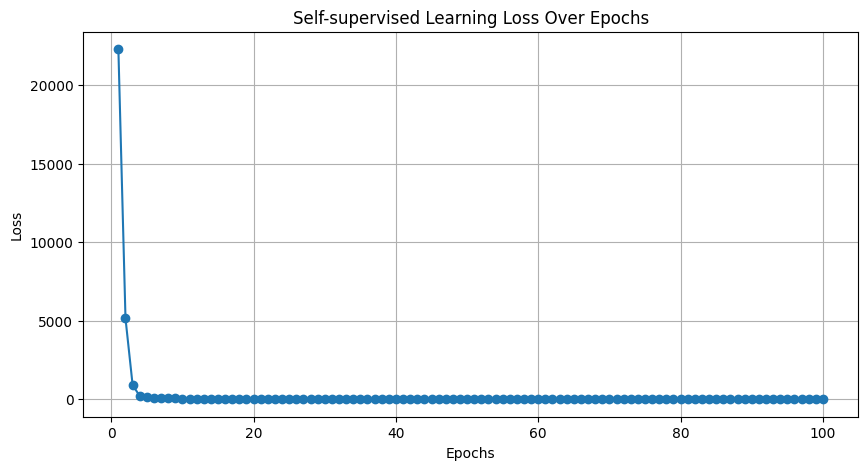

In [33]:
# 自己教師あり学習
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.8, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    
    # ラベルなしデータの準備
    X_unlabeled = X_test  # 評価用データの一部をラベルなしデータとして利用
    return X_train, y_train, X_unlabeled

# 学習データ、評価データ、ラベルなしデータに分割
X_train, y_train, X_unlabeled = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習用のモデルを定義
class SelfSupervisedModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SelfSupervisedModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)  # 入力と同じ次元に戻す

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習モデルの初期化
self_supervised_model = SelfSupervisedModel(input_size=5, hidden_size=64)  # 特徴量の数に応じて調整

# 自己教師あり学習のトレーニングループの修正
def train_self_supervised_model(model, X_unlabeled, num_epochs=100, learning_rate=0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()  # 入力を再構築するための損失関数, 平均二乗誤差
    loss_history = []  # 損失を記録するリストを関数内で定義

    for epoch in range(num_epochs):
        total_loss = 0  # エポックごとの累積損失
        for inputs in X_unlabeled:
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)  # モデルの出力を取得

            # 損失計算
            loss = criterion(outputs, inputs)
            total_loss += loss.item()  # 累積損失を加算
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_unlabeled)  # 平均損失を計算
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Self-supervised Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Self-supervised Learning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# 自己教師あり学習の実行
train_self_supervised_model(self_supervised_model, X_unlabeled)

Fine-tuning Epoch [1/100], Loss: 0.7819
Fine-tuning Epoch [2/100], Loss: 0.7726
Fine-tuning Epoch [3/100], Loss: 0.7689
Fine-tuning Epoch [4/100], Loss: 0.7675
Fine-tuning Epoch [5/100], Loss: 0.7662
Fine-tuning Epoch [6/100], Loss: 0.7649
Fine-tuning Epoch [7/100], Loss: 0.7640
Fine-tuning Epoch [8/100], Loss: 0.7617
Fine-tuning Epoch [9/100], Loss: 0.7598
Fine-tuning Epoch [10/100], Loss: 0.7573
Fine-tuning Epoch [11/100], Loss: 0.7545
Fine-tuning Epoch [12/100], Loss: 0.7510
Fine-tuning Epoch [13/100], Loss: 0.7469
Fine-tuning Epoch [14/100], Loss: 0.7428
Fine-tuning Epoch [15/100], Loss: 0.7418
Fine-tuning Epoch [16/100], Loss: 0.7385
Fine-tuning Epoch [17/100], Loss: 0.7364
Fine-tuning Epoch [18/100], Loss: 0.7354
Fine-tuning Epoch [19/100], Loss: 0.7341
Fine-tuning Epoch [20/100], Loss: 0.7329
Fine-tuning Epoch [21/100], Loss: 0.7322
Fine-tuning Epoch [22/100], Loss: 0.7314
Fine-tuning Epoch [23/100], Loss: 0.7322
Fine-tuning Epoch [24/100], Loss: 0.7321
Fine-tuning Epoch [25/100

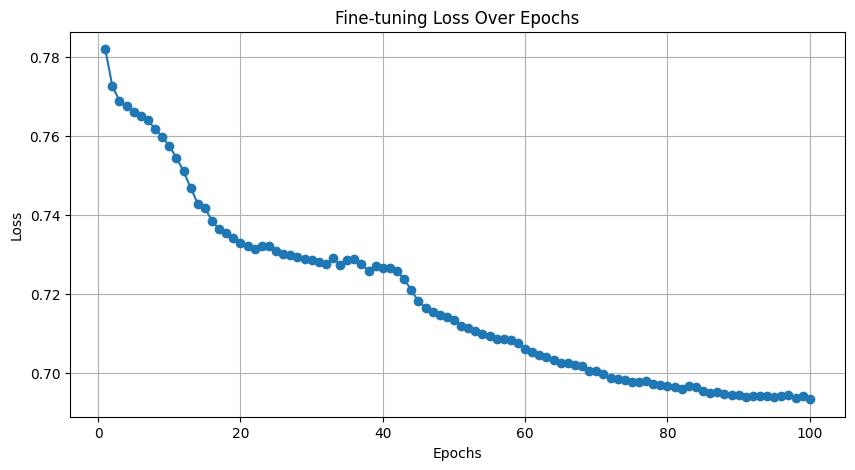

In [34]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=64, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/100], Loss: 0.8128
Fine-tuning Epoch [2/100], Loss: 0.7762
Fine-tuning Epoch [3/100], Loss: 0.7733
Fine-tuning Epoch [4/100], Loss: 0.7712
Fine-tuning Epoch [5/100], Loss: 0.7690
Fine-tuning Epoch [6/100], Loss: 0.7667
Fine-tuning Epoch [7/100], Loss: 0.7645
Fine-tuning Epoch [8/100], Loss: 0.7622
Fine-tuning Epoch [9/100], Loss: 0.7597
Fine-tuning Epoch [10/100], Loss: 0.7571
Fine-tuning Epoch [11/100], Loss: 0.7544
Fine-tuning Epoch [12/100], Loss: 0.7522
Fine-tuning Epoch [13/100], Loss: 0.7501
Fine-tuning Epoch [14/100], Loss: 0.7480
Fine-tuning Epoch [15/100], Loss: 0.7460
Fine-tuning Epoch [16/100], Loss: 0.7437
Fine-tuning Epoch [17/100], Loss: 0.7416
Fine-tuning Epoch [18/100], Loss: 0.7395
Fine-tuning Epoch [19/100], Loss: 0.7373
Fine-tuning Epoch [20/100], Loss: 0.7353
Fine-tuning Epoch [21/100], Loss: 0.7332
Fine-tuning Epoch [22/100], Loss: 0.7307
Fine-tuning Epoch [23/100], Loss: 0.7285
Fine-tuning Epoch [24/100], Loss: 0.7265
Fine-tuning Epoch [25/100

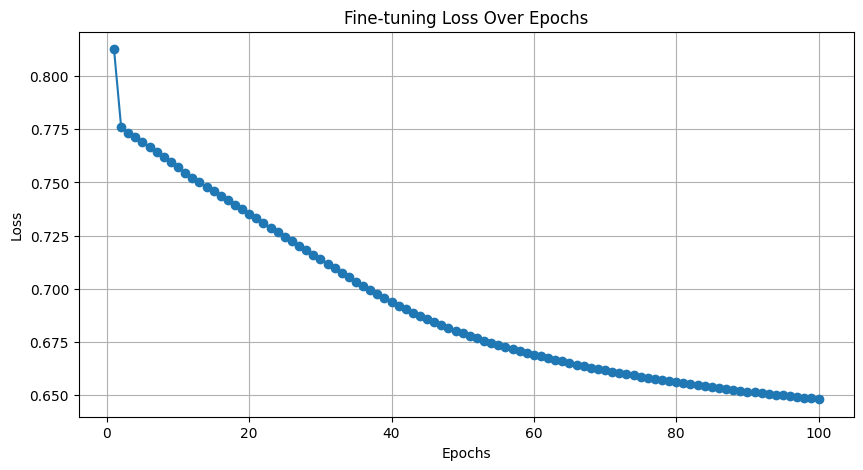

In [35]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=64, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/100], Loss: 0.7827
Fine-tuning Epoch [2/100], Loss: 0.7647
Fine-tuning Epoch [3/100], Loss: 0.7567
Fine-tuning Epoch [4/100], Loss: 0.7496
Fine-tuning Epoch [5/100], Loss: 0.7430
Fine-tuning Epoch [6/100], Loss: 0.7371
Fine-tuning Epoch [7/100], Loss: 0.7311
Fine-tuning Epoch [8/100], Loss: 0.7245
Fine-tuning Epoch [9/100], Loss: 0.7181
Fine-tuning Epoch [10/100], Loss: 0.7117
Fine-tuning Epoch [11/100], Loss: 0.7059
Fine-tuning Epoch [12/100], Loss: 0.7010
Fine-tuning Epoch [13/100], Loss: 0.6967
Fine-tuning Epoch [14/100], Loss: 0.6928
Fine-tuning Epoch [15/100], Loss: 0.6892
Fine-tuning Epoch [16/100], Loss: 0.6860
Fine-tuning Epoch [17/100], Loss: 0.6828
Fine-tuning Epoch [18/100], Loss: 0.6798
Fine-tuning Epoch [19/100], Loss: 0.6772
Fine-tuning Epoch [20/100], Loss: 0.6748
Fine-tuning Epoch [21/100], Loss: 0.6726
Fine-tuning Epoch [22/100], Loss: 0.6705
Fine-tuning Epoch [23/100], Loss: 0.6690
Fine-tuning Epoch [24/100], Loss: 0.6669
Fine-tuning Epoch [25/100

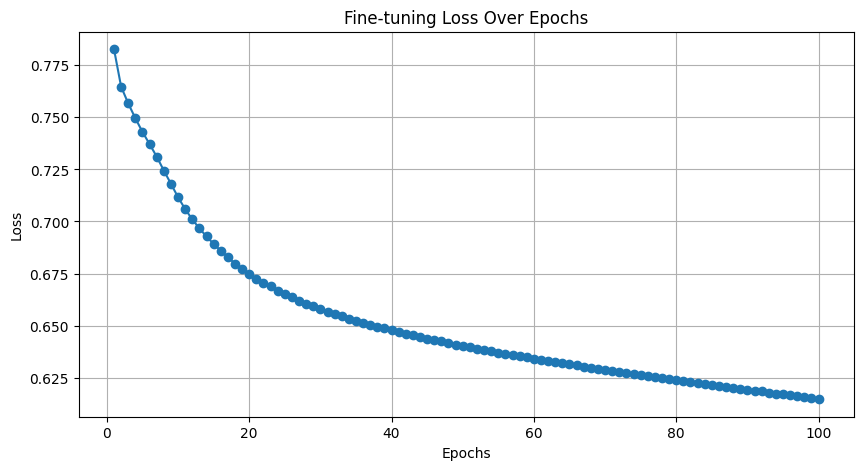

In [36]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=128, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/100], Loss: 0.7734
Fine-tuning Epoch [2/100], Loss: 0.7502
Fine-tuning Epoch [3/100], Loss: 0.7344
Fine-tuning Epoch [4/100], Loss: 0.7182
Fine-tuning Epoch [5/100], Loss: 0.7061
Fine-tuning Epoch [6/100], Loss: 0.6967
Fine-tuning Epoch [7/100], Loss: 0.6896
Fine-tuning Epoch [8/100], Loss: 0.6829
Fine-tuning Epoch [9/100], Loss: 0.6778
Fine-tuning Epoch [10/100], Loss: 0.6729
Fine-tuning Epoch [11/100], Loss: 0.6684
Fine-tuning Epoch [12/100], Loss: 0.6644
Fine-tuning Epoch [13/100], Loss: 0.6612
Fine-tuning Epoch [14/100], Loss: 0.6574
Fine-tuning Epoch [15/100], Loss: 0.6547
Fine-tuning Epoch [16/100], Loss: 0.6521
Fine-tuning Epoch [17/100], Loss: 0.6498
Fine-tuning Epoch [18/100], Loss: 0.6477
Fine-tuning Epoch [19/100], Loss: 0.6459
Fine-tuning Epoch [20/100], Loss: 0.6443
Fine-tuning Epoch [21/100], Loss: 0.6429
Fine-tuning Epoch [22/100], Loss: 0.6414
Fine-tuning Epoch [23/100], Loss: 0.6400
Fine-tuning Epoch [24/100], Loss: 0.6390
Fine-tuning Epoch [25/100

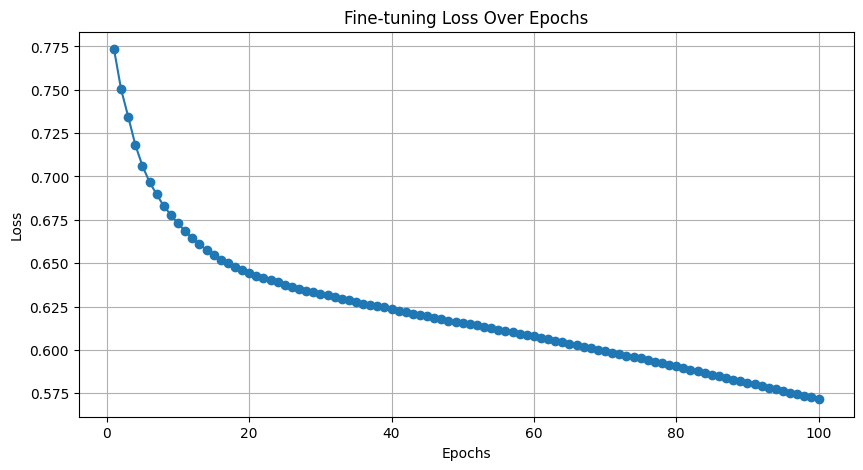

In [37]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/120], Loss: 0.7728
Fine-tuning Epoch [2/120], Loss: 0.7505
Fine-tuning Epoch [3/120], Loss: 0.7356
Fine-tuning Epoch [4/120], Loss: 0.7188
Fine-tuning Epoch [5/120], Loss: 0.7053
Fine-tuning Epoch [6/120], Loss: 0.6961
Fine-tuning Epoch [7/120], Loss: 0.6891
Fine-tuning Epoch [8/120], Loss: 0.6831
Fine-tuning Epoch [9/120], Loss: 0.6785
Fine-tuning Epoch [10/120], Loss: 0.6739
Fine-tuning Epoch [11/120], Loss: 0.6698
Fine-tuning Epoch [12/120], Loss: 0.6660
Fine-tuning Epoch [13/120], Loss: 0.6623
Fine-tuning Epoch [14/120], Loss: 0.6588
Fine-tuning Epoch [15/120], Loss: 0.6557
Fine-tuning Epoch [16/120], Loss: 0.6529
Fine-tuning Epoch [17/120], Loss: 0.6505
Fine-tuning Epoch [18/120], Loss: 0.6482
Fine-tuning Epoch [19/120], Loss: 0.6465
Fine-tuning Epoch [20/120], Loss: 0.6447
Fine-tuning Epoch [21/120], Loss: 0.6430
Fine-tuning Epoch [22/120], Loss: 0.6414
Fine-tuning Epoch [23/120], Loss: 0.6400
Fine-tuning Epoch [24/120], Loss: 0.6387
Fine-tuning Epoch [25/120

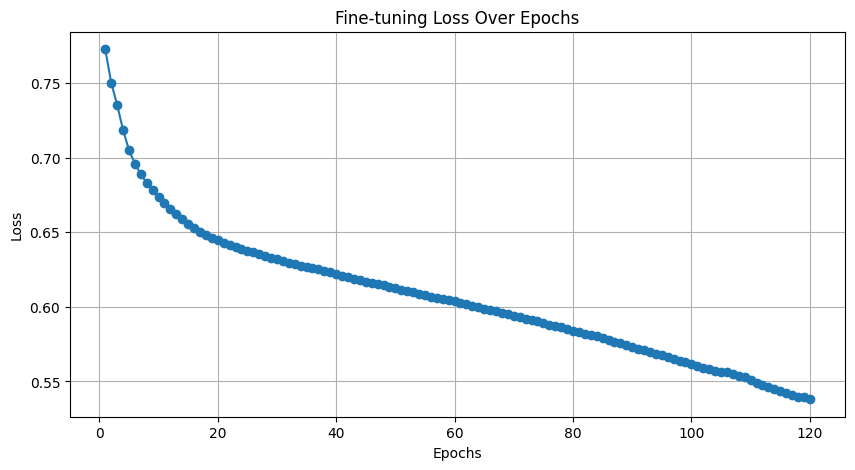

In [38]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=120, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/140], Loss: 0.7751
Fine-tuning Epoch [2/140], Loss: 0.7517
Fine-tuning Epoch [3/140], Loss: 0.7347
Fine-tuning Epoch [4/140], Loss: 0.7203
Fine-tuning Epoch [5/140], Loss: 0.7086
Fine-tuning Epoch [6/140], Loss: 0.6989
Fine-tuning Epoch [7/140], Loss: 0.6917
Fine-tuning Epoch [8/140], Loss: 0.6859
Fine-tuning Epoch [9/140], Loss: 0.6803
Fine-tuning Epoch [10/140], Loss: 0.6754
Fine-tuning Epoch [11/140], Loss: 0.6713
Fine-tuning Epoch [12/140], Loss: 0.6675
Fine-tuning Epoch [13/140], Loss: 0.6636
Fine-tuning Epoch [14/140], Loss: 0.6602
Fine-tuning Epoch [15/140], Loss: 0.6573
Fine-tuning Epoch [16/140], Loss: 0.6545
Fine-tuning Epoch [17/140], Loss: 0.6522
Fine-tuning Epoch [18/140], Loss: 0.6500
Fine-tuning Epoch [19/140], Loss: 0.6480
Fine-tuning Epoch [20/140], Loss: 0.6464
Fine-tuning Epoch [21/140], Loss: 0.6449
Fine-tuning Epoch [22/140], Loss: 0.6435
Fine-tuning Epoch [23/140], Loss: 0.6419
Fine-tuning Epoch [24/140], Loss: 0.6404
Fine-tuning Epoch [25/140

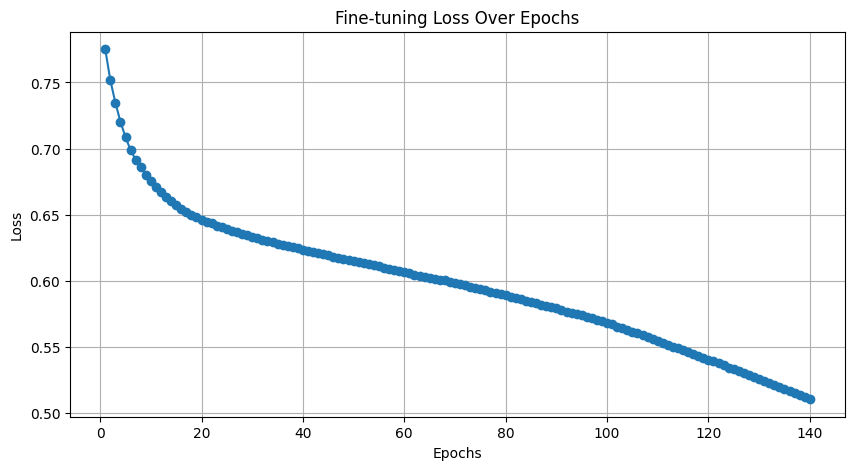

In [39]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=140, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/180], Loss: 0.7824
Fine-tuning Epoch [2/180], Loss: 0.7556
Fine-tuning Epoch [3/180], Loss: 0.7424
Fine-tuning Epoch [4/180], Loss: 0.7301
Fine-tuning Epoch [5/180], Loss: 0.7177
Fine-tuning Epoch [6/180], Loss: 0.7061
Fine-tuning Epoch [7/180], Loss: 0.6973
Fine-tuning Epoch [8/180], Loss: 0.6903
Fine-tuning Epoch [9/180], Loss: 0.6845
Fine-tuning Epoch [10/180], Loss: 0.6792
Fine-tuning Epoch [11/180], Loss: 0.6752
Fine-tuning Epoch [12/180], Loss: 0.6705
Fine-tuning Epoch [13/180], Loss: 0.6661
Fine-tuning Epoch [14/180], Loss: 0.6623
Fine-tuning Epoch [15/180], Loss: 0.6586
Fine-tuning Epoch [16/180], Loss: 0.6555
Fine-tuning Epoch [17/180], Loss: 0.6526
Fine-tuning Epoch [18/180], Loss: 0.6501
Fine-tuning Epoch [19/180], Loss: 0.6480
Fine-tuning Epoch [20/180], Loss: 0.6462
Fine-tuning Epoch [21/180], Loss: 0.6444
Fine-tuning Epoch [22/180], Loss: 0.6428
Fine-tuning Epoch [23/180], Loss: 0.6413
Fine-tuning Epoch [24/180], Loss: 0.6399
Fine-tuning Epoch [25/180

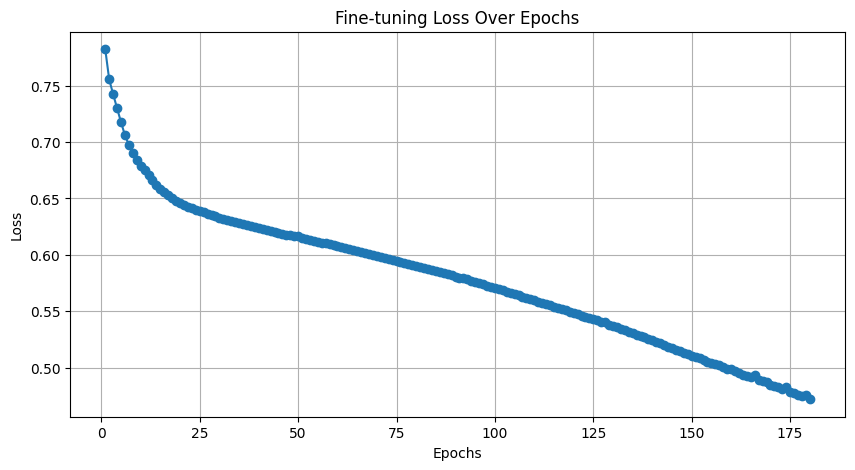

In [40]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=180, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/200], Loss: 0.7730
Fine-tuning Epoch [2/200], Loss: 0.7512
Fine-tuning Epoch [3/200], Loss: 0.7375
Fine-tuning Epoch [4/200], Loss: 0.7222
Fine-tuning Epoch [5/200], Loss: 0.7091
Fine-tuning Epoch [6/200], Loss: 0.6992
Fine-tuning Epoch [7/200], Loss: 0.6918
Fine-tuning Epoch [8/200], Loss: 0.6861
Fine-tuning Epoch [9/200], Loss: 0.6813
Fine-tuning Epoch [10/200], Loss: 0.6768
Fine-tuning Epoch [11/200], Loss: 0.6726
Fine-tuning Epoch [12/200], Loss: 0.6684
Fine-tuning Epoch [13/200], Loss: 0.6645
Fine-tuning Epoch [14/200], Loss: 0.6613
Fine-tuning Epoch [15/200], Loss: 0.6582
Fine-tuning Epoch [16/200], Loss: 0.6551
Fine-tuning Epoch [17/200], Loss: 0.6525
Fine-tuning Epoch [18/200], Loss: 0.6502
Fine-tuning Epoch [19/200], Loss: 0.6481
Fine-tuning Epoch [20/200], Loss: 0.6462
Fine-tuning Epoch [21/200], Loss: 0.6444
Fine-tuning Epoch [22/200], Loss: 0.6426
Fine-tuning Epoch [23/200], Loss: 0.6417
Fine-tuning Epoch [24/200], Loss: 0.6402
Fine-tuning Epoch [25/200

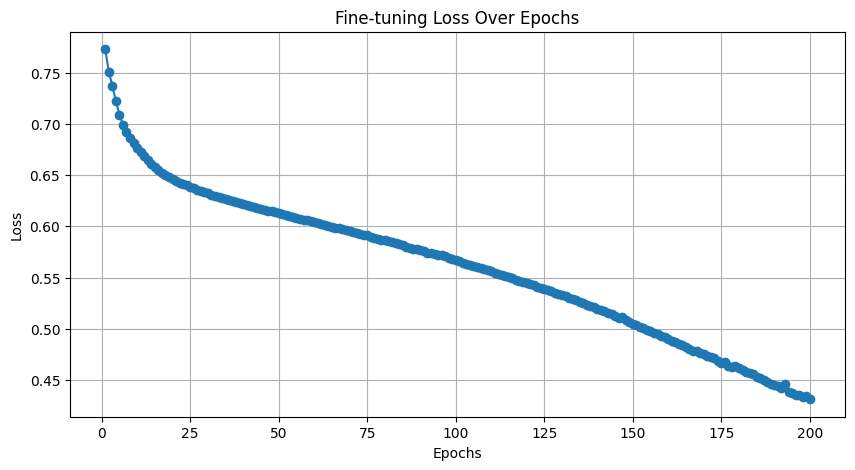

In [41]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=200, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Fine-tuning Epoch [1/300], Loss: 0.7806
Fine-tuning Epoch [2/300], Loss: 0.7533
Fine-tuning Epoch [3/300], Loss: 0.7362
Fine-tuning Epoch [4/300], Loss: 0.7204
Fine-tuning Epoch [5/300], Loss: 0.7072
Fine-tuning Epoch [6/300], Loss: 0.6971
Fine-tuning Epoch [7/300], Loss: 0.6893
Fine-tuning Epoch [8/300], Loss: 0.6830
Fine-tuning Epoch [9/300], Loss: 0.6777
Fine-tuning Epoch [10/300], Loss: 0.6727
Fine-tuning Epoch [11/300], Loss: 0.6681
Fine-tuning Epoch [12/300], Loss: 0.6639
Fine-tuning Epoch [13/300], Loss: 0.6604
Fine-tuning Epoch [14/300], Loss: 0.6574
Fine-tuning Epoch [15/300], Loss: 0.6545
Fine-tuning Epoch [16/300], Loss: 0.6518
Fine-tuning Epoch [17/300], Loss: 0.6494
Fine-tuning Epoch [18/300], Loss: 0.6473
Fine-tuning Epoch [19/300], Loss: 0.6453
Fine-tuning Epoch [20/300], Loss: 0.6435
Fine-tuning Epoch [21/300], Loss: 0.6420
Fine-tuning Epoch [22/300], Loss: 0.6405
Fine-tuning Epoch [23/300], Loss: 0.6391
Fine-tuning Epoch [24/300], Loss: 0.6377
Fine-tuning Epoch [25/300

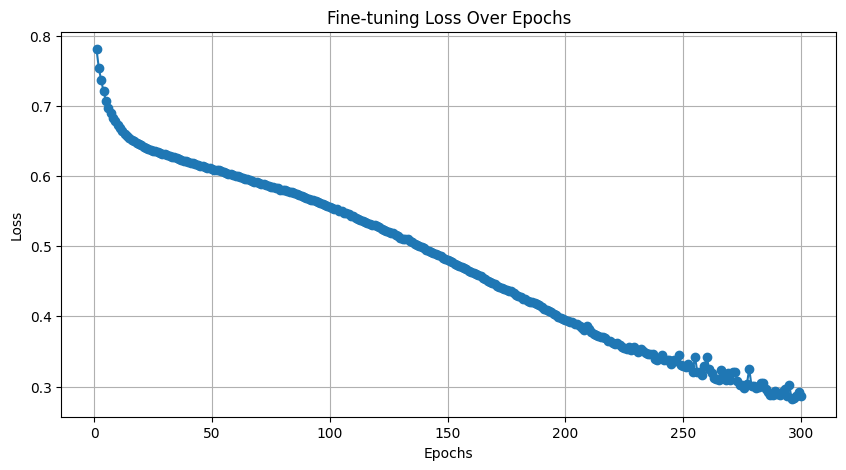

In [42]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=256, output_size=3)  # ラベルが0, 1, 2の場合は output_size = 3 とする

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=300, learning_rate=0.0001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []  # 損失を記録するリストを定義

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)  # 平均損失を記録
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 損失のプロット
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

Self-supervised Epoch [1/100], Loss: 31114.0699
Self-supervised Epoch [2/100], Loss: 17749.9728
Self-supervised Epoch [3/100], Loss: 9504.8110
Self-supervised Epoch [4/100], Loss: 4829.0244
Self-supervised Epoch [5/100], Loss: 2517.6625
Self-supervised Epoch [6/100], Loss: 1245.3858
Self-supervised Epoch [7/100], Loss: 613.7473
Self-supervised Epoch [8/100], Loss: 321.5880
Self-supervised Epoch [9/100], Loss: 200.9565
Self-supervised Epoch [10/100], Loss: 154.8859
Self-supervised Epoch [11/100], Loss: 138.5011
Self-supervised Epoch [12/100], Loss: 130.6361
Self-supervised Epoch [13/100], Loss: 121.2460
Self-supervised Epoch [14/100], Loss: 114.1311
Self-supervised Epoch [15/100], Loss: 107.4159
Self-supervised Epoch [16/100], Loss: 99.9579
Self-supervised Epoch [17/100], Loss: 90.8478
Self-supervised Epoch [18/100], Loss: 79.9780
Self-supervised Epoch [19/100], Loss: 74.0641
Self-supervised Epoch [20/100], Loss: 67.5255
Self-supervised Epoch [21/100], Loss: 63.3139
Self-supervised Epoc

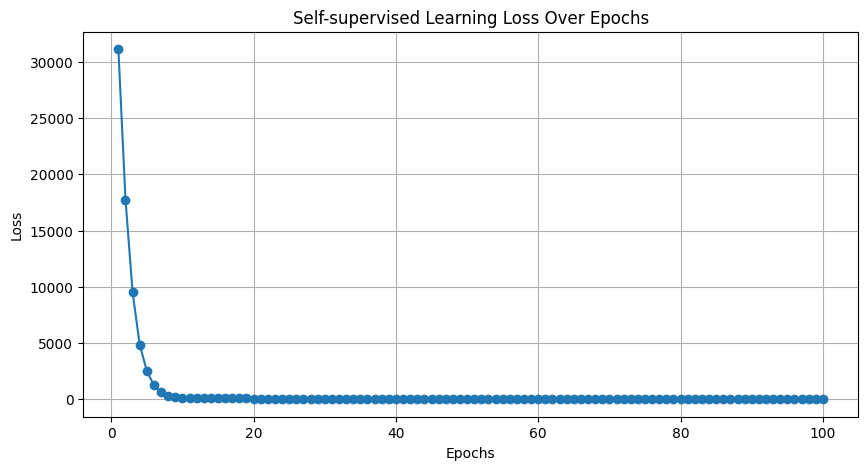

In [43]:
# 自己学習用；3000個、ファインチューニング用；1000個、評価用；1000個
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用、評価用、ラベルなし用に分ける関数
def split_data(X_list, y_list, test_size=0.4, random_state=42):
    X_temp, X_test, y_temp, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    X_train, X_unlabeled, y_train, _ = train_test_split(X_temp, y_temp, test_size=0.5, random_state=random_state)
    return X_train, y_train, X_test, y_test, X_unlabeled

# 学習データ、評価データ、ラベルなしデータに分割
X_train, y_train, X_test, y_test, X_unlabeled = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習用のモデルを定義
class SelfSupervisedModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SelfSupervisedModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習モデルの初期化
self_supervised_model = SelfSupervisedModel(input_size=5, hidden_size=64)

# 自己教師あり学習のトレーニングループ
def train_self_supervised_model(model, X_unlabeled, num_epochs=100, learning_rate=0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0
        for inputs in X_unlabeled:
            inputs = inputs.unsqueeze(0)
            outputs = model(inputs)

            loss = criterion(outputs, inputs)
            total_loss += loss.item()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_unlabeled)
        loss_history.append(avg_loss)
        print(f"Self-supervised Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Self-supervised Learning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# 自己教師あり学習の実行
train_self_supervised_model(self_supervised_model, X_unlabeled)

Fine-tuning Epoch [1/100], Loss: 0.7752
Fine-tuning Epoch [2/100], Loss: 0.7686
Fine-tuning Epoch [3/100], Loss: 0.7664
Fine-tuning Epoch [4/100], Loss: 0.7644
Fine-tuning Epoch [5/100], Loss: 0.7628
Fine-tuning Epoch [6/100], Loss: 0.7626
Fine-tuning Epoch [7/100], Loss: 0.7593
Fine-tuning Epoch [8/100], Loss: 0.7579
Fine-tuning Epoch [9/100], Loss: 0.7574
Fine-tuning Epoch [10/100], Loss: 0.7560
Fine-tuning Epoch [11/100], Loss: 0.7505
Fine-tuning Epoch [12/100], Loss: 0.7461
Fine-tuning Epoch [13/100], Loss: 0.7429
Fine-tuning Epoch [14/100], Loss: 0.7404
Fine-tuning Epoch [15/100], Loss: 0.7374
Fine-tuning Epoch [16/100], Loss: 0.7351
Fine-tuning Epoch [17/100], Loss: 0.7328
Fine-tuning Epoch [18/100], Loss: 0.7314
Fine-tuning Epoch [19/100], Loss: 0.7299
Fine-tuning Epoch [20/100], Loss: 0.7286
Fine-tuning Epoch [21/100], Loss: 0.7271
Fine-tuning Epoch [22/100], Loss: 0.7260
Fine-tuning Epoch [23/100], Loss: 0.7247
Fine-tuning Epoch [24/100], Loss: 0.7238
Fine-tuning Epoch [25/100

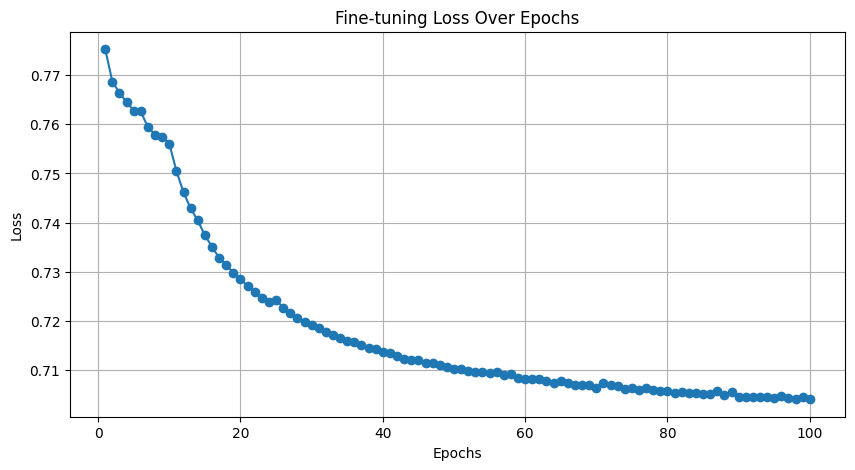

In [44]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=56, output_size=3)

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)
            labels = labels.view(-1)
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            loss = criterion(outputs, labels)
            total_loss += loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

In [55]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# 評価関数の定義
def evaluate_model(model, X_test, y_test):
    model.eval()  # 評価モードに切り替え
    predictions = []

    with torch.no_grad():  # 勾配計算を無効に
        for inputs in X_test:
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 2)  # 最も高いスコアを持つクラスを選択
            predictions.append(predicted.view(-1))

    # すべての予測を連結
    predicted_tensor = torch.cat(predictions)
    
    # y_testを連結
    y_test_tensor = torch.cat(y_test)
    
    # 正解率を計算
    accuracy = accuracy_score(y_test_tensor.numpy(), predicted_tensor.numpy())
    return accuracy, y_test_tensor, predicted_tensor

# 評価の実行
accuracy, y_test_tensor, predicted_tensor = evaluate_model(model, X_test, y_test)

# 一致率を出力
print(f'Accuracy on the test set: {accuracy:.4f}')


Accuracy on the test set: 0.7479


In [51]:
# 予測結果の保存
import os
import pandas as pd

# 保存するフォルダの作成
output_dir = 'predicted_accents'
os.makedirs(output_dir, exist_ok=True)

# 評価関数の修正: 予測結果をCSVファイルに保存
def save_predictions_to_csv(model, X_test, y_test, output_dir):
    model.eval()  # 評価モードに切り替え

    with torch.no_grad():  # 勾配計算を無効に
        for i, inputs in enumerate(X_test):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 2)  # 最も高いスコアを持つクラスを選択
            
            # 予測結果をTensorからNumPy配列に変換
            predicted_np = predicted.view(-1).numpy()
            
            # CSVファイルに保存
            file_name = os.path.join(output_dir, f'predicted_accent_{i+1}.csv')
            pd.DataFrame(predicted_np, columns=['Predicted Accent']).to_csv(file_name, index=False)

# 予測結果を保存
save_predictions_to_csv(model, X_test, y_test, output_dir)

print(f"Predicted accents saved in the '{output_dir}' directory.")

Predicted accents saved in the 'predicted_accents' directory.


In [52]:
import os
import pandas as pd
import torch

# フォルダのパスを指定
predicted_dir = 'predicted_accents'

# y_testをリストに変換する関数
def load_y_test_tensor(y_test):
    # ここでは、y_testがTensorのリストであると仮定します
    return [tensor.numpy() for tensor in y_test]  # TensorをNumPy配列に変換してリストに追加

# y_testをリスト形式でロード
y_test_list = load_y_test_tensor(y_test)

# 一致数をカウントするための変数を初期化
total_matches = 0
total_samples = 0

# 予測結果をロードして一致をカウント
for i in range(1, 1001):  # predicted_accent_1.csv から predicted_accent_1000.csv まで
    file_name = os.path.join(predicted_dir, f'predicted_accent_{i}.csv')
    
    if os.path.exists(file_name):
        # CSVファイルを読み込む
        predicted_df = pd.read_csv(file_name)
        predicted_array = predicted_df['Predicted Accent'].to_numpy()

        # 一致数をカウント
        if i <= len(y_test_list):  # y_testの範囲内であるか確認
            total_matches += (predicted_array == y_test_list[i - 1]).sum()
            total_samples += len(predicted_array)

# 一致率を計算
if total_samples > 0:
    accuracy = total_matches / total_samples
    print(f'一致数: {total_matches} / 総サンプル数: {total_samples} / 一致率: {accuracy:.4f}')
else:
    print('サンプルが存在しません。')


一致数: 26325 / 総サンプル数: 35251 / 一致率: 0.7468


In [53]:
import os
import pandas as pd
import torch

# フォルダのパスを指定
predicted_dir = 'predicted_accents'

# y_testをリストに変換する関数
def load_y_test_tensor(y_test):
    return [tensor.numpy() for tensor in y_test]  # TensorをNumPy配列に変換してリストに追加

# y_testをリスト形式でロード
y_test_list = load_y_test_tensor(y_test)

# 一致数をカウントするための変数を初期化
total_matches = 0
total_samples = 0
match_class_1 = 0
match_class_2 = 0

# 予測結果をロードして一致をカウント
for i in range(1, 1001):  # predicted_accent_1.csv から predicted_accent_1000.csv まで
    file_name = os.path.join(predicted_dir, f'predicted_accent_{i}.csv')
    
    if os.path.exists(file_name):
        # CSVファイルを読み込む
        predicted_df = pd.read_csv(file_name)
        predicted_array = predicted_df['Predicted Accent'].to_numpy()

        # 一致数をカウント
        if i <= len(y_test_list):  # y_testの範囲内であるか確認
            total_matches += (predicted_array == y_test_list[i - 1]).sum()
            total_samples += len(predicted_array)

            # クラス1の一致数
            match_class_1 += ((predicted_array == 1) & (y_test_list[i - 1] == 1)).sum()

            # クラス2の一致数
            match_class_2 += ((predicted_array == 2) & (y_test_list[i - 1] == 2)).sum()

# 一致率を計算
if total_samples > 0:
    accuracy = total_matches / total_samples
    print(f'総一致数: {total_matches} / クラス1の一致数: {match_class_1} / クラス2の一致数: {match_class_2} / 総サンプル数: {total_samples} / 一致率: {accuracy:.4f}')
else:
    print('サンプルが存在しません。')


総一致数: 26325 / クラス1の一致数: 7 / クラス2の一致数: 1065 / 総サンプル数: 35251 / 一致率: 0.7468


In [54]:
import os
import pandas as pd
import torch

# フォルダのパスを指定
predicted_dir = 'predicted_accents'

# y_testをリストに変換する関数
def load_y_test_tensor(y_test):
    return [tensor.numpy() for tensor in y_test]  # TensorをNumPy配列に変換してリストに追加

# y_testをリスト形式でロード
y_test_list = load_y_test_tensor(y_test)

# 一致数をカウントするための変数を初期化
total_matches = 0
total_samples = 0
match_class_0 = 0
match_class_1 = 0
match_class_2 = 0

# 各クラスの総数をカウントするための変数を初期化
total_class_0 = 0
total_class_1 = 0
total_class_2 = 0

# 予測結果をロードして一致をカウント
for i in range(1, 1001):  # predicted_accent_1.csv から predicted_accent_1000.csv まで
    file_name = os.path.join(predicted_dir, f'predicted_accent_{i}.csv')
    
    if os.path.exists(file_name):
        # CSVファイルを読み込む
        predicted_df = pd.read_csv(file_name)
        predicted_array = predicted_df['Predicted Accent'].to_numpy()

        # 一致数をカウント
        if i <= len(y_test_list):  # y_testの範囲内であるか確認
            total_matches += (predicted_array == y_test_list[i - 1]).sum()
            total_samples += len(predicted_array)

            # 各クラスの一致数と総数をカウント
            match_class_0 += ((predicted_array == 0) & (y_test_list[i - 1] == 0)).sum()
            match_class_1 += ((predicted_array == 1) & (y_test_list[i - 1] == 1)).sum()
            match_class_2 += ((predicted_array == 2) & (y_test_list[i - 1] == 2)).sum()

            total_class_0 += (y_test_list[i - 1] == 0).sum()
            total_class_1 += (y_test_list[i - 1] == 1).sum()
            total_class_2 += (y_test_list[i - 1] == 2).sum()

# 各クラスの一致率を計算
accuracy_class_0 = match_class_0 / total_class_0 if total_class_0 > 0 else 0
accuracy_class_1 = match_class_1 / total_class_1 if total_class_1 > 0 else 0
accuracy_class_2 = match_class_2 / total_class_2 if total_class_2 > 0 else 0

# 結果を出力
print(f'クラス0の一致数: {match_class_0} / クラス0の総数: {total_class_0} / 一致率: {match_class_0}/{total_class_0} = {accuracy_class_0:.4f}')
print(f'クラス1の一致数: {match_class_1} / クラス1の総数: {total_class_1} / 一致率: {match_class_1}/{total_class_1} = {accuracy_class_1:.4f}')
print(f'クラス2の一致数: {match_class_2} / クラス2の総数: {total_class_2} / 一致率: {match_class_2}/{total_class_2} = {accuracy_class_2:.4f}')


クラス0の一致数: 25253 / クラス0の総数: 25634 / 一致率: 25253/25634 = 0.9851
クラス1の一致数: 7 / クラス1の総数: 4564 / 一致率: 7/4564 = 0.0015
クラス2の一致数: 1065 / クラス2の総数: 5053 / 一致率: 1065/5053 = 0.2108


In [25]:
# !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
# アクセントを高低(1, 0)の2値に変更
# 入力；re_f0_stac_result_5000
# 出力；re_prepared_features_dataとして保存
# 特徴量とアクセントの統合データを特徴量だけとアクセントだけのファイルに分けた！
import pandas as pd
import numpy as np
import glob
import os
import torch

# データのロードと整形を行う関数
def load_and_preprocess_data(folder_path):
    # 指定したフォルダー内のCSVファイルを全て取得
    csv_files = [f"{folder_path}/re_f0_statistics_{i}.csv" for i in range(1, 5001)]
    
    audio_data = {}

    # 各CSVファイルを読み込み
    for file in csv_files:
        # CSVファイルをDataFrameとして読み込み
        df = pd.read_csv(file)
        
        # 特徴量とラベルを抽出
        data = df[['Mean', 'Max', 'Min', 'Std', 'Median', 'Accent']].values
        
        # ファイル名から音声IDを取得
        audio_id = os.path.basename(file).split('.')[0]  # 例: 'f0_statistics_1'

        # 音声IDをキーとしてデータを辞書に格納
        audio_data[audio_id] = data

    return audio_data

# データのロード
audio_data = load_and_preprocess_data('re_f0_stac_result_5000')

# 特徴量とラベルに分け、PyTorchのテンソルに変換する関数
def prepare_data(audio_data):
    X_list = []
    y_list = []
    
    for audio_id, data in audio_data.items():
        # 特徴量とラベルを分ける
        X = data[:, :-1]  # 特徴量（Mean, Max, Min, Std, Median）
        y = data[:, -1]   # ラベル（Accent）

        # 各音声データの特徴量とラベルをリストに追加
        X_list.append(X)
        y_list.append(y)

    # リストをPyTorchのテンソルに変換
    X_tensor = [torch.tensor(X, dtype=torch.float32) for X in X_list]
    y_tensor = [torch.tensor(y, dtype=torch.long) for y in y_list]

    return X_tensor, y_tensor

# 特徴量とラベルを準備する
X_tensor, y_tensor = prepare_data(audio_data)

# データの確認
for i in range(len(X_tensor)):
    print(f"Audio ID: {i + 1}, Feature shape: {X_tensor[i].shape}, Label shape: {y_tensor[i].shape}")

# データを保存する（必要に応じて）
def save_data(X_tensor, y_tensor, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    for i, (X, y) in enumerate(zip(X_tensor, y_tensor)):
        # 特徴量とラベルをCSVファイルとして保存
        df_X = pd.DataFrame(X.numpy(), columns=['Mean', 'Max', 'Min', 'Std', 'Median'])
        df_y = pd.DataFrame(y.numpy(), columns=['Accent'])
        
        df_X.to_csv(os.path.join(output_folder, f"re_features_audio_{i + 1}.csv"), index=False)
        df_y.to_csv(os.path.join(output_folder, f"re_labels_audio_{i + 1}.csv"), index=False)

# 特徴量とラベルを保存（必要に応じて）
save_data(X_tensor, y_tensor, 're_prepared_features_data')

print("データの準備と保存が完了しました。")

Audio ID: 1, Feature shape: torch.Size([23, 5]), Label shape: torch.Size([23])
Audio ID: 2, Feature shape: torch.Size([36, 5]), Label shape: torch.Size([36])
Audio ID: 3, Feature shape: torch.Size([28, 5]), Label shape: torch.Size([28])
Audio ID: 4, Feature shape: torch.Size([23, 5]), Label shape: torch.Size([23])
Audio ID: 5, Feature shape: torch.Size([27, 5]), Label shape: torch.Size([27])
Audio ID: 6, Feature shape: torch.Size([21, 5]), Label shape: torch.Size([21])
Audio ID: 7, Feature shape: torch.Size([17, 5]), Label shape: torch.Size([17])
Audio ID: 8, Feature shape: torch.Size([27, 5]), Label shape: torch.Size([27])
Audio ID: 9, Feature shape: torch.Size([20, 5]), Label shape: torch.Size([20])
Audio ID: 10, Feature shape: torch.Size([31, 5]), Label shape: torch.Size([31])
Audio ID: 11, Feature shape: torch.Size([25, 5]), Label shape: torch.Size([25])
Audio ID: 12, Feature shape: torch.Size([24, 5]), Label shape: torch.Size([24])
Audio ID: 13, Feature shape: torch.Size([30, 5]),

Training Progress:   5%|▌         | 1/20 [00:05<01:35,  5.01s/it]

Epoch [1/20], Loss: 0.6826


Training Progress:  10%|█         | 2/20 [00:10<01:39,  5.52s/it]

Epoch [2/20], Loss: 0.6742


Training Progress:  15%|█▌        | 3/20 [00:16<01:32,  5.45s/it]

Epoch [3/20], Loss: 0.6692


Training Progress:  20%|██        | 4/20 [00:21<01:26,  5.43s/it]

Epoch [4/20], Loss: 0.6650


Training Progress:  25%|██▌       | 5/20 [00:27<01:21,  5.44s/it]

Epoch [5/20], Loss: 0.6614


Training Progress:  30%|███       | 6/20 [00:32<01:16,  5.48s/it]

Epoch [6/20], Loss: 0.6585


Training Progress:  35%|███▌      | 7/20 [00:38<01:12,  5.58s/it]

Epoch [7/20], Loss: 0.6565


Training Progress:  40%|████      | 8/20 [00:44<01:07,  5.59s/it]

Epoch [8/20], Loss: 0.6546


Training Progress:  45%|████▌     | 9/20 [00:49<01:01,  5.61s/it]

Epoch [9/20], Loss: 0.6528


Training Progress:  50%|█████     | 10/20 [00:55<00:57,  5.73s/it]

Epoch [10/20], Loss: 0.6507


Training Progress:  55%|█████▌    | 11/20 [01:01<00:51,  5.71s/it]

Epoch [11/20], Loss: 0.6488


Training Progress:  60%|██████    | 12/20 [01:07<00:45,  5.70s/it]

Epoch [12/20], Loss: 0.6463


Training Progress:  65%|██████▌   | 13/20 [01:12<00:39,  5.69s/it]

Epoch [13/20], Loss: 0.6476


Training Progress:  70%|███████   | 14/20 [01:18<00:34,  5.74s/it]

Epoch [14/20], Loss: 0.6493


Training Progress:  75%|███████▌  | 15/20 [01:24<00:29,  5.91s/it]

Epoch [15/20], Loss: 0.6478


Training Progress:  80%|████████  | 16/20 [01:31<00:24,  6.07s/it]

Epoch [16/20], Loss: 0.6477


Training Progress:  85%|████████▌ | 17/20 [01:37<00:18,  6.23s/it]

Epoch [17/20], Loss: 0.6470


Training Progress:  90%|█████████ | 18/20 [01:44<00:12,  6.29s/it]

Epoch [18/20], Loss: 0.6468


Training Progress:  95%|█████████▌| 19/20 [01:50<00:06,  6.27s/it]

Epoch [19/20], Loss: 0.6459


Training Progress: 100%|██████████| 20/20 [01:56<00:00,  5.81s/it]

Epoch [20/20], Loss: 0.6459


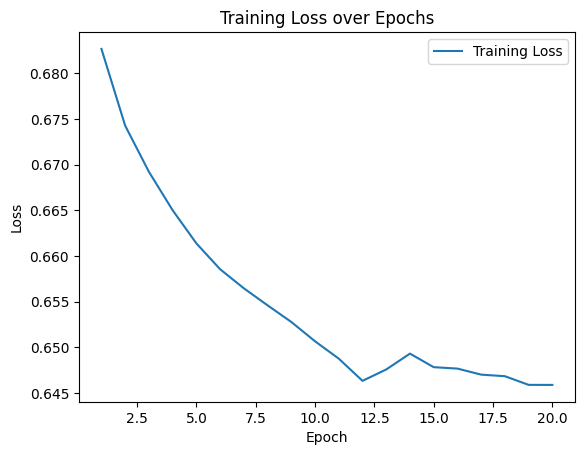

In [26]:
# 高低（2→1, 1→0）に変換
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"re_features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"re_labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 're_prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=20, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in tqdm(range(num_epochs), desc="Training Progress"):  # tqdmで進捗を表示
        total_loss = 0.0
        for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
            # バッチ化されたデータをモデルに渡して予測を取得
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            labels = labels.view(-1)  # ラベルを1次元に変換
            
            outputs = model(inputs)
            
            # 出力とラベルの形を一致させる
            outputs = outputs.view(-1, outputs.size(-1))
            
            # 損失計算
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            
            # バックプロパゲーション
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1の場合は output_size = 2 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 2  # ラベルの範囲が 0, 1 ならば output_size = 2
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# モデルの学習を実行
train_model(model, X_train, y_train)

Epoch 1/100: 100%|██████████| 4000/4000 [00:05<00:00, 775.34batch/s]


Epoch [1/100], Loss: 0.6855


Epoch 2/100: 100%|██████████| 4000/4000 [00:05<00:00, 768.51batch/s]


Epoch [2/100], Loss: 0.6827


Epoch 3/100: 100%|██████████| 4000/4000 [00:05<00:00, 669.70batch/s]


Epoch [3/100], Loss: 0.6808


Epoch 4/100: 100%|██████████| 4000/4000 [00:05<00:00, 688.11batch/s]


Epoch [4/100], Loss: 0.6793


Epoch 5/100: 100%|██████████| 4000/4000 [00:05<00:00, 727.74batch/s]


Epoch [5/100], Loss: 0.6774


Epoch 6/100: 100%|██████████| 4000/4000 [00:05<00:00, 734.66batch/s]


Epoch [6/100], Loss: 0.6755


Epoch 7/100: 100%|██████████| 4000/4000 [00:05<00:00, 727.46batch/s]


Epoch [7/100], Loss: 0.6730


Epoch 8/100: 100%|██████████| 4000/4000 [00:05<00:00, 707.01batch/s]


Epoch [8/100], Loss: 0.6717


Epoch 9/100: 100%|██████████| 4000/4000 [00:05<00:00, 713.77batch/s]


Epoch [9/100], Loss: 0.6704


Epoch 10/100: 100%|██████████| 4000/4000 [00:05<00:00, 670.74batch/s]


Epoch [10/100], Loss: 0.6695


Epoch 11/100: 100%|██████████| 4000/4000 [00:05<00:00, 694.18batch/s]


Epoch [11/100], Loss: 0.6687


Epoch 12/100: 100%|██████████| 4000/4000 [00:05<00:00, 720.71batch/s]


Epoch [12/100], Loss: 0.6679


Epoch 13/100: 100%|██████████| 4000/4000 [00:05<00:00, 694.20batch/s]


Epoch [13/100], Loss: 0.6672


Epoch 14/100: 100%|██████████| 4000/4000 [00:06<00:00, 659.09batch/s]


Epoch [14/100], Loss: 0.6667


Epoch 15/100: 100%|██████████| 4000/4000 [00:05<00:00, 673.68batch/s]


Epoch [15/100], Loss: 0.6663


Epoch 16/100: 100%|██████████| 4000/4000 [00:06<00:00, 643.65batch/s]


Epoch [16/100], Loss: 0.6656


Epoch 17/100: 100%|██████████| 4000/4000 [00:05<00:00, 703.85batch/s]


Epoch [17/100], Loss: 0.6647


Epoch 18/100: 100%|██████████| 4000/4000 [00:05<00:00, 698.63batch/s]


Epoch [18/100], Loss: 0.6640


Epoch 19/100: 100%|██████████| 4000/4000 [00:06<00:00, 654.81batch/s]


Epoch [19/100], Loss: 0.6631


Epoch 20/100: 100%|██████████| 4000/4000 [00:06<00:00, 658.07batch/s]


Epoch [20/100], Loss: 0.6625


Epoch 21/100: 100%|██████████| 4000/4000 [00:06<00:00, 662.57batch/s]


Epoch [21/100], Loss: 0.6623


Epoch 22/100: 100%|██████████| 4000/4000 [00:05<00:00, 681.42batch/s]


Epoch [22/100], Loss: 0.6621


Epoch 23/100: 100%|██████████| 4000/4000 [00:06<00:00, 664.99batch/s]


Epoch [23/100], Loss: 0.6624


Epoch 24/100: 100%|██████████| 4000/4000 [00:05<00:00, 677.78batch/s]


Epoch [24/100], Loss: 0.6619


Epoch 25/100: 100%|██████████| 4000/4000 [00:06<00:00, 660.56batch/s]


Epoch [25/100], Loss: 0.6613


Epoch 26/100: 100%|██████████| 4000/4000 [00:05<00:00, 687.14batch/s]


Epoch [26/100], Loss: 0.6609


Epoch 27/100: 100%|██████████| 4000/4000 [00:05<00:00, 669.83batch/s]


Epoch [27/100], Loss: 0.6606


Epoch 28/100: 100%|██████████| 4000/4000 [00:05<00:00, 687.44batch/s]


Epoch [28/100], Loss: 0.6603


Epoch 29/100: 100%|██████████| 4000/4000 [00:05<00:00, 688.18batch/s]


Epoch [29/100], Loss: 0.6602


Epoch 30/100: 100%|██████████| 4000/4000 [00:05<00:00, 667.01batch/s]


Epoch [30/100], Loss: 0.6602


Epoch 31/100: 100%|██████████| 4000/4000 [00:06<00:00, 632.22batch/s]


Epoch [31/100], Loss: 0.6600


Epoch 32/100: 100%|██████████| 4000/4000 [00:06<00:00, 650.84batch/s]


Epoch [32/100], Loss: 0.6599


Epoch 33/100: 100%|██████████| 4000/4000 [00:06<00:00, 593.93batch/s]


Epoch [33/100], Loss: 0.6598


Epoch 34/100: 100%|██████████| 4000/4000 [00:06<00:00, 590.64batch/s]


Epoch [34/100], Loss: 0.6597


Epoch 35/100: 100%|██████████| 4000/4000 [00:06<00:00, 647.91batch/s]


Epoch [35/100], Loss: 0.6596


Epoch 36/100: 100%|██████████| 4000/4000 [00:06<00:00, 656.18batch/s]


Epoch [36/100], Loss: 0.6595


Epoch 37/100: 100%|██████████| 4000/4000 [00:06<00:00, 627.53batch/s]


Epoch [37/100], Loss: 0.6594


Epoch 38/100: 100%|██████████| 4000/4000 [00:06<00:00, 595.63batch/s]


Epoch [38/100], Loss: 0.6594


Epoch 39/100: 100%|██████████| 4000/4000 [00:06<00:00, 650.75batch/s]


Epoch [39/100], Loss: 0.6593


Epoch 40/100: 100%|██████████| 4000/4000 [00:06<00:00, 662.87batch/s]


Epoch [40/100], Loss: 0.6593


Epoch 41/100: 100%|██████████| 4000/4000 [00:06<00:00, 649.76batch/s]


Epoch [41/100], Loss: 0.6592


Epoch 42/100: 100%|██████████| 4000/4000 [00:06<00:00, 607.13batch/s]


Epoch [42/100], Loss: 0.6592


Epoch 43/100: 100%|██████████| 4000/4000 [00:06<00:00, 658.37batch/s]


Epoch [43/100], Loss: 0.6591


Epoch 44/100: 100%|██████████| 4000/4000 [00:06<00:00, 658.45batch/s]


Epoch [44/100], Loss: 0.6590


Epoch 45/100: 100%|██████████| 4000/4000 [00:06<00:00, 657.86batch/s]


Epoch [45/100], Loss: 0.6590


Epoch 46/100: 100%|██████████| 4000/4000 [00:06<00:00, 612.16batch/s]


Epoch [46/100], Loss: 0.6590


Epoch 47/100: 100%|██████████| 4000/4000 [00:06<00:00, 659.74batch/s]


Epoch [47/100], Loss: 0.6589


Epoch 48/100: 100%|██████████| 4000/4000 [00:06<00:00, 659.05batch/s]


Epoch [48/100], Loss: 0.6589


Epoch 49/100: 100%|██████████| 4000/4000 [00:06<00:00, 658.00batch/s]


Epoch [49/100], Loss: 0.6589


Epoch 50/100: 100%|██████████| 4000/4000 [00:06<00:00, 656.44batch/s]


Epoch [50/100], Loss: 0.6588


Epoch 51/100: 100%|██████████| 4000/4000 [00:07<00:00, 551.94batch/s]


Epoch [51/100], Loss: 0.6588


Epoch 52/100: 100%|██████████| 4000/4000 [00:06<00:00, 618.78batch/s]


Epoch [52/100], Loss: 0.6588


Epoch 53/100: 100%|██████████| 4000/4000 [00:06<00:00, 591.01batch/s]


Epoch [53/100], Loss: 0.6587


Epoch 54/100: 100%|██████████| 4000/4000 [00:06<00:00, 587.82batch/s]


Epoch [54/100], Loss: 0.6587


Epoch 55/100: 100%|██████████| 4000/4000 [00:06<00:00, 643.97batch/s]


Epoch [55/100], Loss: 0.6587


Epoch 56/100: 100%|██████████| 4000/4000 [00:06<00:00, 644.65batch/s]


Epoch [56/100], Loss: 0.6586


Epoch 57/100: 100%|██████████| 4000/4000 [00:06<00:00, 617.79batch/s]


Epoch [57/100], Loss: 0.6586


Epoch 58/100: 100%|██████████| 4000/4000 [00:06<00:00, 632.67batch/s]


Epoch [58/100], Loss: 0.6586


Epoch 59/100: 100%|██████████| 4000/4000 [00:06<00:00, 649.54batch/s]


Epoch [59/100], Loss: 0.6586


Epoch 60/100: 100%|██████████| 4000/4000 [00:06<00:00, 655.78batch/s]


Epoch [60/100], Loss: 0.6595


Epoch 61/100: 100%|██████████| 4000/4000 [00:06<00:00, 632.43batch/s]


Epoch [61/100], Loss: 0.6588


Epoch 62/100: 100%|██████████| 4000/4000 [00:06<00:00, 600.02batch/s]


Epoch [62/100], Loss: 0.6587


Epoch 63/100: 100%|██████████| 4000/4000 [00:06<00:00, 654.32batch/s]


Epoch [63/100], Loss: 0.6587


Epoch 64/100: 100%|██████████| 4000/4000 [00:06<00:00, 613.60batch/s]


Epoch [64/100], Loss: 0.6586


Epoch 65/100: 100%|██████████| 4000/4000 [00:06<00:00, 621.48batch/s]


Epoch [65/100], Loss: 0.6586


Epoch 66/100: 100%|██████████| 4000/4000 [00:06<00:00, 624.81batch/s]


Epoch [66/100], Loss: 0.6585


Epoch 67/100: 100%|██████████| 4000/4000 [00:06<00:00, 645.11batch/s]


Epoch [67/100], Loss: 0.6587


Epoch 68/100: 100%|██████████| 4000/4000 [00:06<00:00, 644.58batch/s]


Epoch [68/100], Loss: 0.6585


Epoch 69/100: 100%|██████████| 4000/4000 [00:06<00:00, 659.40batch/s]


Epoch [69/100], Loss: 0.6585


Epoch 70/100: 100%|██████████| 4000/4000 [00:06<00:00, 634.24batch/s]


Epoch [70/100], Loss: 0.6584


Epoch 71/100: 100%|██████████| 4000/4000 [00:06<00:00, 654.87batch/s]


Epoch [71/100], Loss: 0.6584


Epoch 72/100: 100%|██████████| 4000/4000 [00:06<00:00, 666.67batch/s]


Epoch [72/100], Loss: 0.6584


Epoch 73/100: 100%|██████████| 4000/4000 [00:06<00:00, 663.61batch/s]


Epoch [73/100], Loss: 0.6584


Epoch 74/100: 100%|██████████| 4000/4000 [00:06<00:00, 611.27batch/s]


Epoch [74/100], Loss: 0.6584


Epoch 75/100: 100%|██████████| 4000/4000 [00:06<00:00, 592.23batch/s]


Epoch [75/100], Loss: 0.6585


Epoch 76/100: 100%|██████████| 4000/4000 [00:06<00:00, 594.63batch/s]


Epoch [76/100], Loss: 0.6585


Epoch 77/100: 100%|██████████| 4000/4000 [00:06<00:00, 575.19batch/s]


Epoch [77/100], Loss: 0.6584


Epoch 78/100: 100%|██████████| 4000/4000 [00:06<00:00, 628.87batch/s]


Epoch [78/100], Loss: 0.6584


Epoch 79/100: 100%|██████████| 4000/4000 [00:06<00:00, 641.34batch/s]


Epoch [79/100], Loss: 0.6583


Epoch 80/100: 100%|██████████| 4000/4000 [00:06<00:00, 660.11batch/s]


Epoch [80/100], Loss: 0.6583


Epoch 81/100: 100%|██████████| 4000/4000 [00:06<00:00, 662.74batch/s]


Epoch [81/100], Loss: 0.6583


Epoch 82/100: 100%|██████████| 4000/4000 [00:05<00:00, 669.08batch/s]


Epoch [82/100], Loss: 0.6583


Epoch 83/100: 100%|██████████| 4000/4000 [00:06<00:00, 628.57batch/s]


Epoch [83/100], Loss: 0.6583


Epoch 84/100: 100%|██████████| 4000/4000 [00:06<00:00, 655.05batch/s]


Epoch [84/100], Loss: 0.6583


Epoch 85/100: 100%|██████████| 4000/4000 [00:06<00:00, 656.04batch/s]


Epoch [85/100], Loss: 0.6583


Epoch 86/100: 100%|██████████| 4000/4000 [00:06<00:00, 665.68batch/s]


Epoch [86/100], Loss: 0.6582


Epoch 87/100: 100%|██████████| 4000/4000 [00:06<00:00, 647.36batch/s]


Epoch [87/100], Loss: 0.6583


Epoch 88/100: 100%|██████████| 4000/4000 [00:06<00:00, 657.51batch/s]


Epoch [88/100], Loss: 0.6582


Epoch 89/100: 100%|██████████| 4000/4000 [00:06<00:00, 648.96batch/s]


Epoch [89/100], Loss: 0.6585


Epoch 90/100: 100%|██████████| 4000/4000 [00:06<00:00, 664.21batch/s]


Epoch [90/100], Loss: 0.6587


Epoch 91/100: 100%|██████████| 4000/4000 [00:06<00:00, 608.92batch/s]


Epoch [91/100], Loss: 0.6586


Epoch 92/100: 100%|██████████| 4000/4000 [00:06<00:00, 616.84batch/s]


Epoch [92/100], Loss: 0.6584


Epoch 93/100: 100%|██████████| 4000/4000 [00:06<00:00, 645.42batch/s]


Epoch [93/100], Loss: 0.6583


Epoch 94/100: 100%|██████████| 4000/4000 [00:06<00:00, 638.22batch/s]


Epoch [94/100], Loss: 0.6583


Epoch 95/100: 100%|██████████| 4000/4000 [00:06<00:00, 579.92batch/s]


Epoch [95/100], Loss: 0.6583


Epoch 96/100: 100%|██████████| 4000/4000 [00:06<00:00, 571.63batch/s]


Epoch [96/100], Loss: 0.6583


Epoch 97/100: 100%|██████████| 4000/4000 [00:06<00:00, 600.70batch/s]


Epoch [97/100], Loss: 0.6583


Epoch 98/100: 100%|██████████| 4000/4000 [00:06<00:00, 624.84batch/s]


Epoch [98/100], Loss: 0.6583


Epoch 99/100: 100%|██████████| 4000/4000 [00:06<00:00, 642.45batch/s]


Epoch [99/100], Loss: 0.6583


Epoch 100/100: 100%|██████████| 4000/4000 [00:06<00:00, 641.03batch/s]

Epoch [100/100], Loss: 0.6583


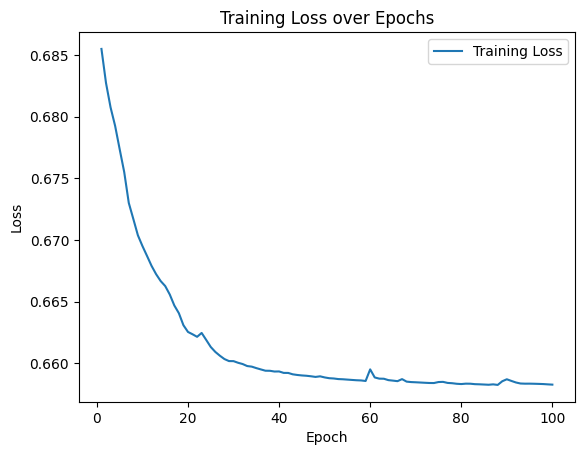

In [27]:
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from tqdm import tqdm  # 進捗バー表示のためにtqdmをインポート
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        # 特徴量を読み込む
        features_file = os.path.join(folder_path, f"re_features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"re_labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        # DataFrameからnumpy配列に変換し、PyTorchのTensorに変換
        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 're_prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用と評価用に分ける関数
def split_data(X_list, y_list, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X_list, y_list, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# 学習データと評価データに分割
X_train, X_test, y_train, y_test = split_data(X_list, y_list)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)  # LSTMの出力
        out = self.fc(out)  # 全ての時間ステップの出力を使用
        return out

# モデル学習のための関数
def train_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()  # 損失関数
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    losses = []  # 各エポックの損失を記録するリスト

    for epoch in range(num_epochs):
        total_loss = 0.0
        
        # tqdmでエポック全体の進捗バーを表示（全バッチを100%とする）
        with tqdm(total=len(X_train), desc=f"Epoch {epoch+1}/{num_epochs}", unit="batch") as pbar:
            for i, (inputs, labels) in enumerate(zip(X_train, y_train)):
                # バッチ化されたデータをモデルに渡して予測を取得
                inputs = inputs.unsqueeze(0)  # バッチ次元を追加
                labels = labels.view(-1)  # ラベルを1次元に変換
                
                outputs = model(inputs)
                
                # 出力とラベルの形を一致させる
                outputs = outputs.view(-1, outputs.size(-1))
                
                # 損失計算
                loss = criterion(outputs, labels)
                total_loss += loss.item()
                
                # バックプロパゲーション
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # バッチごとに進捗を更新
                pbar.update(1)

        # 各エポックの平均損失を保存
        avg_loss = total_loss / len(X_train)
        losses.append(avg_loss)

        # 各エポックの平均損失を出力
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    # 学習の進行状況をプロット
    plt.plot(range(1, num_epochs + 1), losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss over Epochs')
    plt.legend()
    plt.show()

# モデルの初期化（ラベルが0, 1の場合は output_size = 2 とする）
input_size = 5  # 特徴量の数（Mean, Max, Min, Std, Median）
hidden_size = 64  # 隠れ層のユニット数
output_size = 2  # ラベルの範囲が 0, 1 ならば output_size = 2
num_layers = 1  # LSTMのレイヤー数

model = LSTMAccentModel(input_size, hidden_size, output_size)

# モデルの学習を実行
train_model(model, X_train, y_train)

Self-supervised Epoch [1/100], Loss: 22301.8738
Self-supervised Epoch [2/100], Loss: 5016.6736
Self-supervised Epoch [3/100], Loss: 919.6137
Self-supervised Epoch [4/100], Loss: 226.4994
Self-supervised Epoch [5/100], Loss: 141.2694
Self-supervised Epoch [6/100], Loss: 119.0354
Self-supervised Epoch [7/100], Loss: 97.0440
Self-supervised Epoch [8/100], Loss: 79.5188
Self-supervised Epoch [9/100], Loss: 65.6941
Self-supervised Epoch [10/100], Loss: 54.7458
Self-supervised Epoch [11/100], Loss: 47.7290
Self-supervised Epoch [12/100], Loss: 41.4153
Self-supervised Epoch [13/100], Loss: 36.5662
Self-supervised Epoch [14/100], Loss: 31.9327
Self-supervised Epoch [15/100], Loss: 27.3527
Self-supervised Epoch [16/100], Loss: 24.0962
Self-supervised Epoch [17/100], Loss: 22.0728
Self-supervised Epoch [18/100], Loss: 19.9611
Self-supervised Epoch [19/100], Loss: 17.6792
Self-supervised Epoch [20/100], Loss: 16.3749
Self-supervised Epoch [21/100], Loss: 15.7779
Self-supervised Epoch [22/100], Lo

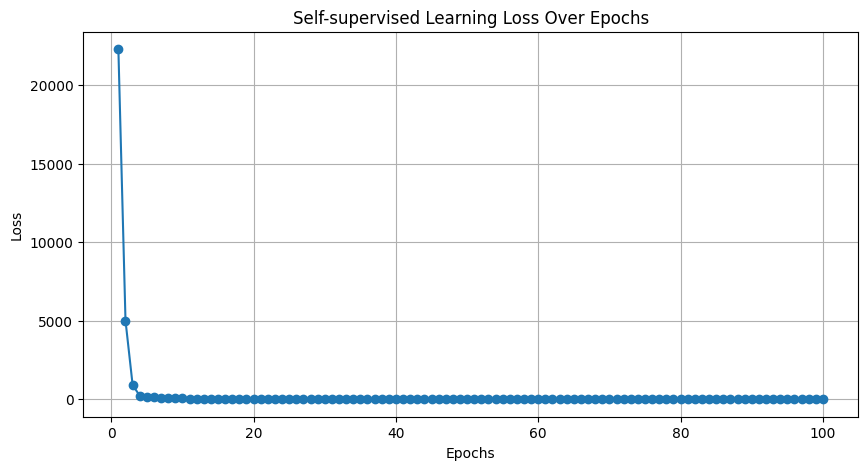

In [23]:
# 学習用：3500, ファインチューニング用：750, 評価用；750
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        features_file = os.path.join(folder_path, f"re_features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"re_labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 're_prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用、ファインチューニング用、評価用に分ける関数
def split_data(X_list, y_list, train_size=0.7, val_size=0.15, random_state=42):
    # 学習用データと残りを分割
    X_train, X_temp, y_train, y_temp = train_test_split(X_list, y_list, test_size=(1 - train_size), random_state=random_state)

    # 残りのデータをファインチューニング用と評価用に分割
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=(0.5), random_state=random_state)

    return X_train, y_train, X_val, y_val, X_test, y_test

# 学習データ、ファインチューニングデータ、評価データに分割
X_train, y_train, X_val, y_val, X_test, y_test = split_data(X_list, y_list, train_size=3500/5000, val_size=750/5000)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習用のモデルを定義
class SelfSupervisedModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SelfSupervisedModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習モデルの初期化
self_supervised_model = SelfSupervisedModel(input_size=5, hidden_size=64)

# 自己教師あり学習のトレーニングループ
def train_self_supervised_model(model, X_train, num_epochs=100, learning_rate=0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0
        for inputs in X_train:
            inputs = inputs.unsqueeze(0)
            outputs = model(inputs)

            loss = criterion(outputs, inputs)
            total_loss += loss.item()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)
        print(f"Self-supervised Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Self-supervised Learning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# 自己教師あり学習の実行
train_self_supervised_model(self_supervised_model, X_train)

In [24]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=56, output_size=2)

# ファインチューニングの実行
def fine_tune_model(model, X_val, y_val, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_val, y_val):
            inputs = inputs.unsqueeze(0)
            labels = labels.view(-1)
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            loss = criterion(outputs, labels)
            total_loss += loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_val)
        loss_history.append(avg_loss)
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_val, y_val)

IndexError: Target 2 is out of bounds.

In [28]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# 評価関数の定義
def evaluate_model(model, X_test, y_test):
    model.eval()  # 評価モードに切り替え
    predictions = []

    with torch.no_grad():  # 勾配計算を無効に
        for inputs in X_test:
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 2)  # 最も高いスコアを持つクラスを選択
            predictions.append(predicted.view(-1))

    # すべての予測を連結
    predicted_tensor = torch.cat(predictions)
    
    # y_testを連結
    y_test_tensor = torch.cat(y_test)
    
    # 正解率を計算
    accuracy = accuracy_score(y_test_tensor.numpy(), predicted_tensor.numpy())
    return accuracy, y_test_tensor, predicted_tensor

# 評価の実行
accuracy, y_test_tensor, predicted_tensor = evaluate_model(model, X_test, y_test)

# 一致率を出力
print(f'Accuracy on the test set: {accuracy:.4f}')

Accuracy on the test set: 0.5920


In [29]:
# 予測結果の保存
import os
import pandas as pd

# 保存するフォルダの作成
output_dir = 're_predicted_accents'
os.makedirs(output_dir, exist_ok=True)

# 評価関数の修正: 予測結果をCSVファイルに保存
def save_predictions_to_csv(model, X_test, y_test, output_dir):
    model.eval()  # 評価モードに切り替え

    with torch.no_grad():  # 勾配計算を無効に
        for i, inputs in enumerate(X_test):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 2)  # 最も高いスコアを持つクラスを選択
            
            # 予測結果をTensorからNumPy配列に変換
            predicted_np = predicted.view(-1).numpy()
            
            # CSVファイルに保存
            file_name = os.path.join(output_dir, f're_predicted_accent_{i+1}.csv')
            pd.DataFrame(predicted_np, columns=['Predicted Accent']).to_csv(file_name, index=False)

# 予測結果を保存
save_predictions_to_csv(model, X_test, y_test, output_dir)

print(f"Predicted accents saved in the '{output_dir}' directory.")

Predicted accents saved in the 're_predicted_accents' directory.


In [30]:
import os
import pandas as pd
import torch

# フォルダのパスを指定
predicted_dir = 're_predicted_accents'

# y_testをリストに変換する関数
def load_y_test_tensor(y_test):
    return [tensor.numpy() for tensor in y_test]  # TensorをNumPy配列に変換してリストに追加

# y_testをリスト形式でロード
y_test_list = load_y_test_tensor(y_test)

# 一致数をカウントするための変数を初期化
total_matches = 0
total_samples = 0
match_class_0 = 0
match_class_1 = 0

# 各クラスの総数をカウントするための変数を初期化
total_class_0 = 0
total_class_1 = 0

# 予測結果をロードして一致をカウント
for i in range(1, 1001):  # predicted_accent_1.csv から predicted_accent_1000.csv まで
    file_name = os.path.join(predicted_dir, f're_predicted_accent_{i}.csv')
    
    if os.path.exists(file_name):
        # CSVファイルを読み込む
        predicted_df = pd.read_csv(file_name)
        predicted_array = predicted_df['Predicted Accent'].to_numpy()

        # 一致数をカウント
        if i <= len(y_test_list):  # y_testの範囲内であるか確認
            total_matches += (predicted_array == y_test_list[i - 1]).sum()
            total_samples += len(predicted_array)

            # クラス0とクラス1の一致数と総数をカウント
            match_class_0 += ((predicted_array == 0) & (y_test_list[i - 1] == 0)).sum()
            match_class_1 += ((predicted_array == 1) & (y_test_list[i - 1] == 1)).sum()

            total_class_0 += (y_test_list[i - 1] == 0).sum()
            total_class_1 += (y_test_list[i - 1] == 1).sum()

# 各クラスの一致率を計算
accuracy_class_0 = match_class_0 / total_class_0 if total_class_0 > 0 else 0
accuracy_class_1 = match_class_1 / total_class_1 if total_class_1 > 0 else 0

# 結果を出力
print(f'(下降)クラス0の一致数: {match_class_0} / クラス0の総数: {total_class_0} / 一致率: {match_class_0}/{total_class_0} = {accuracy_class_0:.4f}')
print(f'(上昇)クラス1の一致数: {match_class_1} / クラス1の総数: {total_class_1} / 一致率: {match_class_1}/{total_class_1} = {accuracy_class_1:.4f}')

(下降)クラス0の一致数: 7276 / クラス0の総数: 17205 / 一致率: 7276/17205 = 0.4229
(上昇)クラス1の一致数: 13138 / クラス1の総数: 17281 / 一致率: 13138/17281 = 0.7603


Self-supervised Epoch [1/100], Loss: 23338.1665
Self-supervised Epoch [2/100], Loss: 5753.6708
Self-supervised Epoch [3/100], Loss: 1248.7325
Self-supervised Epoch [4/100], Loss: 287.9274
Self-supervised Epoch [5/100], Loss: 142.9868
Self-supervised Epoch [6/100], Loss: 111.8242
Self-supervised Epoch [7/100], Loss: 94.2514
Self-supervised Epoch [8/100], Loss: 73.6290
Self-supervised Epoch [9/100], Loss: 64.6080
Self-supervised Epoch [10/100], Loss: 56.5113
Self-supervised Epoch [11/100], Loss: 47.7437
Self-supervised Epoch [12/100], Loss: 41.9186
Self-supervised Epoch [13/100], Loss: 37.0932
Self-supervised Epoch [14/100], Loss: 32.1414
Self-supervised Epoch [15/100], Loss: 28.4720
Self-supervised Epoch [16/100], Loss: 26.5717
Self-supervised Epoch [17/100], Loss: 22.2552
Self-supervised Epoch [18/100], Loss: 20.2739
Self-supervised Epoch [19/100], Loss: 18.5949
Self-supervised Epoch [20/100], Loss: 16.4415
Self-supervised Epoch [21/100], Loss: 16.6557
Self-supervised Epoch [22/100], L

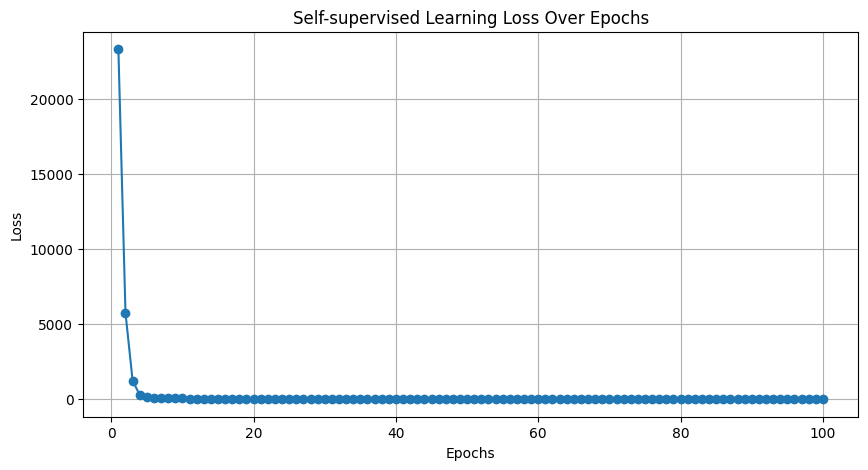

In [15]:
# 再実験(0, 1, 2)
# 学習用：3500, ファインチューニング用：750, 評価用；750
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# データをロードする関数
def load_csv_data(folder_path, num_files=5000):
    X_list = []
    y_list = []

    for i in range(1, num_files + 1):
        features_file = os.path.join(folder_path, f"features_audio_{i}.csv")
        labels_file = os.path.join(folder_path, f"labels_audio_{i}.csv")

        df_X = pd.read_csv(features_file)
        df_y = pd.read_csv(labels_file)

        X = torch.tensor(df_X.values, dtype=torch.float32)
        y = torch.tensor(df_y.values.flatten(), dtype=torch.long)

        X_list.append(X)
        y_list.append(y)

    return X_list, y_list

# 特徴量とラベルのロード
folder_path = 'prepared_features_data'
X_list, y_list = load_csv_data(folder_path)

# データを学習用、ファインチューニング用、評価用に分ける関数
def split_data(X_list, y_list, train_size=0.7, val_size=0.15, random_state=42):
    # 学習用データと残りを分割
    X_train, X_temp, y_train, y_temp = train_test_split(X_list, y_list, test_size=(1 - train_size), random_state=random_state)

    # 残りのデータをファインチューニング用と評価用に分割
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=(0.5), random_state=random_state)

    return X_train, y_train, X_val, y_val, X_test, y_test

# 学習データ、ファインチューニングデータ、評価データに分割
X_train, y_train, X_val, y_val, X_test, y_test = split_data(X_list, y_list, train_size=3500/5000, val_size=750/5000)

# LSTMモデル定義
class LSTMAccentModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1):
        super(LSTMAccentModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習用のモデルを定義
class SelfSupervisedModel(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SelfSupervisedModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 自己教師あり学習モデルの初期化
self_supervised_model = SelfSupervisedModel(input_size=5, hidden_size=64)

# 自己教師あり学習のトレーニングループ
def train_self_supervised_model(model, X_train, num_epochs=100, learning_rate=0.001):
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0
        for inputs in X_train:
            inputs = inputs.unsqueeze(0)
            outputs = model(inputs)

            loss = criterion(outputs, inputs)
            total_loss += loss.item()
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)
        print(f"Self-supervised Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Self-supervised Learning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# 自己教師あり学習の実行
train_self_supervised_model(self_supervised_model, X_train)

Fine-tuning Epoch [1/100], Loss: 0.7712
Fine-tuning Epoch [2/100], Loss: 0.7622
Fine-tuning Epoch [3/100], Loss: 0.7593
Fine-tuning Epoch [4/100], Loss: 0.7561
Fine-tuning Epoch [5/100], Loss: 0.7540
Fine-tuning Epoch [6/100], Loss: 0.7521
Fine-tuning Epoch [7/100], Loss: 0.7506
Fine-tuning Epoch [8/100], Loss: 0.7495
Fine-tuning Epoch [9/100], Loss: 0.7487
Fine-tuning Epoch [10/100], Loss: 0.7472
Fine-tuning Epoch [11/100], Loss: 0.7461
Fine-tuning Epoch [12/100], Loss: 0.7453
Fine-tuning Epoch [13/100], Loss: 0.7444
Fine-tuning Epoch [14/100], Loss: 0.7436
Fine-tuning Epoch [15/100], Loss: 0.7422
Fine-tuning Epoch [16/100], Loss: 0.7390
Fine-tuning Epoch [17/100], Loss: 0.7364
Fine-tuning Epoch [18/100], Loss: 0.7334
Fine-tuning Epoch [19/100], Loss: 0.7300
Fine-tuning Epoch [20/100], Loss: 0.7271
Fine-tuning Epoch [21/100], Loss: 0.7244
Fine-tuning Epoch [22/100], Loss: 0.7227
Fine-tuning Epoch [23/100], Loss: 0.7211
Fine-tuning Epoch [24/100], Loss: 0.7204
Fine-tuning Epoch [25/100

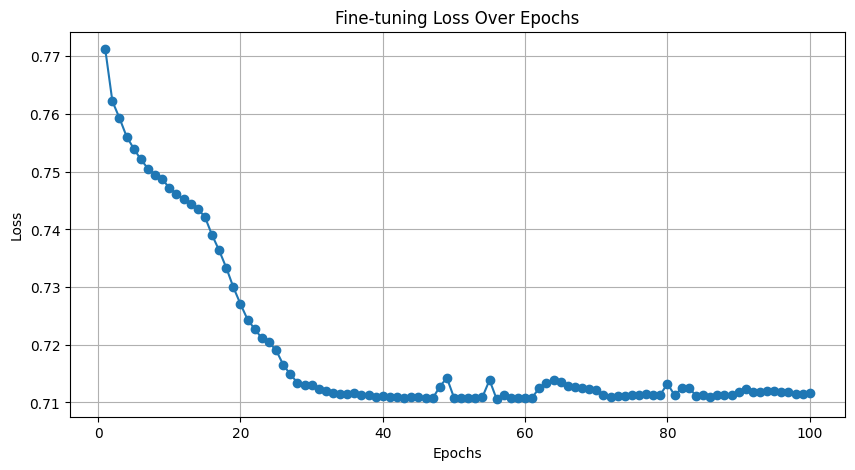

In [16]:
# ファインチューニングのためのLSTMモデルの初期化
model = LSTMAccentModel(input_size=5, hidden_size=56, output_size=3)

# ファインチューニングの実行
def fine_tune_model(model, X_train, y_train, num_epochs=100, learning_rate=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    loss_history = []

    for epoch in range(num_epochs):
        total_loss = 0.0
        for inputs, labels in zip(X_train, y_train):
            inputs = inputs.unsqueeze(0)
            labels = labels.view(-1)
            
            outputs = model(inputs)
            outputs = outputs.view(-1, outputs.size(-1))

            loss = criterion(outputs, labels)
            total_loss += loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(X_train)
        loss_history.append(avg_loss)
        print(f"Fine-tuning Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}")

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), loss_history, marker='o')
    plt.title('Fine-tuning Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid()
    plt.show()

# ファインチューニングの実行
fine_tune_model(model, X_train, y_train)

In [17]:
# 予測結果の保存
import os
import pandas as pd

# 保存するフォルダの作成
output_dir = 'predicted_accents'
os.makedirs(output_dir, exist_ok=True)

# 評価関数の修正: 予測結果をCSVファイルに保存
def save_predictions_to_csv(model, X_test, y_test, output_dir):
    model.eval()  # 評価モードに切り替え

    with torch.no_grad():  # 勾配計算を無効に
        for i, inputs in enumerate(X_test):
            inputs = inputs.unsqueeze(0)  # バッチ次元を追加
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 2)  # 最も高いスコアを持つクラスを選択
            
            # 予測結果をTensorからNumPy配列に変換
            predicted_np = predicted.view(-1).numpy()
            
            # CSVファイルに保存
            file_name = os.path.join(output_dir, f'predicted_accent_{i+1}.csv')
            pd.DataFrame(predicted_np, columns=['Predicted Accent']).to_csv(file_name, index=False)

# 予測結果を保存
save_predictions_to_csv(model, X_test, y_test, output_dir)

print(f"Predicted accents saved in the '{output_dir}' directory.")

Predicted accents saved in the 'predicted_accents' directory.


In [18]:
import os
import pandas as pd
import torch

# フォルダのパスを指定
predicted_dir = 'predicted_accents'

# y_testをリストに変換する関数
def load_y_test_tensor(y_test):
    return [tensor.numpy() for tensor in y_test]  # TensorをNumPy配列に変換してリストに追加

# y_testをリスト形式でロード
y_test_list = load_y_test_tensor(y_test)

# 一致数をカウントするための変数を初期化
total_matches = 0
total_samples = 0
match_class_0 = 0
match_class_1 = 0
match_class_2 = 0

# 各クラスの総数をカウントするための変数を初期化
total_class_0 = 0
total_class_1 = 0
total_class_2 = 0

# 予測結果をロードして一致をカウント
for i in range(1, 1001):  # predicted_accent_1.csv から predicted_accent_1000.csv まで
    file_name = os.path.join(predicted_dir, f'predicted_accent_{i}.csv')
    
    if os.path.exists(file_name):
        # CSVファイルを読み込む
        predicted_df = pd.read_csv(file_name)
        predicted_array = predicted_df['Predicted Accent'].to_numpy()

        # 一致数をカウント
        if i <= len(y_test_list):  # y_testの範囲内であるか確認
            total_matches += (predicted_array == y_test_list[i - 1]).sum()
            total_samples += len(predicted_array)

            # 各クラスの一致数と総数をカウント
            match_class_0 += ((predicted_array == 0) & (y_test_list[i - 1] == 0)).sum()
            match_class_1 += ((predicted_array == 1) & (y_test_list[i - 1] == 1)).sum()
            match_class_2 += ((predicted_array == 2) & (y_test_list[i - 1] == 2)).sum()

            total_class_0 += (y_test_list[i - 1] == 0).sum()
            total_class_1 += (y_test_list[i - 1] == 1).sum()
            total_class_2 += (y_test_list[i - 1] == 2).sum()

# 各クラスの一致率を計算
accuracy_class_0 = match_class_0 / total_class_0 if total_class_0 > 0 else 0
accuracy_class_1 = match_class_1 / total_class_1 if total_class_1 > 0 else 0
accuracy_class_2 = match_class_2 / total_class_2 if total_class_2 > 0 else 0

# 結果を出力
print(f'クラス0の一致数: {match_class_0} / クラス0の総数: {total_class_0} / 一致率: {match_class_0}/{total_class_0} = {accuracy_class_0:.4f}')
print(f'クラス1の一致数: {match_class_1} / クラス1の総数: {total_class_1} / 一致率: {match_class_1}/{total_class_1} = {accuracy_class_1:.4f}')
print(f'クラス2の一致数: {match_class_2} / クラス2の総数: {total_class_2} / 一致率: {match_class_2}/{total_class_2} = {accuracy_class_2:.4f}')

クラス0の一致数: 19001 / クラス0の総数: 19124 / 一致率: 19001/19124 = 0.9936
クラス1の一致数: 3 / クラス1の総数: 3385 / 一致率: 3/3385 = 0.0009
クラス2の一致数: 588 / クラス2の総数: 3799 / 一致率: 588/3799 = 0.1548
